# Download the dataset and supporting codes and pre-trained models

https://drive.google.com/file/d/1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt/view?usp=drivesdk

https://drive.google.com/file/d/1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu/view?usp=drivesdk

https://drive.google.com/file/d/1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro/view?usp=drivesdk

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
"""
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())
id_to_fn = {
# '1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc': 'edges2shoes.zip',
'1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt': 'edges2shoes.zip',
'1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu': 'CycleGAN_support.zip',
# '1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro': 'test_case.zip',
'1l7gHikhCz64hYHL4n_Ps7nufQcddcRyR': 'test_case.zip'

}
# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)
"""

'\nfrom google.colab import auth\nauth.authenticate_user()\nfrom googleapiclient.discovery import build\ndrive_service = build(\'drive\', \'v3\')\nimport io\nimport os\nfrom googleapiclient.http import MediaIoBaseDownload\ndef download_file(fn, file_id):\n    request = drive_service.files().get_media(fileId=file_id)\n    downloaded = io.BytesIO()\n    downloader = MediaIoBaseDownload(downloaded, request)\n    done = False\n    while done is False:\n        # _ is a placeholder for a progress object that we ignore.\n        # (Our file is small, so we skip reporting progress.)\n        _, done = downloader.next_chunk()\n    downloaded.seek(0)\n    folder = fn.split(\'/\')\n    if len(folder) > 1:\n        os.makedirs(folder[0], exist_ok=True)\n    with open(fn, \'wb\') as f:\n        f.write(downloaded.read())\nid_to_fn = {\n# \'1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc\': \'edges2shoes.zip\',\n\'1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt\': \'edges2shoes.zip\',\n\'1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu\': \

In [3]:
! unzip -q "/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/edge2shoes.zip"
#! unzip -q CycleGAN_support.zip
! unzip -q "/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/test_case_CYCLEGAN.zip"

# CycleGAN training (TODO)

### Upload models.py and datasets.py at this point

In [ ]:
## we will do checkpointing while training the model. So make loss directory
#import os
#os.mkdir('/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/cyclegan_losses2/')

In [4]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
#from datasets import *
from datasets import *

from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt

In [7]:
import torch
import pdb

D_A = torch.load('test_case/D_A.pt')
D_B = torch.load('test_case/D_B.pt')
G_BA = torch.load('test_case/G_BA.pt')
G_AB = torch.load('test_case/G_AB.pt')
valid = torch.load('test_case/valid.pt')
fake = torch.load('test_case/fake.pt')
fake_A = torch.load('test_case/fake_A.pt')
fake_B = torch.load('test_case/fake_B.pt')
real_A = torch.load('test_case/real_A.pt')
real_B = torch.load('test_case/real_B.pt')
criterion_GAN = torch.load('test_case/criterion_GAN.pt')
criterion_cycle = torch.load('test_case/criterion_cycle.pt')



def loss_discriminator(fakefG, D, real2D, valid, fake, criterion_GAN):
    '''
    loss_discriminator function is applied to compute loss for discriminator D_A and D_B,
    For example, we want to compute loss for D_A. The loss is consisted of two parts:
    D(real_A) and D(G(real_B)). We want to penalize the distance between D(real_A) part and 1 and
    distance between D(G(real_B)) part and 0.
    We will want to first compute discriminator loss given real_A and valid, which is all 1.
    Then we want to forward real_A through G_AB network to get fake image batch
    and compute discriminator loss given fake batch and fake, which is all 0.
    Finall, add up these two loss as the total discriminator loss.
    '''
    #valid - all 1s, fake - all 0s
    #criterion - MSE loss
    #fakefG - fake image , real2D - real image
    #D - discriminator object
    #loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)
    #loss_discriminator(fake_B, D_B, real_B, valid, fake, criterion_GAN)
    # as seen above funcn is called twice seaparately for A and B images. Later they are added


    #i got retain_graph error since there are 2 objects on which backward prop is to be done. So i use detach below
    fake_img_batch = D(fakefG.detach())
    real_img_batch = D(real2D.detach())
    loss_partone = criterion_GAN(real_img_batch,valid)
    loss_parttwo = criterion_GAN(fake_img_batch,fake)
    loss_D = loss_partone+loss_parttwo

    return loss_D



def loss_generator(G, real2G, D, valid, criterion_GAN):
    '''
    loss_generator function is applied to compute loss for both generator G_AB and G_BA:
    For example, we want to compute the loss for G_AB.
    real2G will be the real image in domain A, then we map real2G into domain B to get fake B,
    then we compute the loss between D_B(fake_B) and valid, which is all 1.
    The fake_B image will also be one of the outputs, since we want to use it in the loss_cycle_consis.
    '''
    #real2G -> pass through G -> fakeB -> Loss(D(fakeB),1) -> return loss and fakeB
    #function call given below
    #loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
    #loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)

    fake_o_G = G.forward(real2G)
    loss_G = criterion_GAN(D.forward(fake_o_G), valid)

    return loss_G, fake_o_G




def loss_cycle_consis(G, fakefG, real, criterion_cycle):
    '''
    loss_cycle_consis function is applied to both cycle consistency loss:
    between recovered A and original A,
    between recovered B and original B.
    For example, we want to compute the cycle consistency loss between recovered A and original A.
    fake2G will be the generated image in domain B, then we map fake2G back into domain A to get recovered A,
    then we compute the loss between recovered A and original A
    '''
    #loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
    #Based on function call above, If fakefG is of domain B then real is of domain A, and generator expects B to produce in A
    recovered_img = G(fakefG)
    loss_cycle = criterion_cycle(recovered_img, real)

    return loss_cycle



# test case

test_loss_GAN_AB = torch.load('test_case/loss_GAN_AB.pt')
test_loss_cycle_A = torch.load('test_case/loss_cycle_A.pt')
test_loss_D_A = torch.load('test_case/loss_D_A.pt')
loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)

print('test case loss_D_A:', test_loss_D_A.item())
print('computed loss_D_A:', loss_D_A.item())

print('test case test_loss_GAN_AB:', test_loss_GAN_AB.item())
print('computed test_loss_GAN_AB:', loss_GAN_AB.item())

print('test case loss_cycle_A:', test_loss_cycle_A.item())
print('computed loss_cycle_A:', loss_cycle_A.item())

test case loss_D_A: 3.1760239601135254
computed loss_D_A: 3.176023006439209
test case test_loss_GAN_AB: 3.164881467819214
computed test_loss_GAN_AB: 3.1648802757263184
test case loss_cycle_A: 0.6627261638641357
computed loss_cycle_A: 0.6627261638641357


the length of training data: 49825


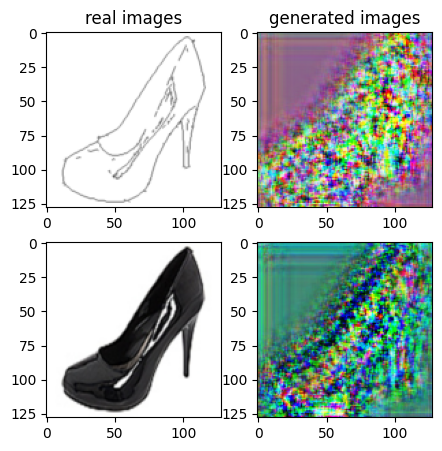

Train Epoch: 1 0% 	Total Loss: 8.971400 	Loss_G_AB: 1.601425	Loss_G_BA: 1.542889	Loss_cycle: 5.152561	Loss_D_A: 1.110458	Loss_D_B: 1.136224
0 9 T:  1.6663849353790283
Train Epoch: 1 0% 	Total Loss: 5.653841 	Loss_G_AB: 1.439149	Loss_G_BA: 1.310844	Loss_cycle: 2.162249	Loss_D_A: 1.027847	Loss_D_B: 1.088748
0 19 T:  0.7700552940368652
Train Epoch: 1 0% 	Total Loss: 4.404849 	Loss_G_AB: 1.002575	Loss_G_BA: 0.861579	Loss_cycle: 2.085465	Loss_D_A: 0.769943	Loss_D_B: 0.617364
0 29 T:  0.7800910472869873
Train Epoch: 1 0% 	Total Loss: 3.400526 	Loss_G_AB: 0.885344	Loss_G_BA: 0.824104	Loss_cycle: 1.577094	Loss_D_A: 0.478403	Loss_D_B: 0.490306
0 39 T:  0.8012330532073975
Train Epoch: 1 0% 	Total Loss: 3.346743 	Loss_G_AB: 0.892151	Loss_G_BA: 0.901084	Loss_cycle: 1.357074	Loss_D_A: 0.495313	Loss_D_B: 0.597740
0 49 T:  0.7510166168212891
Train Epoch: 1 0% 	Total Loss: 3.372632 	Loss_G_AB: 0.829411	Loss_G_BA: 0.822213	Loss_cycle: 1.474293	Loss_D_A: 0.491618	Loss_D_B: 0.580907
0 59 T:  0.7927093505

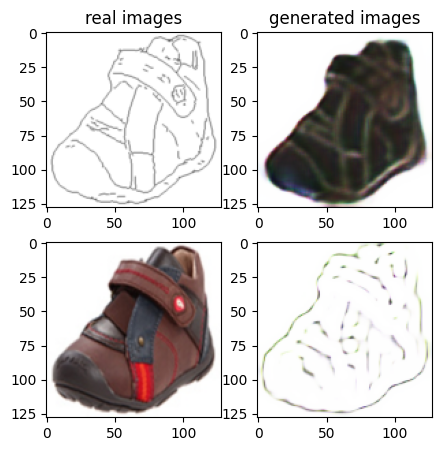

Train Epoch: 1 2% 	Total Loss: 1.757298 	Loss_G_AB: 0.324797	Loss_G_BA: 0.858486	Loss_cycle: 0.751229	Loss_D_A: 0.102124	Loss_D_B: 0.312303
0 1009 T:  2.132558584213257
Train Epoch: 1 2% 	Total Loss: 1.870774 	Loss_G_AB: 0.360053	Loss_G_BA: 0.675464	Loss_cycle: 0.943459	Loss_D_A: 0.161817	Loss_D_B: 0.247740
0 1019 T:  0.7754065990447998
Train Epoch: 1 2% 	Total Loss: 1.611421 	Loss_G_AB: 0.309788	Loss_G_BA: 0.743606	Loss_cycle: 0.778022	Loss_D_A: 0.079032	Loss_D_B: 0.227671
0 1029 T:  0.8156046867370605
Train Epoch: 1 2% 	Total Loss: 1.960002 	Loss_G_AB: 0.354340	Loss_G_BA: 0.715811	Loss_cycle: 0.983111	Loss_D_A: 0.191323	Loss_D_B: 0.250492
0 1039 T:  0.5988984107971191
Train Epoch: 1 2% 	Total Loss: 1.763358 	Loss_G_AB: 0.310000	Loss_G_BA: 0.537756	Loss_cycle: 0.856260	Loss_D_A: 0.219088	Loss_D_B: 0.264133
0 1049 T:  0.5821311473846436
Train Epoch: 1 2% 	Total Loss: 1.675149 	Loss_G_AB: 0.331885	Loss_G_BA: 0.770200	Loss_cycle: 0.803490	Loss_D_A: 0.086433	Loss_D_B: 0.234183
0 1059 T:  

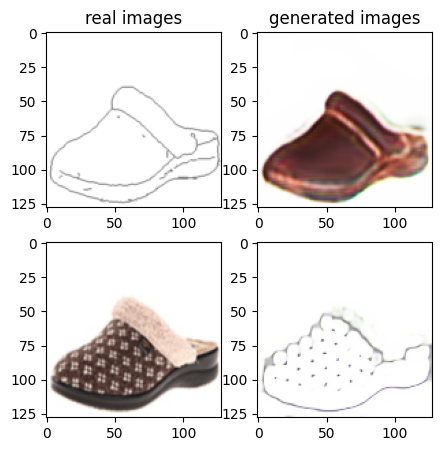

Train Epoch: 1 4% 	Total Loss: 1.408922 	Loss_G_AB: 0.315224	Loss_G_BA: 0.719420	Loss_cycle: 0.571015	Loss_D_A: 0.088996	Loss_D_B: 0.231590
0 2009 T:  1.453597068786621
Train Epoch: 1 4% 	Total Loss: 1.600850 	Loss_G_AB: 0.321593	Loss_G_BA: 0.808872	Loss_cycle: 0.704024	Loss_D_A: 0.085846	Loss_D_B: 0.245748
0 2019 T:  0.5709242820739746
Train Epoch: 1 4% 	Total Loss: 1.744897 	Loss_G_AB: 0.383083	Loss_G_BA: 0.695939	Loss_cycle: 0.840015	Loss_D_A: 0.123916	Loss_D_B: 0.241455
0 2029 T:  0.5876832008361816
Train Epoch: 1 4% 	Total Loss: 1.690869 	Loss_G_AB: 0.315467	Loss_G_BA: 0.666482	Loss_cycle: 0.773123	Loss_D_A: 0.184601	Loss_D_B: 0.242170
0 2039 T:  0.5938262939453125
Train Epoch: 1 4% 	Total Loss: 1.547309 	Loss_G_AB: 0.329025	Loss_G_BA: 0.617268	Loss_cycle: 0.687303	Loss_D_A: 0.158356	Loss_D_B: 0.228504
0 2049 T:  0.5891392230987549
Train Epoch: 1 4% 	Total Loss: 1.682017 	Loss_G_AB: 0.345239	Loss_G_BA: 0.670126	Loss_cycle: 0.759575	Loss_D_A: 0.159338	Loss_D_B: 0.255423
0 2059 T:  

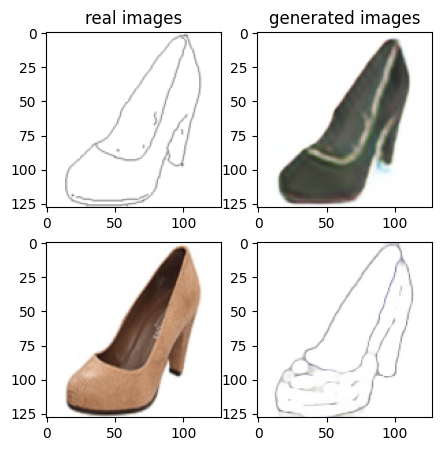

Train Epoch: 1 6% 	Total Loss: 1.509495 	Loss_G_AB: 0.312666	Loss_G_BA: 0.847092	Loss_cycle: 0.630564	Loss_D_A: 0.054384	Loss_D_B: 0.244667
0 3009 T:  1.35612154006958
Train Epoch: 1 6% 	Total Loss: 1.524490 	Loss_G_AB: 0.314213	Loss_G_BA: 0.786914	Loss_cycle: 0.653686	Loss_D_A: 0.093400	Loss_D_B: 0.226841
0 3019 T:  0.5727462768554688
Train Epoch: 1 6% 	Total Loss: 1.573947 	Loss_G_AB: 0.319475	Loss_G_BA: 0.826242	Loss_cycle: 0.689986	Loss_D_A: 0.062273	Loss_D_B: 0.248830
0 3029 T:  0.579683780670166
Train Epoch: 1 6% 	Total Loss: 1.420939 	Loss_G_AB: 0.318826	Loss_G_BA: 0.723248	Loss_cycle: 0.513588	Loss_D_A: 0.113874	Loss_D_B: 0.272440
0 3039 T:  0.5634670257568359
Train Epoch: 1 6% 	Total Loss: 1.854979 	Loss_G_AB: 0.314960	Loss_G_BA: 0.870461	Loss_cycle: 0.932933	Loss_D_A: 0.075430	Loss_D_B: 0.253906
0 3049 T:  0.6048333644866943
Train Epoch: 1 6% 	Total Loss: 1.646704 	Loss_G_AB: 0.321090	Loss_G_BA: 0.774462	Loss_cycle: 0.767338	Loss_D_A: 0.095015	Loss_D_B: 0.236575
0 3059 T:  0.

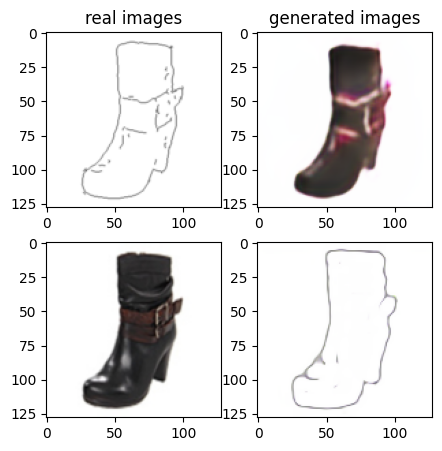

Train Epoch: 1 8% 	Total Loss: 1.421036 	Loss_G_AB: 0.268442	Loss_G_BA: 0.704409	Loss_cycle: 0.577683	Loss_D_A: 0.098135	Loss_D_B: 0.258792
0 4009 T:  1.5094342231750488
Train Epoch: 1 8% 	Total Loss: 1.446932 	Loss_G_AB: 0.301682	Loss_G_BA: 0.866941	Loss_cycle: 0.554814	Loss_D_A: 0.031776	Loss_D_B: 0.276031
0 4019 T:  0.5889456272125244
Train Epoch: 1 8% 	Total Loss: 1.403749 	Loss_G_AB: 0.303760	Loss_G_BA: 0.669291	Loss_cycle: 0.508113	Loss_D_A: 0.130583	Loss_D_B: 0.278527
0 4029 T:  0.5864861011505127
Train Epoch: 1 8% 	Total Loss: 1.415796 	Loss_G_AB: 0.301447	Loss_G_BA: 0.687036	Loss_cycle: 0.584153	Loss_D_A: 0.071335	Loss_D_B: 0.266067
0 4039 T:  0.5821094512939453
Train Epoch: 1 8% 	Total Loss: 1.392585 	Loss_G_AB: 0.293770	Loss_G_BA: 0.745431	Loss_cycle: 0.530686	Loss_D_A: 0.095566	Loss_D_B: 0.246733
0 4049 T:  0.6049599647521973
Train Epoch: 1 8% 	Total Loss: 1.618131 	Loss_G_AB: 0.280908	Loss_G_BA: 0.888050	Loss_cycle: 0.739290	Loss_D_A: 0.052762	Loss_D_B: 0.241600
0 4059 T: 

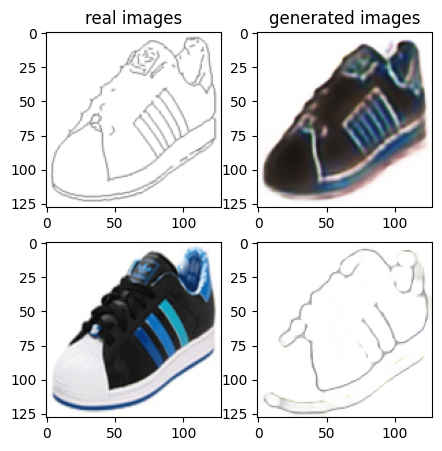

Train Epoch: 1 10% 	Total Loss: 1.369190 	Loss_G_AB: 0.263767	Loss_G_BA: 0.781681	Loss_cycle: 0.537957	Loss_D_A: 0.057340	Loss_D_B: 0.251169
0 5009 T:  1.382819414138794
Train Epoch: 1 10% 	Total Loss: 1.368550 	Loss_G_AB: 0.256310	Loss_G_BA: 0.735761	Loss_cycle: 0.533686	Loss_D_A: 0.080362	Loss_D_B: 0.258468
0 5019 T:  0.5889406204223633
Train Epoch: 1 10% 	Total Loss: 1.555008 	Loss_G_AB: 0.261240	Loss_G_BA: 0.795559	Loss_cycle: 0.628507	Loss_D_A: 0.129016	Loss_D_B: 0.269085
0 5029 T:  0.7300722599029541
Train Epoch: 1 10% 	Total Loss: 1.499658 	Loss_G_AB: 0.261269	Loss_G_BA: 0.762747	Loss_cycle: 0.677497	Loss_D_A: 0.055848	Loss_D_B: 0.254305
0 5039 T:  0.7846100330352783
Train Epoch: 1 10% 	Total Loss: 1.399513 	Loss_G_AB: 0.260487	Loss_G_BA: 0.939080	Loss_cycle: 0.457945	Loss_D_A: 0.083901	Loss_D_B: 0.257883
0 5049 T:  0.8384082317352295
Train Epoch: 1 10% 	Total Loss: 1.506879 	Loss_G_AB: 0.268390	Loss_G_BA: 0.672045	Loss_cycle: 0.686674	Loss_D_A: 0.092002	Loss_D_B: 0.257986
0 505

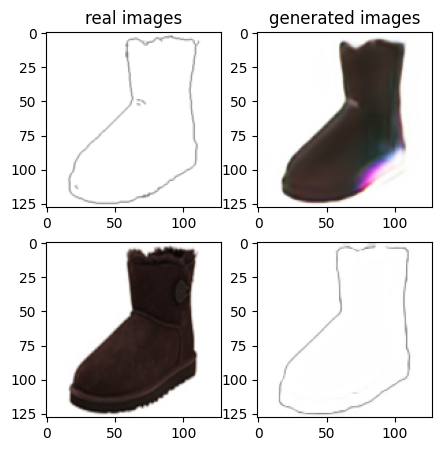

Train Epoch: 1 12% 	Total Loss: 1.436765 	Loss_G_AB: 0.274607	Loss_G_BA: 0.711966	Loss_cycle: 0.561030	Loss_D_A: 0.128697	Loss_D_B: 0.253751
0 6009 T:  1.990508794784546
Train Epoch: 1 12% 	Total Loss: 1.605372 	Loss_G_AB: 0.266472	Loss_G_BA: 0.840757	Loss_cycle: 0.716927	Loss_D_A: 0.069064	Loss_D_B: 0.265767
0 6019 T:  0.8057105541229248
Train Epoch: 1 12% 	Total Loss: 1.487825 	Loss_G_AB: 0.301039	Loss_G_BA: 0.812817	Loss_cycle: 0.615910	Loss_D_A: 0.062448	Loss_D_B: 0.252540
0 6029 T:  0.7899432182312012
Train Epoch: 1 12% 	Total Loss: 1.639260 	Loss_G_AB: 0.282396	Loss_G_BA: 0.956497	Loss_cycle: 0.723228	Loss_D_A: 0.050583	Loss_D_B: 0.246002
0 6039 T:  0.8486828804016113
Train Epoch: 1 12% 	Total Loss: 1.467845 	Loss_G_AB: 0.266157	Loss_G_BA: 0.832486	Loss_cycle: 0.618773	Loss_D_A: 0.037073	Loss_D_B: 0.262677
0 6049 T:  0.8490021228790283
Train Epoch: 1 12% 	Total Loss: 1.376616 	Loss_G_AB: 0.266970	Loss_G_BA: 0.830443	Loss_cycle: 0.523770	Loss_D_A: 0.041919	Loss_D_B: 0.262222
0 605

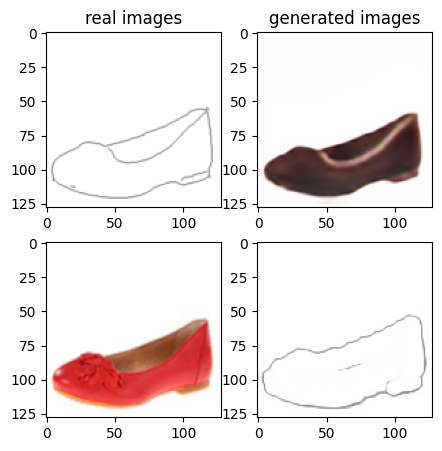

Train Epoch: 1 14% 	Total Loss: 1.655713 	Loss_G_AB: 0.318314	Loss_G_BA: 0.980945	Loss_cycle: 0.728116	Loss_D_A: 0.028261	Loss_D_B: 0.249706
0 7009 T:  1.8693170547485352
Train Epoch: 1 14% 	Total Loss: 1.623901 	Loss_G_AB: 0.306951	Loss_G_BA: 0.974989	Loss_cycle: 0.720764	Loss_D_A: 0.014556	Loss_D_B: 0.247611
0 7019 T:  0.8400788307189941
Train Epoch: 1 14% 	Total Loss: 1.567436 	Loss_G_AB: 0.323797	Loss_G_BA: 0.988908	Loss_cycle: 0.627239	Loss_D_A: 0.023353	Loss_D_B: 0.260491
0 7029 T:  0.5899035930633545
Train Epoch: 1 14% 	Total Loss: 1.419396 	Loss_G_AB: 0.289976	Loss_G_BA: 0.792964	Loss_cycle: 0.575598	Loss_D_A: 0.057092	Loss_D_B: 0.245235
0 7039 T:  0.6083953380584717
Train Epoch: 1 14% 	Total Loss: 1.637992 	Loss_G_AB: 0.290825	Loss_G_BA: 0.946762	Loss_cycle: 0.741697	Loss_D_A: 0.028870	Loss_D_B: 0.248631
0 7049 T:  0.5859980583190918
Train Epoch: 1 14% 	Total Loss: 1.352591 	Loss_G_AB: 0.304875	Loss_G_BA: 0.713698	Loss_cycle: 0.484429	Loss_D_A: 0.107047	Loss_D_B: 0.251828
0 70

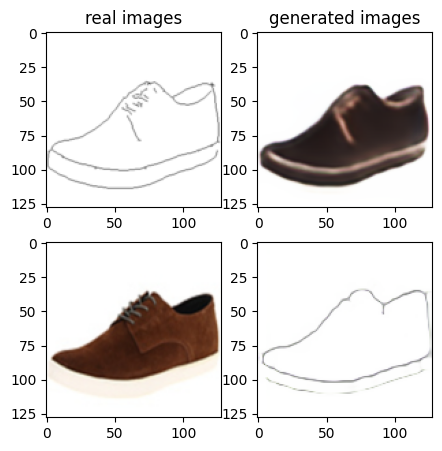

Train Epoch: 1 16% 	Total Loss: 1.441855 	Loss_G_AB: 0.319517	Loss_G_BA: 0.985719	Loss_cycle: 0.505804	Loss_D_A: 0.020364	Loss_D_B: 0.263070
0 8009 T:  1.6798064708709717
Train Epoch: 1 16% 	Total Loss: 1.610617 	Loss_G_AB: 0.334445	Loss_G_BA: 0.818027	Loss_cycle: 0.712478	Loss_D_A: 0.071712	Loss_D_B: 0.250191
0 8019 T:  0.6047120094299316
Train Epoch: 1 16% 	Total Loss: 1.380525 	Loss_G_AB: 0.291868	Loss_G_BA: 0.986637	Loss_cycle: 0.494276	Loss_D_A: 0.017440	Loss_D_B: 0.229557
0 8029 T:  0.5915038585662842
Train Epoch: 1 16% 	Total Loss: 1.452118 	Loss_G_AB: 0.340015	Loss_G_BA: 0.883533	Loss_cycle: 0.573357	Loss_D_A: 0.034233	Loss_D_B: 0.232754
0 8039 T:  0.5836482048034668
Train Epoch: 1 16% 	Total Loss: 1.491712 	Loss_G_AB: 0.400958	Loss_G_BA: 0.935163	Loss_cycle: 0.568514	Loss_D_A: 0.035001	Loss_D_B: 0.220136
0 8049 T:  0.5909085273742676
Train Epoch: 1 16% 	Total Loss: 1.714189 	Loss_G_AB: 0.419919	Loss_G_BA: 0.942543	Loss_cycle: 0.702304	Loss_D_A: 0.024982	Loss_D_B: 0.305672
0 80

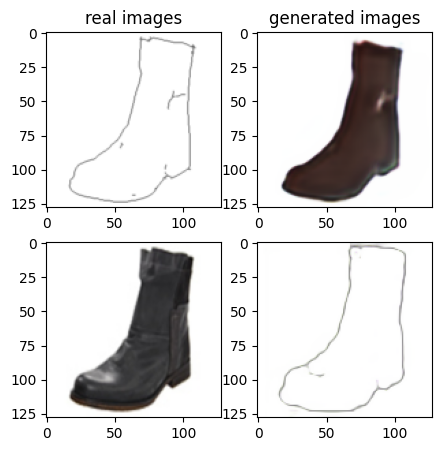

Train Epoch: 1 18% 	Total Loss: 1.412650 	Loss_G_AB: 0.276535	Loss_G_BA: 0.942726	Loss_cycle: 0.514105	Loss_D_A: 0.035708	Loss_D_B: 0.253206
0 9009 T:  1.5943622589111328
Train Epoch: 1 18% 	Total Loss: 1.402155 	Loss_G_AB: 0.309250	Loss_G_BA: 0.768763	Loss_cycle: 0.538732	Loss_D_A: 0.106520	Loss_D_B: 0.217897
0 9019 T:  0.5745902061462402
Train Epoch: 1 18% 	Total Loss: 1.641647 	Loss_G_AB: 0.272834	Loss_G_BA: 1.033388	Loss_cycle: 0.713740	Loss_D_A: 0.021938	Loss_D_B: 0.252858
0 9029 T:  0.5572769641876221
Train Epoch: 1 18% 	Total Loss: 1.445169 	Loss_G_AB: 0.272813	Loss_G_BA: 0.871669	Loss_cycle: 0.603750	Loss_D_A: 0.028168	Loss_D_B: 0.241011
0 9039 T:  0.582106351852417
Train Epoch: 1 18% 	Total Loss: 1.707269 	Loss_G_AB: 0.317272	Loss_G_BA: 1.033678	Loss_cycle: 0.772708	Loss_D_A: 0.021730	Loss_D_B: 0.237356
0 9049 T:  0.5785062313079834
Train Epoch: 1 18% 	Total Loss: 1.389357 	Loss_G_AB: 0.331319	Loss_G_BA: 0.844729	Loss_cycle: 0.550098	Loss_D_A: 0.032027	Loss_D_B: 0.219209
0 905

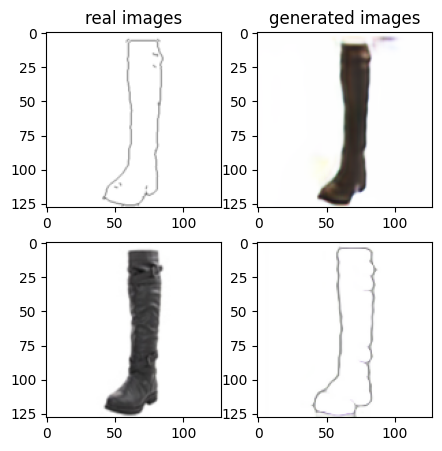

Train Epoch: 1 20% 	Total Loss: 1.352592 	Loss_G_AB: 0.292193	Loss_G_BA: 0.746780	Loss_cycle: 0.514568	Loss_D_A: 0.070653	Loss_D_B: 0.247885
0 10009 T:  1.4140567779541016
Train Epoch: 1 20% 	Total Loss: 1.479782 	Loss_G_AB: 0.291313	Loss_G_BA: 0.826264	Loss_cycle: 0.639828	Loss_D_A: 0.051533	Loss_D_B: 0.229633
0 10019 T:  0.5829148292541504
Train Epoch: 1 20% 	Total Loss: 1.343491 	Loss_G_AB: 0.335312	Loss_G_BA: 0.811732	Loss_cycle: 0.435095	Loss_D_A: 0.080493	Loss_D_B: 0.254381
0 10029 T:  0.5819191932678223
Train Epoch: 1 20% 	Total Loss: 1.281119 	Loss_G_AB: 0.285895	Loss_G_BA: 0.654865	Loss_cycle: 0.441228	Loss_D_A: 0.114802	Loss_D_B: 0.254709
0 10039 T:  0.5942299365997314
Train Epoch: 1 20% 	Total Loss: 1.646936 	Loss_G_AB: 0.298959	Loss_G_BA: 1.080518	Loss_cycle: 0.640802	Loss_D_A: 0.035282	Loss_D_B: 0.281114
0 10049 T:  0.5719482898712158
Train Epoch: 1 20% 	Total Loss: 1.457127 	Loss_G_AB: 0.320197	Loss_G_BA: 0.846953	Loss_cycle: 0.565320	Loss_D_A: 0.047270	Loss_D_B: 0.260962

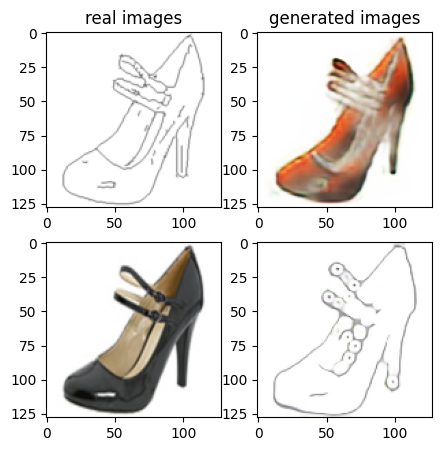

Train Epoch: 1 22% 	Total Loss: 1.456138 	Loss_G_AB: 0.256632	Loss_G_BA: 0.900318	Loss_cycle: 0.566022	Loss_D_A: 0.034788	Loss_D_B: 0.276854
0 11009 T:  1.4002397060394287
Train Epoch: 1 22% 	Total Loss: 1.565795 	Loss_G_AB: 0.298368	Loss_G_BA: 0.920570	Loss_cycle: 0.702521	Loss_D_A: 0.016263	Loss_D_B: 0.237542
0 11019 T:  0.5731308460235596
Train Epoch: 1 22% 	Total Loss: 1.559672 	Loss_G_AB: 0.290525	Loss_G_BA: 0.960597	Loss_cycle: 0.649418	Loss_D_A: 0.015919	Loss_D_B: 0.268774
0 11029 T:  0.5758819580078125
Train Epoch: 1 22% 	Total Loss: 1.582702 	Loss_G_AB: 0.298216	Loss_G_BA: 0.933591	Loss_cycle: 0.726480	Loss_D_A: 0.012973	Loss_D_B: 0.227346
0 11039 T:  0.5715956687927246
Train Epoch: 1 22% 	Total Loss: 1.370219 	Loss_G_AB: 0.305827	Loss_G_BA: 1.037220	Loss_cycle: 0.435940	Loss_D_A: 0.015669	Loss_D_B: 0.247087
0 11049 T:  0.5551292896270752
Train Epoch: 1 22% 	Total Loss: 1.523778 	Loss_G_AB: 0.356479	Loss_G_BA: 0.975894	Loss_cycle: 0.619022	Loss_D_A: 0.017275	Loss_D_B: 0.221295

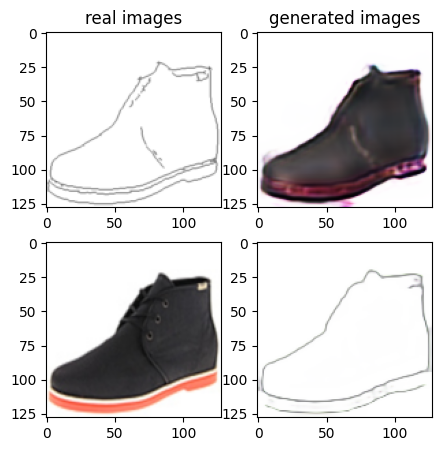

Train Epoch: 1 24% 	Total Loss: 1.496871 	Loss_G_AB: 0.315195	Loss_G_BA: 0.899779	Loss_cycle: 0.643064	Loss_D_A: 0.010646	Loss_D_B: 0.235674
0 12009 T:  1.3751037120819092
Train Epoch: 1 24% 	Total Loss: 1.378676 	Loss_G_AB: 0.295021	Loss_G_BA: 1.021282	Loss_cycle: 0.436600	Loss_D_A: 0.013280	Loss_D_B: 0.270644
0 12019 T:  0.5902583599090576
Train Epoch: 1 24% 	Total Loss: 1.520354 	Loss_G_AB: 0.272889	Loss_G_BA: 1.004356	Loss_cycle: 0.578954	Loss_D_A: 0.020918	Loss_D_B: 0.281860
0 12029 T:  0.5823402404785156
Train Epoch: 1 24% 	Total Loss: 1.534969 	Loss_G_AB: 0.285770	Loss_G_BA: 0.876864	Loss_cycle: 0.675577	Loss_D_A: 0.029196	Loss_D_B: 0.248880
0 12039 T:  0.5656599998474121
Train Epoch: 1 24% 	Total Loss: 1.487913 	Loss_G_AB: 0.327863	Loss_G_BA: 0.977297	Loss_cycle: 0.570741	Loss_D_A: 0.018994	Loss_D_B: 0.245598
0 12049 T:  0.604194164276123
Train Epoch: 1 24% 	Total Loss: 1.333238 	Loss_G_AB: 0.307285	Loss_G_BA: 1.016192	Loss_cycle: 0.378957	Loss_D_A: 0.018825	Loss_D_B: 0.273717


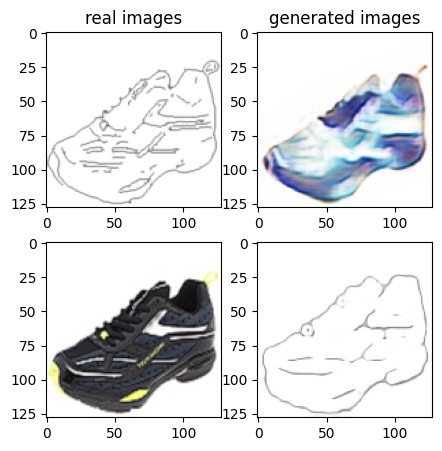

Train Epoch: 1 26% 	Total Loss: 1.624841 	Loss_G_AB: 0.289780	Loss_G_BA: 0.965104	Loss_cycle: 0.726065	Loss_D_A: 0.015838	Loss_D_B: 0.255496
0 13009 T:  1.3603451251983643
Train Epoch: 1 26% 	Total Loss: 1.520103 	Loss_G_AB: 0.268665	Loss_G_BA: 0.874715	Loss_cycle: 0.661796	Loss_D_A: 0.013191	Loss_D_B: 0.273427
0 13019 T:  0.5878686904907227
Train Epoch: 1 26% 	Total Loss: 1.567076 	Loss_G_AB: 0.283405	Loss_G_BA: 0.968132	Loss_cycle: 0.683271	Loss_D_A: 0.013676	Loss_D_B: 0.244361
0 13029 T:  0.5766923427581787
Train Epoch: 1 26% 	Total Loss: 1.496055 	Loss_G_AB: 0.273290	Loss_G_BA: 0.959595	Loss_cycle: 0.610968	Loss_D_A: 0.016887	Loss_D_B: 0.251757
0 13039 T:  0.5924947261810303
Train Epoch: 1 26% 	Total Loss: 1.482879 	Loss_G_AB: 0.275631	Loss_G_BA: 1.045722	Loss_cycle: 0.557262	Loss_D_A: 0.010296	Loss_D_B: 0.254645
0 13049 T:  0.6303634643554688
Train Epoch: 1 26% 	Total Loss: 1.587239 	Loss_G_AB: 0.302567	Loss_G_BA: 0.825245	Loss_cycle: 0.746011	Loss_D_A: 0.038036	Loss_D_B: 0.239285

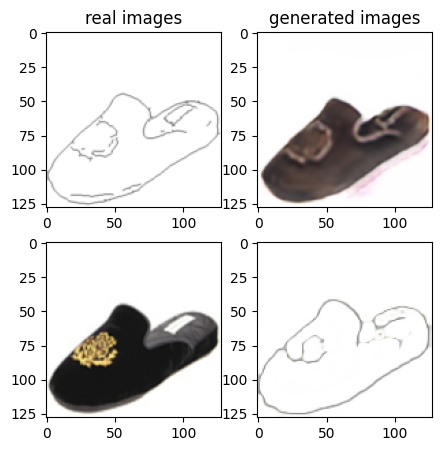

Train Epoch: 1 28% 	Total Loss: 1.465893 	Loss_G_AB: 0.281893	Loss_G_BA: 1.013632	Loss_cycle: 0.568485	Loss_D_A: 0.007143	Loss_D_B: 0.242502
0 14009 T:  1.3640897274017334
Train Epoch: 1 28% 	Total Loss: 1.561570 	Loss_G_AB: 0.283053	Loss_G_BA: 0.891077	Loss_cycle: 0.689720	Loss_D_A: 0.026121	Loss_D_B: 0.258664
0 14019 T:  0.6967194080352783
Train Epoch: 1 28% 	Total Loss: 1.571821 	Loss_G_AB: 0.290793	Loss_G_BA: 0.909153	Loss_cycle: 0.693728	Loss_D_A: 0.026528	Loss_D_B: 0.251591
0 14029 T:  0.8059895038604736
Train Epoch: 1 28% 	Total Loss: 1.559887 	Loss_G_AB: 0.272777	Loss_G_BA: 0.900862	Loss_cycle: 0.707281	Loss_D_A: 0.023146	Loss_D_B: 0.242641
0 14039 T:  0.7759575843811035
Train Epoch: 1 28% 	Total Loss: 1.465401 	Loss_G_AB: 0.296496	Loss_G_BA: 0.906901	Loss_cycle: 0.600859	Loss_D_A: 0.022983	Loss_D_B: 0.239860
0 14049 T:  0.8032436370849609
Train Epoch: 1 28% 	Total Loss: 1.506268 	Loss_G_AB: 0.304342	Loss_G_BA: 0.947682	Loss_cycle: 0.608190	Loss_D_A: 0.016992	Loss_D_B: 0.255073

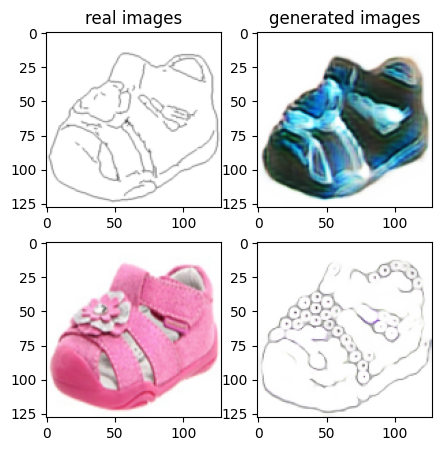

Train Epoch: 1 30% 	Total Loss: 1.542952 	Loss_G_AB: 0.269274	Loss_G_BA: 0.948438	Loss_cycle: 0.637648	Loss_D_A: 0.036995	Loss_D_B: 0.259452
0 15009 T:  1.8774385452270508
Train Epoch: 1 30% 	Total Loss: 1.580644 	Loss_G_AB: 0.283598	Loss_G_BA: 1.090275	Loss_cycle: 0.615487	Loss_D_A: 0.028771	Loss_D_B: 0.249451
0 15019 T:  0.8222379684448242
Train Epoch: 1 30% 	Total Loss: 1.642320 	Loss_G_AB: 0.318615	Loss_G_BA: 0.957900	Loss_cycle: 0.734366	Loss_D_A: 0.021473	Loss_D_B: 0.248224
0 15029 T:  0.7836146354675293
Train Epoch: 1 30% 	Total Loss: 1.485728 	Loss_G_AB: 0.269594	Loss_G_BA: 1.057958	Loss_cycle: 0.549183	Loss_D_A: 0.017569	Loss_D_B: 0.255200
0 15039 T:  0.7909259796142578
Train Epoch: 1 30% 	Total Loss: 1.660506 	Loss_G_AB: 0.321663	Loss_G_BA: 0.998555	Loss_cycle: 0.759990	Loss_D_A: 0.009764	Loss_D_B: 0.230643
0 15049 T:  0.8774745464324951
Train Epoch: 1 30% 	Total Loss: 1.354227 	Loss_G_AB: 0.290891	Loss_G_BA: 0.902774	Loss_cycle: 0.469863	Loss_D_A: 0.021038	Loss_D_B: 0.266494

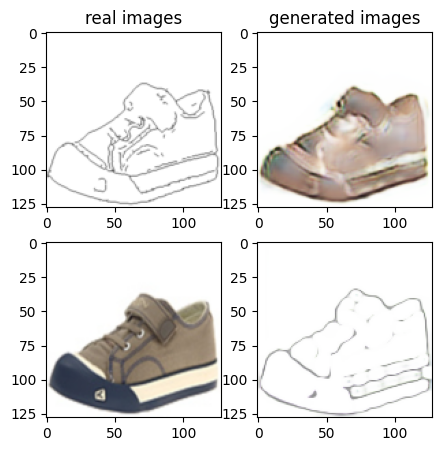

Train Epoch: 1 32% 	Total Loss: 1.482530 	Loss_G_AB: 0.249113	Loss_G_BA: 0.989859	Loss_cycle: 0.586675	Loss_D_A: 0.006515	Loss_D_B: 0.269854
0 16009 T:  2.6541333198547363
Train Epoch: 1 32% 	Total Loss: 1.610432 	Loss_G_AB: 0.275544	Loss_G_BA: 1.014680	Loss_cycle: 0.693161	Loss_D_A: 0.008144	Loss_D_B: 0.264014
0 16019 T:  1.0029306411743164
Train Epoch: 1 32% 	Total Loss: 1.495945 	Loss_G_AB: 0.278817	Loss_G_BA: 0.918622	Loss_cycle: 0.635190	Loss_D_A: 0.014730	Loss_D_B: 0.247305
0 16029 T:  0.9823453426361084
Train Epoch: 1 32% 	Total Loss: 1.531089 	Loss_G_AB: 0.281200	Loss_G_BA: 1.023027	Loss_cycle: 0.631193	Loss_D_A: 0.005503	Loss_D_B: 0.242279
0 16039 T:  0.852644681930542
Train Epoch: 1 32% 	Total Loss: 1.605417 	Loss_G_AB: 0.274589	Loss_G_BA: 0.994795	Loss_cycle: 0.706948	Loss_D_A: 0.005103	Loss_D_B: 0.258673
0 16049 T:  0.7525241374969482
Train Epoch: 1 32% 	Total Loss: 1.527114 	Loss_G_AB: 0.247902	Loss_G_BA: 1.005228	Loss_cycle: 0.631416	Loss_D_A: 0.006239	Loss_D_B: 0.262893


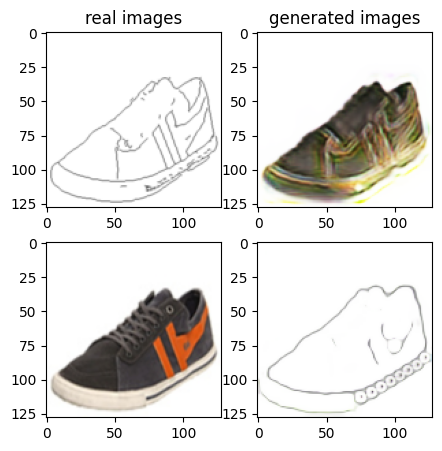

Train Epoch: 1 34% 	Total Loss: 1.503024 	Loss_G_AB: 0.263105	Loss_G_BA: 1.022508	Loss_cycle: 0.602232	Loss_D_A: 0.005733	Loss_D_B: 0.252253
0 17009 T:  1.9098517894744873
Train Epoch: 1 34% 	Total Loss: 1.373151 	Loss_G_AB: 0.279652	Loss_G_BA: 0.982285	Loss_cycle: 0.488766	Loss_D_A: 0.009491	Loss_D_B: 0.243925
0 17019 T:  0.7612247467041016
Train Epoch: 1 34% 	Total Loss: 1.415969 	Loss_G_AB: 0.322189	Loss_G_BA: 1.021518	Loss_cycle: 0.477547	Loss_D_A: 0.006586	Loss_D_B: 0.259983
0 17029 T:  0.779094934463501
Train Epoch: 1 34% 	Total Loss: 1.386715 	Loss_G_AB: 0.254527	Loss_G_BA: 0.990132	Loss_cycle: 0.491551	Loss_D_A: 0.005359	Loss_D_B: 0.267475
0 17039 T:  0.6943955421447754
Train Epoch: 1 34% 	Total Loss: 1.323679 	Loss_G_AB: 0.276620	Loss_G_BA: 0.956441	Loss_cycle: 0.445024	Loss_D_A: 0.019037	Loss_D_B: 0.243089
0 17049 T:  0.5743458271026611
Train Epoch: 1 34% 	Total Loss: 1.291340 	Loss_G_AB: 0.273051	Loss_G_BA: 0.996847	Loss_cycle: 0.400002	Loss_D_A: 0.008007	Loss_D_B: 0.248382


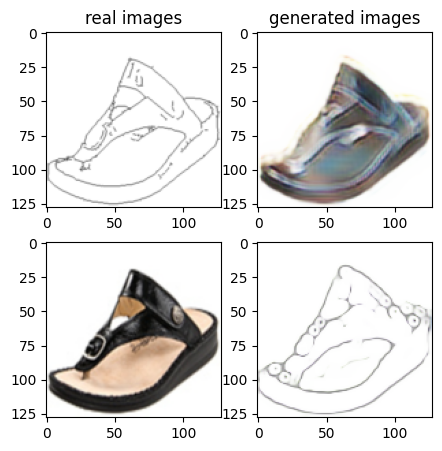

Train Epoch: 1 36% 	Total Loss: 1.463494 	Loss_G_AB: 0.298273	Loss_G_BA: 0.810252	Loss_cycle: 0.626971	Loss_D_A: 0.042818	Loss_D_B: 0.239442
0 18009 T:  1.87644362449646
Train Epoch: 1 36% 	Total Loss: 1.435456 	Loss_G_AB: 0.281059	Loss_G_BA: 0.940272	Loss_cycle: 0.541243	Loss_D_A: 0.028581	Loss_D_B: 0.254967
0 18019 T:  0.5734169483184814
Train Epoch: 1 36% 	Total Loss: 1.470975 	Loss_G_AB: 0.312146	Loss_G_BA: 0.827238	Loss_cycle: 0.607557	Loss_D_A: 0.060411	Loss_D_B: 0.233315
0 18029 T:  0.5873367786407471
Train Epoch: 1 36% 	Total Loss: 1.336817 	Loss_G_AB: 0.285289	Loss_G_BA: 0.951294	Loss_cycle: 0.428275	Loss_D_A: 0.027777	Loss_D_B: 0.262474
0 18039 T:  0.5704922676086426
Train Epoch: 1 36% 	Total Loss: 1.425835 	Loss_G_AB: 0.285096	Loss_G_BA: 0.993914	Loss_cycle: 0.530873	Loss_D_A: 0.009354	Loss_D_B: 0.246103
0 18049 T:  0.5978186130523682
Train Epoch: 1 36% 	Total Loss: 1.507184 	Loss_G_AB: 0.288216	Loss_G_BA: 1.009422	Loss_cycle: 0.604377	Loss_D_A: 0.009368	Loss_D_B: 0.244620
0

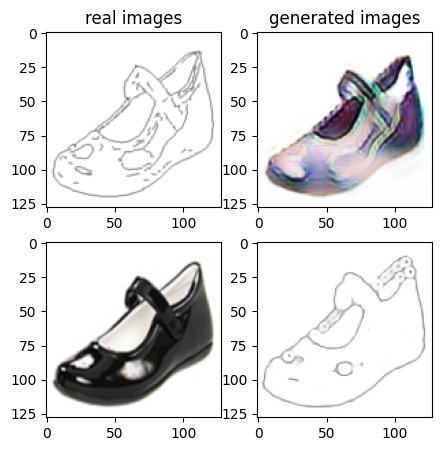

Train Epoch: 1 38% 	Total Loss: 1.367206 	Loss_G_AB: 0.290958	Loss_G_BA: 0.891365	Loss_cycle: 0.507677	Loss_D_A: 0.032587	Loss_D_B: 0.235780
0 19009 T:  1.446014165878296
Train Epoch: 1 38% 	Total Loss: 1.208586 	Loss_G_AB: 0.266245	Loss_G_BA: 0.883482	Loss_cycle: 0.352647	Loss_D_A: 0.031562	Loss_D_B: 0.249514
0 19019 T:  0.5910863876342773
Train Epoch: 1 38% 	Total Loss: 1.487487 	Loss_G_AB: 0.280936	Loss_G_BA: 1.021251	Loss_cycle: 0.560579	Loss_D_A: 0.029795	Loss_D_B: 0.246019
0 19029 T:  0.5728399753570557
Train Epoch: 1 38% 	Total Loss: 1.669563 	Loss_G_AB: 0.281138	Loss_G_BA: 1.028032	Loss_cycle: 0.766617	Loss_D_A: 0.014420	Loss_D_B: 0.233941
0 19039 T:  0.588383674621582
Train Epoch: 1 38% 	Total Loss: 1.366873 	Loss_G_AB: 0.304468	Loss_G_BA: 0.958416	Loss_cycle: 0.479368	Loss_D_A: 0.009303	Loss_D_B: 0.246759
0 19049 T:  0.5821549892425537
Train Epoch: 1 38% 	Total Loss: 1.535136 	Loss_G_AB: 0.288808	Loss_G_BA: 1.015577	Loss_cycle: 0.568027	Loss_D_A: 0.050631	Loss_D_B: 0.264286
0

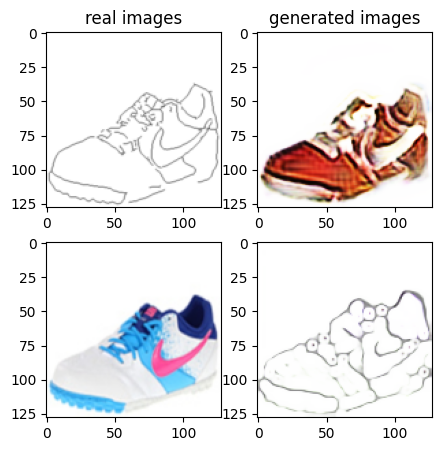

Train Epoch: 1 40% 	Total Loss: 1.481233 	Loss_G_AB: 0.319257	Loss_G_BA: 1.015692	Loss_cycle: 0.578573	Loss_D_A: 0.004502	Loss_D_B: 0.230682
0 20009 T:  1.9765753746032715
Train Epoch: 1 40% 	Total Loss: 1.351321 	Loss_G_AB: 0.272496	Loss_G_BA: 1.000793	Loss_cycle: 0.434076	Loss_D_A: 0.004959	Loss_D_B: 0.275642
0 20019 T:  0.8100333213806152
Train Epoch: 1 40% 	Total Loss: 1.374963 	Loss_G_AB: 0.250232	Loss_G_BA: 0.978549	Loss_cycle: 0.501219	Loss_D_A: 0.005157	Loss_D_B: 0.254197
0 20029 T:  0.7862255573272705
Train Epoch: 1 40% 	Total Loss: 1.561781 	Loss_G_AB: 0.250606	Loss_G_BA: 0.994653	Loss_cycle: 0.662473	Loss_D_A: 0.004955	Loss_D_B: 0.271723
0 20039 T:  0.7936303615570068
Train Epoch: 1 40% 	Total Loss: 1.445357 	Loss_G_AB: 0.268197	Loss_G_BA: 1.035318	Loss_cycle: 0.531720	Loss_D_A: 0.006308	Loss_D_B: 0.255571
0 20049 T:  0.6771082878112793
Train Epoch: 1 40% 	Total Loss: 1.385380 	Loss_G_AB: 0.286204	Loss_G_BA: 1.007566	Loss_cycle: 0.473238	Loss_D_A: 0.010972	Loss_D_B: 0.254285

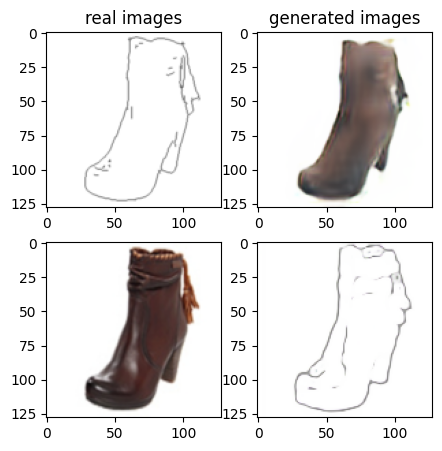

Train Epoch: 1 42% 	Total Loss: 1.510479 	Loss_G_AB: 0.290687	Loss_G_BA: 1.010956	Loss_cycle: 0.612703	Loss_D_A: 0.004645	Loss_D_B: 0.242309
0 21009 T:  1.3895456790924072
Train Epoch: 1 42% 	Total Loss: 1.411543 	Loss_G_AB: 0.278657	Loss_G_BA: 0.971763	Loss_cycle: 0.538889	Loss_D_A: 0.005175	Loss_D_B: 0.242269
0 21019 T:  0.5929341316223145
Train Epoch: 1 42% 	Total Loss: 1.479220 	Loss_G_AB: 0.288303	Loss_G_BA: 1.009666	Loss_cycle: 0.563825	Loss_D_A: 0.008719	Loss_D_B: 0.257692
0 21029 T:  0.6620824337005615
Train Epoch: 1 42% 	Total Loss: 1.387194 	Loss_G_AB: 0.285094	Loss_G_BA: 0.912189	Loss_cycle: 0.531635	Loss_D_A: 0.010185	Loss_D_B: 0.246733
0 21039 T:  0.5877318382263184
Train Epoch: 1 42% 	Total Loss: 1.503059 	Loss_G_AB: 0.277256	Loss_G_BA: 1.072195	Loss_cycle: 0.568997	Loss_D_A: 0.008452	Loss_D_B: 0.250884
0 21049 T:  0.5963804721832275
Train Epoch: 1 42% 	Total Loss: 1.393503 	Loss_G_AB: 0.292949	Loss_G_BA: 1.002734	Loss_cycle: 0.497078	Loss_D_A: 0.006055	Loss_D_B: 0.242529

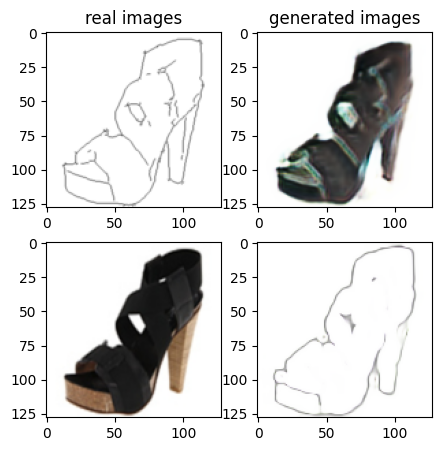

Train Epoch: 1 44% 	Total Loss: 1.422402 	Loss_G_AB: 0.272562	Loss_G_BA: 0.983744	Loss_cycle: 0.535635	Loss_D_A: 0.003780	Loss_D_B: 0.254834
0 22009 T:  1.3832323551177979
Train Epoch: 1 44% 	Total Loss: 1.381835 	Loss_G_AB: 0.280470	Loss_G_BA: 0.991900	Loss_cycle: 0.502134	Loss_D_A: 0.006074	Loss_D_B: 0.237443
0 22019 T:  0.5605192184448242
Train Epoch: 1 44% 	Total Loss: 1.498822 	Loss_G_AB: 0.303802	Loss_G_BA: 0.990421	Loss_cycle: 0.612353	Loss_D_A: 0.003129	Loss_D_B: 0.236228
0 22029 T:  0.5694622993469238
Train Epoch: 1 44% 	Total Loss: 1.307511 	Loss_G_AB: 0.265149	Loss_G_BA: 1.014150	Loss_cycle: 0.390679	Loss_D_A: 0.005658	Loss_D_B: 0.271525
0 22039 T:  0.5795156955718994
Train Epoch: 1 44% 	Total Loss: 1.292770 	Loss_G_AB: 0.271221	Loss_G_BA: 0.989655	Loss_cycle: 0.389344	Loss_D_A: 0.004171	Loss_D_B: 0.268816
0 22049 T:  0.5840702056884766
Train Epoch: 1 44% 	Total Loss: 1.487923 	Loss_G_AB: 0.288877	Loss_G_BA: 0.985546	Loss_cycle: 0.582681	Loss_D_A: 0.003258	Loss_D_B: 0.264773

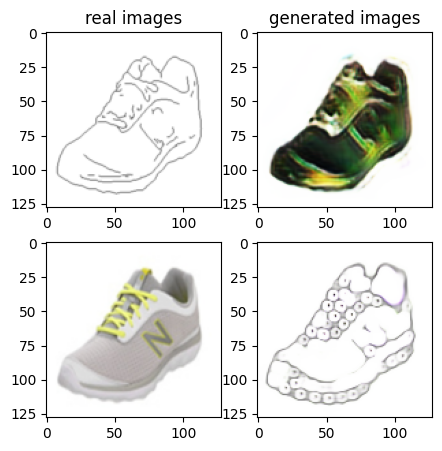

Train Epoch: 1 46% 	Total Loss: 1.279216 	Loss_G_AB: 0.301990	Loss_G_BA: 0.882345	Loss_cycle: 0.420305	Loss_D_A: 0.030403	Loss_D_B: 0.236340
0 23009 T:  1.4307477474212646
Train Epoch: 1 46% 	Total Loss: 1.351169 	Loss_G_AB: 0.302057	Loss_G_BA: 0.996137	Loss_cycle: 0.452451	Loss_D_A: 0.011069	Loss_D_B: 0.238552
0 23019 T:  0.6026430130004883
Train Epoch: 1 46% 	Total Loss: 1.454987 	Loss_G_AB: 0.265512	Loss_G_BA: 1.027086	Loss_cycle: 0.536072	Loss_D_A: 0.008296	Loss_D_B: 0.264319
0 23029 T:  0.5807609558105469
Train Epoch: 1 46% 	Total Loss: 1.424942 	Loss_G_AB: 0.276372	Loss_G_BA: 1.031884	Loss_cycle: 0.515679	Loss_D_A: 0.004658	Loss_D_B: 0.250476
0 23039 T:  0.5798141956329346
Train Epoch: 1 46% 	Total Loss: 1.475519 	Loss_G_AB: 0.306318	Loss_G_BA: 0.993596	Loss_cycle: 0.580893	Loss_D_A: 0.005684	Loss_D_B: 0.238986
0 23049 T:  0.7939519882202148
Train Epoch: 1 46% 	Total Loss: 1.503968 	Loss_G_AB: 0.312932	Loss_G_BA: 1.013798	Loss_cycle: 0.611676	Loss_D_A: 0.003497	Loss_D_B: 0.225430

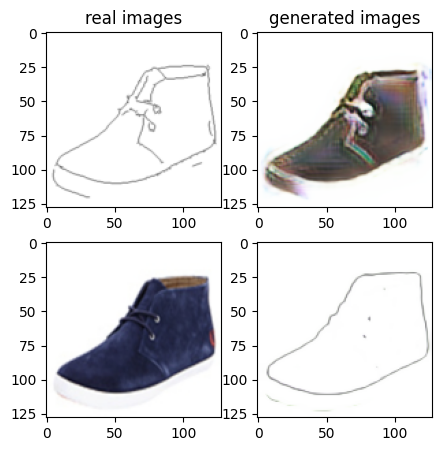

Train Epoch: 1 48% 	Total Loss: 1.339096 	Loss_G_AB: 0.290344	Loss_G_BA: 0.928519	Loss_cycle: 0.484385	Loss_D_A: 0.021526	Loss_D_B: 0.223753
0 24009 T:  1.5559272766113281
Train Epoch: 1 48% 	Total Loss: 1.501366 	Loss_G_AB: 0.307648	Loss_G_BA: 0.831750	Loss_cycle: 0.598743	Loss_D_A: 0.083835	Loss_D_B: 0.249088
0 24019 T:  0.8785254955291748
Train Epoch: 1 48% 	Total Loss: 1.414542 	Loss_G_AB: 0.296721	Loss_G_BA: 1.012987	Loss_cycle: 0.503840	Loss_D_A: 0.010409	Loss_D_B: 0.245438
0 24029 T:  0.7869622707366943
Train Epoch: 1 48% 	Total Loss: 1.430662 	Loss_G_AB: 0.302749	Loss_G_BA: 0.987861	Loss_cycle: 0.521230	Loss_D_A: 0.010509	Loss_D_B: 0.253619
0 24039 T:  0.8316171169281006
Train Epoch: 1 48% 	Total Loss: 1.290988 	Loss_G_AB: 0.279293	Loss_G_BA: 0.839539	Loss_cycle: 0.473199	Loss_D_A: 0.024626	Loss_D_B: 0.233747
0 24049 T:  0.8088397979736328
Train Epoch: 1 48% 	Total Loss: 1.460040 	Loss_G_AB: 0.294837	Loss_G_BA: 1.051966	Loss_cycle: 0.482251	Loss_D_A: 0.026613	Loss_D_B: 0.277775

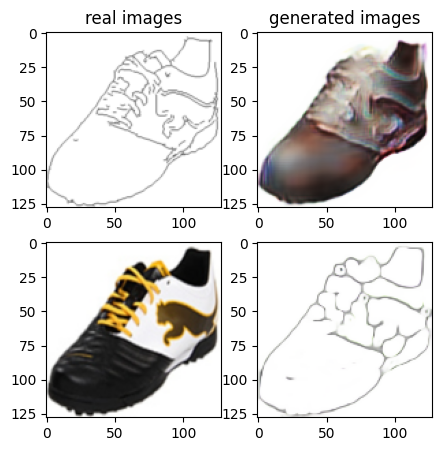

Train Epoch: 1 50% 	Total Loss: 1.458434 	Loss_G_AB: 0.286216	Loss_G_BA: 0.984976	Loss_cycle: 0.560738	Loss_D_A: 0.004269	Loss_D_B: 0.257831
0 25009 T:  1.9163742065429688
Train Epoch: 1 50% 	Total Loss: 1.428926 	Loss_G_AB: 0.301069	Loss_G_BA: 1.004369	Loss_cycle: 0.510387	Loss_D_A: 0.002795	Loss_D_B: 0.263025
0 25019 T:  0.7940857410430908
Train Epoch: 1 50% 	Total Loss: 1.319367 	Loss_G_AB: 0.274279	Loss_G_BA: 0.993221	Loss_cycle: 0.425942	Loss_D_A: 0.007760	Loss_D_B: 0.251915
0 25029 T:  0.7916817665100098
Train Epoch: 1 50% 	Total Loss: 1.417050 	Loss_G_AB: 0.347469	Loss_G_BA: 0.991735	Loss_cycle: 0.526897	Loss_D_A: 0.004320	Loss_D_B: 0.216230
0 25039 T:  0.7976062297821045
Train Epoch: 1 50% 	Total Loss: 1.409088 	Loss_G_AB: 0.301397	Loss_G_BA: 0.998816	Loss_cycle: 0.509183	Loss_D_A: 0.003993	Loss_D_B: 0.245806
0 25049 T:  0.5771386623382568
Train Epoch: 1 50% 	Total Loss: 1.495229 	Loss_G_AB: 0.297577	Loss_G_BA: 1.006443	Loss_cycle: 0.605504	Loss_D_A: 0.004439	Loss_D_B: 0.233276

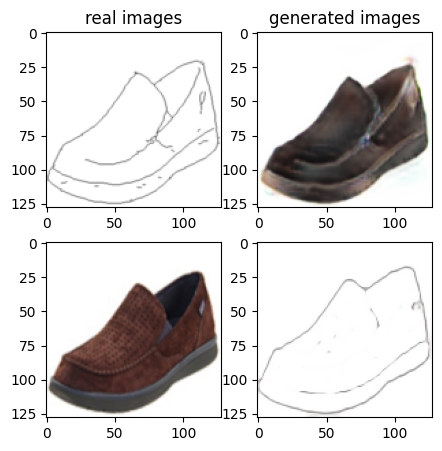

Train Epoch: 1 52% 	Total Loss: 1.455914 	Loss_G_AB: 0.284920	Loss_G_BA: 1.044289	Loss_cycle: 0.517145	Loss_D_A: 0.012432	Loss_D_B: 0.261733
0 26009 T:  1.995697021484375
Train Epoch: 1 52% 	Total Loss: 1.320110 	Loss_G_AB: 0.315494	Loss_G_BA: 0.982218	Loss_cycle: 0.448615	Loss_D_A: 0.007241	Loss_D_B: 0.215398
0 26019 T:  0.733677864074707
Train Epoch: 1 52% 	Total Loss: 1.507707 	Loss_G_AB: 0.361596	Loss_G_BA: 0.900537	Loss_cycle: 0.625031	Loss_D_A: 0.073241	Loss_D_B: 0.178369
0 26029 T:  0.5768523216247559
Train Epoch: 1 52% 	Total Loss: 1.463239 	Loss_G_AB: 0.325773	Loss_G_BA: 0.858191	Loss_cycle: 0.525348	Loss_D_A: 0.049470	Loss_D_B: 0.296439
0 26039 T:  0.5768218040466309
Train Epoch: 1 52% 	Total Loss: 1.277820 	Loss_G_AB: 0.271820	Loss_G_BA: 0.892067	Loss_cycle: 0.431263	Loss_D_A: 0.024893	Loss_D_B: 0.239720
0 26049 T:  0.5823771953582764
Train Epoch: 1 52% 	Total Loss: 1.365240 	Loss_G_AB: 0.282832	Loss_G_BA: 0.913693	Loss_cycle: 0.493196	Loss_D_A: 0.021940	Loss_D_B: 0.251841
0

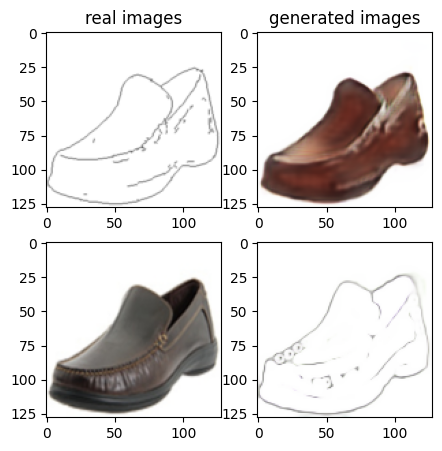

Train Epoch: 1 54% 	Total Loss: 1.391295 	Loss_G_AB: 0.322336	Loss_G_BA: 0.992925	Loss_cycle: 0.484972	Loss_D_A: 0.002421	Loss_D_B: 0.246271
0 27009 T:  1.5252509117126465
Train Epoch: 1 54% 	Total Loss: 1.321721 	Loss_G_AB: 0.278185	Loss_G_BA: 1.004450	Loss_cycle: 0.436665	Loss_D_A: 0.003522	Loss_D_B: 0.240218
0 27019 T:  0.6450862884521484
Train Epoch: 1 54% 	Total Loss: 1.474952 	Loss_G_AB: 0.288941	Loss_G_BA: 0.999795	Loss_cycle: 0.573512	Loss_D_A: 0.003938	Loss_D_B: 0.253133
0 27029 T:  0.58774733543396
Train Epoch: 1 54% 	Total Loss: 1.366155 	Loss_G_AB: 0.268691	Loss_G_BA: 0.997759	Loss_cycle: 0.455762	Loss_D_A: 0.005879	Loss_D_B: 0.271289
0 27039 T:  0.5951902866363525
Train Epoch: 1 54% 	Total Loss: 1.325970 	Loss_G_AB: 0.255746	Loss_G_BA: 0.993742	Loss_cycle: 0.430756	Loss_D_A: 0.004150	Loss_D_B: 0.266320
0 27049 T:  0.5766074657440186
Train Epoch: 1 54% 	Total Loss: 1.383634 	Loss_G_AB: 0.270999	Loss_G_BA: 0.997032	Loss_cycle: 0.498993	Loss_D_A: 0.003804	Loss_D_B: 0.246820
0

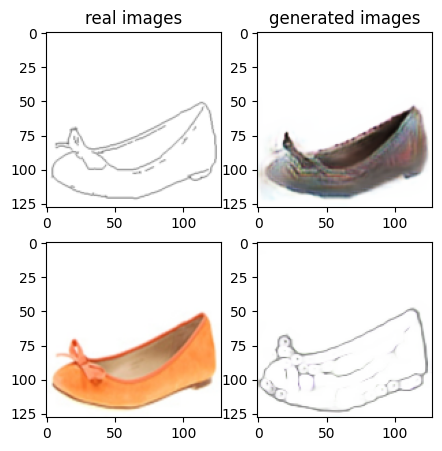

Train Epoch: 1 56% 	Total Loss: 1.438927 	Loss_G_AB: 0.273610	Loss_G_BA: 1.007599	Loss_cycle: 0.520158	Loss_D_A: 0.008651	Loss_D_B: 0.269514
0 28009 T:  1.434666395187378
Train Epoch: 1 56% 	Total Loss: 1.527398 	Loss_G_AB: 0.280875	Loss_G_BA: 1.001412	Loss_cycle: 0.620992	Loss_D_A: 0.003997	Loss_D_B: 0.261266
0 28019 T:  0.6164050102233887
Train Epoch: 1 56% 	Total Loss: 1.355063 	Loss_G_AB: 0.295216	Loss_G_BA: 0.990715	Loss_cycle: 0.450447	Loss_D_A: 0.004334	Loss_D_B: 0.257317
0 28029 T:  0.6223466396331787
Train Epoch: 1 56% 	Total Loss: 1.454750 	Loss_G_AB: 0.291029	Loss_G_BA: 1.013339	Loss_cycle: 0.543995	Loss_D_A: 0.004958	Loss_D_B: 0.253613
0 28039 T:  0.5770034790039062
Train Epoch: 1 56% 	Total Loss: 1.343585 	Loss_G_AB: 0.297903	Loss_G_BA: 0.975583	Loss_cycle: 0.478008	Loss_D_A: 0.005744	Loss_D_B: 0.223090
0 28049 T:  0.5827481746673584
Train Epoch: 1 56% 	Total Loss: 1.280843 	Loss_G_AB: 0.291388	Loss_G_BA: 0.995895	Loss_cycle: 0.392059	Loss_D_A: 0.004243	Loss_D_B: 0.240901


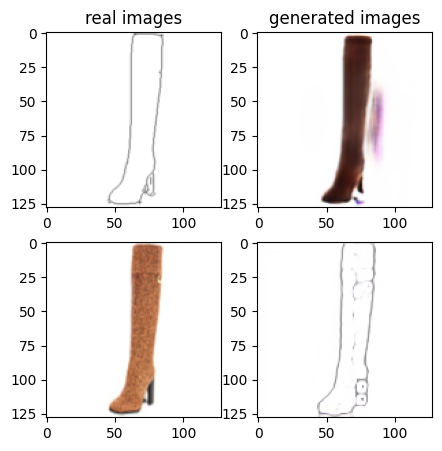

Train Epoch: 1 58% 	Total Loss: 1.352671 	Loss_G_AB: 0.275709	Loss_G_BA: 0.954338	Loss_cycle: 0.478566	Loss_D_A: 0.017050	Loss_D_B: 0.242032
0 29009 T:  1.4068951606750488
Train Epoch: 1 58% 	Total Loss: 1.351389 	Loss_G_AB: 0.288895	Loss_G_BA: 1.012316	Loss_cycle: 0.449266	Loss_D_A: 0.006606	Loss_D_B: 0.244912
0 29019 T:  0.5748956203460693
Train Epoch: 1 58% 	Total Loss: 1.400083 	Loss_G_AB: 0.289749	Loss_G_BA: 1.006137	Loss_cycle: 0.501201	Loss_D_A: 0.005426	Loss_D_B: 0.245514
0 29029 T:  0.5905349254608154
Train Epoch: 1 58% 	Total Loss: 1.370982 	Loss_G_AB: 0.289447	Loss_G_BA: 0.971581	Loss_cycle: 0.491267	Loss_D_A: 0.004934	Loss_D_B: 0.244267
0 29039 T:  0.5623729228973389
Train Epoch: 1 58% 	Total Loss: 1.466696 	Loss_G_AB: 0.321123	Loss_G_BA: 1.013915	Loss_cycle: 0.529671	Loss_D_A: 0.005084	Loss_D_B: 0.264421
0 29049 T:  0.576911211013794
Train Epoch: 1 58% 	Total Loss: 1.409647 	Loss_G_AB: 0.300649	Loss_G_BA: 1.002728	Loss_cycle: 0.506357	Loss_D_A: 0.004782	Loss_D_B: 0.246819


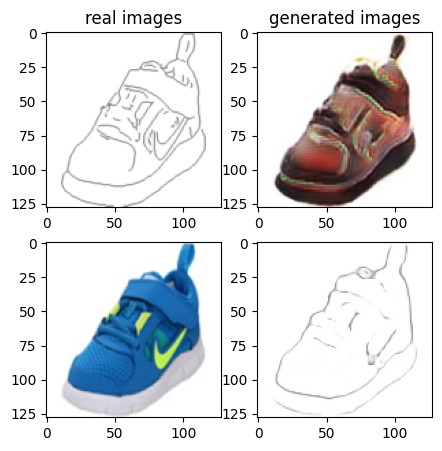

Train Epoch: 1 60% 	Total Loss: 1.474495 	Loss_G_AB: 0.318589	Loss_G_BA: 0.963410	Loss_cycle: 0.597276	Loss_D_A: 0.004760	Loss_D_B: 0.231459
0 30009 T:  1.3996403217315674
Train Epoch: 1 60% 	Total Loss: 1.389841 	Loss_G_AB: 0.328044	Loss_G_BA: 1.008621	Loss_cycle: 0.459916	Loss_D_A: 0.003053	Loss_D_B: 0.258540
0 30019 T:  0.5922152996063232
Train Epoch: 1 60% 	Total Loss: 1.370456 	Loss_G_AB: 0.291350	Loss_G_BA: 0.973742	Loss_cycle: 0.498278	Loss_D_A: 0.003569	Loss_D_B: 0.236063
0 30029 T:  0.6094772815704346
Train Epoch: 1 60% 	Total Loss: 1.350952 	Loss_G_AB: 0.300830	Loss_G_BA: 1.025289	Loss_cycle: 0.432381	Loss_D_A: 0.003404	Loss_D_B: 0.252108
0 30039 T:  0.5969057083129883
Train Epoch: 1 60% 	Total Loss: 1.322675 	Loss_G_AB: 0.260753	Loss_G_BA: 1.001985	Loss_cycle: 0.436312	Loss_D_A: 0.002717	Loss_D_B: 0.252277
0 30049 T:  0.5773882865905762
Train Epoch: 1 60% 	Total Loss: 1.349282 	Loss_G_AB: 0.273769	Loss_G_BA: 0.974239	Loss_cycle: 0.457344	Loss_D_A: 0.002967	Loss_D_B: 0.264967

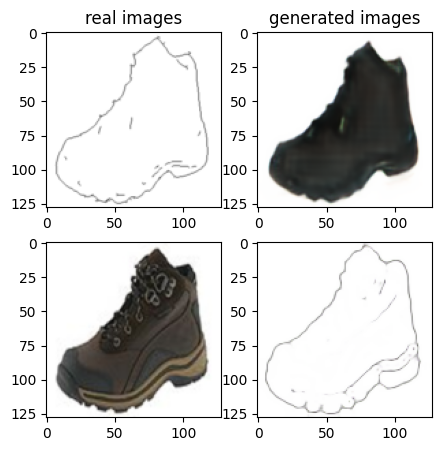

Train Epoch: 1 62% 	Total Loss: 1.440050 	Loss_G_AB: 0.311364	Loss_G_BA: 1.011876	Loss_cycle: 0.508583	Loss_D_A: 0.028767	Loss_D_B: 0.241080
0 31009 T:  1.6282098293304443
Train Epoch: 1 62% 	Total Loss: 1.409208 	Loss_G_AB: 0.275192	Loss_G_BA: 1.026135	Loss_cycle: 0.496925	Loss_D_A: 0.011298	Loss_D_B: 0.250323
0 31019 T:  0.5785894393920898
Train Epoch: 1 62% 	Total Loss: 1.368038 	Loss_G_AB: 0.270076	Loss_G_BA: 1.000691	Loss_cycle: 0.456922	Loss_D_A: 0.007282	Loss_D_B: 0.268451
0 31029 T:  0.5975892543792725
Train Epoch: 1 62% 	Total Loss: 1.404029 	Loss_G_AB: 0.278822	Loss_G_BA: 1.016747	Loss_cycle: 0.485703	Loss_D_A: 0.008065	Loss_D_B: 0.262476
0 31039 T:  0.5805063247680664
Train Epoch: 1 62% 	Total Loss: 1.402070 	Loss_G_AB: 0.295058	Loss_G_BA: 0.952130	Loss_cycle: 0.529640	Loss_D_A: 0.010433	Loss_D_B: 0.238402
0 31049 T:  0.5981502532958984
Train Epoch: 1 62% 	Total Loss: 1.368395 	Loss_G_AB: 0.331034	Loss_G_BA: 0.824407	Loss_cycle: 0.460602	Loss_D_A: 0.096253	Loss_D_B: 0.233819

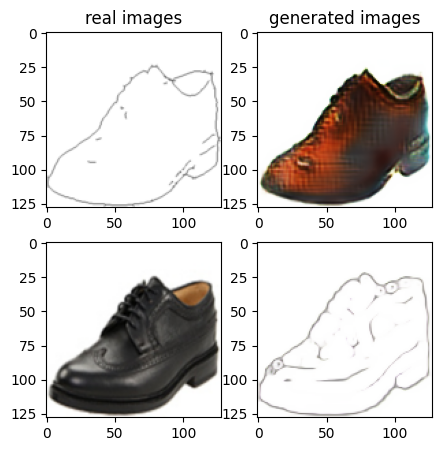

Train Epoch: 1 64% 	Total Loss: 1.498405 	Loss_G_AB: 0.278063	Loss_G_BA: 1.007052	Loss_cycle: 0.592222	Loss_D_A: 0.001914	Loss_D_B: 0.261711
0 32009 T:  1.3829500675201416
Train Epoch: 1 64% 	Total Loss: 1.413783 	Loss_G_AB: 0.270081	Loss_G_BA: 0.990806	Loss_cycle: 0.516214	Loss_D_A: 0.002619	Loss_D_B: 0.264507
0 32019 T:  0.6420211791992188
Train Epoch: 1 64% 	Total Loss: 1.439334 	Loss_G_AB: 0.313081	Loss_G_BA: 1.001442	Loss_cycle: 0.536792	Loss_D_A: 0.002366	Loss_D_B: 0.242914
0 32029 T:  0.6118545532226562
Train Epoch: 1 64% 	Total Loss: 1.248913 	Loss_G_AB: 0.272633	Loss_G_BA: 0.984679	Loss_cycle: 0.368092	Loss_D_A: 0.001622	Loss_D_B: 0.250543
0 32039 T:  0.5970394611358643
Train Epoch: 1 64% 	Total Loss: 1.344433 	Loss_G_AB: 0.286951	Loss_G_BA: 1.005764	Loss_cycle: 0.439840	Loss_D_A: 0.002474	Loss_D_B: 0.255762
0 32049 T:  0.5770854949951172
Train Epoch: 1 64% 	Total Loss: 1.347429 	Loss_G_AB: 0.277998	Loss_G_BA: 0.998491	Loss_cycle: 0.457993	Loss_D_A: 0.001825	Loss_D_B: 0.249366

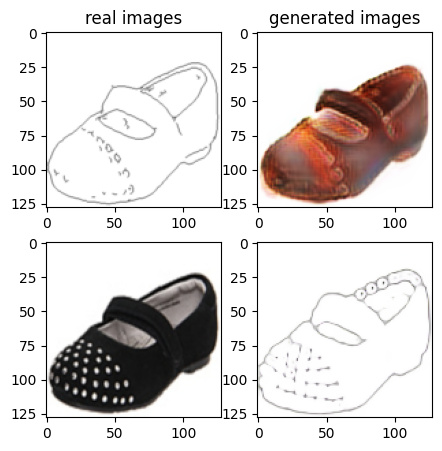

Train Epoch: 1 66% 	Total Loss: 1.521087 	Loss_G_AB: 0.267118	Loss_G_BA: 0.982512	Loss_cycle: 0.596927	Loss_D_A: 0.006193	Loss_D_B: 0.293152
0 33009 T:  1.622770071029663
Train Epoch: 1 66% 	Total Loss: 1.437872 	Loss_G_AB: 0.281048	Loss_G_BA: 1.013138	Loss_cycle: 0.525657	Loss_D_A: 0.004953	Loss_D_B: 0.260169
0 33019 T:  0.794353723526001
Train Epoch: 1 66% 	Total Loss: 1.430307 	Loss_G_AB: 0.313568	Loss_G_BA: 1.026816	Loss_cycle: 0.506989	Loss_D_A: 0.003445	Loss_D_B: 0.249681
0 33029 T:  0.7586333751678467
Train Epoch: 1 66% 	Total Loss: 1.374415 	Loss_G_AB: 0.288554	Loss_G_BA: 0.995620	Loss_cycle: 0.490275	Loss_D_A: 0.002412	Loss_D_B: 0.239640
0 33039 T:  0.7742540836334229
Train Epoch: 1 66% 	Total Loss: 1.471958 	Loss_G_AB: 0.310403	Loss_G_BA: 0.987464	Loss_cycle: 0.590803	Loss_D_A: 0.002975	Loss_D_B: 0.229248
0 33049 T:  0.7874391078948975
Train Epoch: 1 66% 	Total Loss: 1.346938 	Loss_G_AB: 0.319626	Loss_G_BA: 0.981713	Loss_cycle: 0.456618	Loss_D_A: 0.003001	Loss_D_B: 0.236649
0

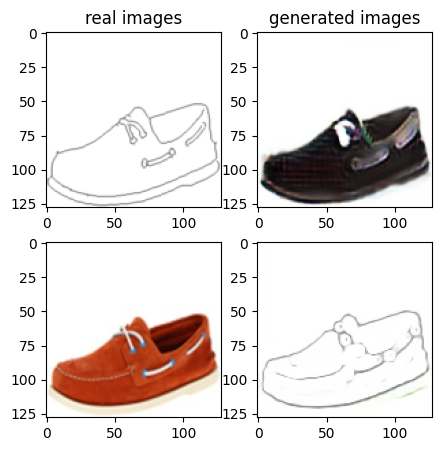

Train Epoch: 1 68% 	Total Loss: 1.462977 	Loss_G_AB: 0.292038	Loss_G_BA: 0.994662	Loss_cycle: 0.591587	Loss_D_A: 0.003815	Loss_D_B: 0.224226
0 34009 T:  1.9550628662109375
Train Epoch: 1 68% 	Total Loss: 1.352437 	Loss_G_AB: 0.284822	Loss_G_BA: 0.995146	Loss_cycle: 0.439889	Loss_D_A: 0.002559	Loss_D_B: 0.270004
0 34019 T:  0.8492605686187744
Train Epoch: 1 68% 	Total Loss: 1.398809 	Loss_G_AB: 0.294802	Loss_G_BA: 1.001650	Loss_cycle: 0.512165	Loss_D_A: 0.003730	Loss_D_B: 0.234688
0 34029 T:  0.8302164077758789
Train Epoch: 1 68% 	Total Loss: 1.344786 	Loss_G_AB: 0.283306	Loss_G_BA: 0.989531	Loss_cycle: 0.460318	Loss_D_A: 0.002802	Loss_D_B: 0.245248
0 34039 T:  0.7977490425109863
Train Epoch: 1 68% 	Total Loss: 1.310045 	Loss_G_AB: 0.307499	Loss_G_BA: 1.002285	Loss_cycle: 0.418818	Loss_D_A: 0.002265	Loss_D_B: 0.234070
0 34049 T:  0.7912318706512451
Train Epoch: 1 68% 	Total Loss: 1.304301 	Loss_G_AB: 0.290003	Loss_G_BA: 0.990560	Loss_cycle: 0.387222	Loss_D_A: 0.003743	Loss_D_B: 0.273055

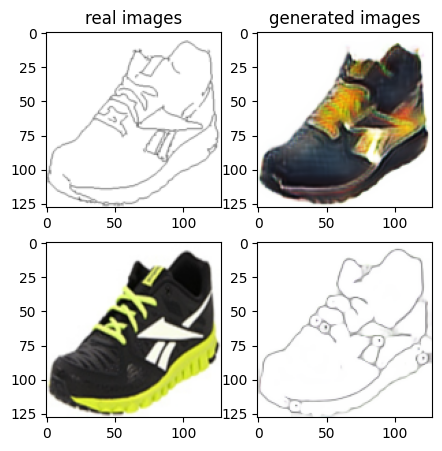

Train Epoch: 1 70% 	Total Loss: 1.426895 	Loss_G_AB: 0.299973	Loss_G_BA: 0.745956	Loss_cycle: 0.546073	Loss_D_A: 0.124023	Loss_D_B: 0.233834
0 35009 T:  2.062457323074341
Train Epoch: 1 70% 	Total Loss: 1.359268 	Loss_G_AB: 0.284012	Loss_G_BA: 0.722721	Loss_cycle: 0.505429	Loss_D_A: 0.081804	Loss_D_B: 0.268669
0 35019 T:  0.7920272350311279
Train Epoch: 1 70% 	Total Loss: 1.437104 	Loss_G_AB: 0.290119	Loss_G_BA: 0.805054	Loss_cycle: 0.528011	Loss_D_A: 0.126957	Loss_D_B: 0.234550
0 35029 T:  0.8223097324371338
Train Epoch: 1 70% 	Total Loss: 1.323544 	Loss_G_AB: 0.275253	Loss_G_BA: 0.737195	Loss_cycle: 0.419812	Loss_D_A: 0.154930	Loss_D_B: 0.242578
0 35039 T:  0.7632718086242676
Train Epoch: 1 70% 	Total Loss: 1.344907 	Loss_G_AB: 0.277917	Loss_G_BA: 0.791435	Loss_cycle: 0.473008	Loss_D_A: 0.076232	Loss_D_B: 0.260991
0 35049 T:  0.5980486869812012
Train Epoch: 1 70% 	Total Loss: 1.370665 	Loss_G_AB: 0.280939	Loss_G_BA: 0.951387	Loss_cycle: 0.487137	Loss_D_A: 0.027043	Loss_D_B: 0.240322


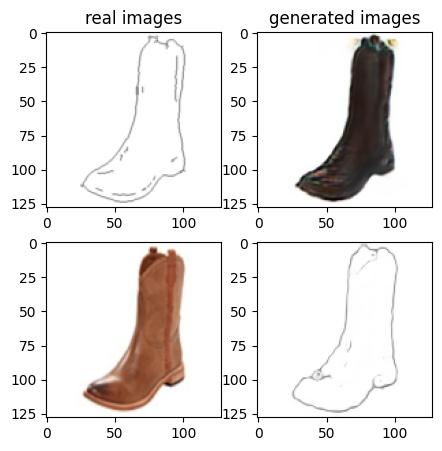

Train Epoch: 1 72% 	Total Loss: 1.351660 	Loss_G_AB: 0.320797	Loss_G_BA: 0.966635	Loss_cycle: 0.465292	Loss_D_A: 0.018713	Loss_D_B: 0.223939
0 36009 T:  2.019402503967285
Train Epoch: 1 72% 	Total Loss: 1.441330 	Loss_G_AB: 0.284577	Loss_G_BA: 0.984915	Loss_cycle: 0.536616	Loss_D_A: 0.011472	Loss_D_B: 0.258496
0 36019 T:  0.6152682304382324
Train Epoch: 1 72% 	Total Loss: 1.412128 	Loss_G_AB: 0.264617	Loss_G_BA: 1.038446	Loss_cycle: 0.482644	Loss_D_A: 0.017584	Loss_D_B: 0.260368
0 36029 T:  0.5884323120117188
Train Epoch: 1 72% 	Total Loss: 1.345354 	Loss_G_AB: 0.299845	Loss_G_BA: 1.022912	Loss_cycle: 0.445143	Loss_D_A: 0.007968	Loss_D_B: 0.230865
0 36039 T:  0.5971136093139648
Train Epoch: 1 72% 	Total Loss: 1.407882 	Loss_G_AB: 0.267496	Loss_G_BA: 0.959238	Loss_cycle: 0.535416	Loss_D_A: 0.008763	Loss_D_B: 0.250336
0 36049 T:  0.5857551097869873
Train Epoch: 1 72% 	Total Loss: 1.389551 	Loss_G_AB: 0.297388	Loss_G_BA: 1.028483	Loss_cycle: 0.485755	Loss_D_A: 0.005091	Loss_D_B: 0.235770


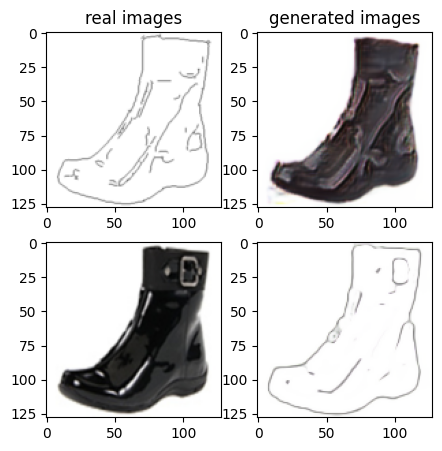

Train Epoch: 1 74% 	Total Loss: 1.310511 	Loss_G_AB: 0.287699	Loss_G_BA: 0.993651	Loss_cycle: 0.428548	Loss_D_A: 0.002212	Loss_D_B: 0.239076
0 37009 T:  1.369943380355835
Train Epoch: 1 74% 	Total Loss: 1.316720 	Loss_G_AB: 0.286757	Loss_G_BA: 1.004786	Loss_cycle: 0.438010	Loss_D_A: 0.001858	Loss_D_B: 0.231081
0 37019 T:  0.5762999057769775
Train Epoch: 1 74% 	Total Loss: 1.410690 	Loss_G_AB: 0.291268	Loss_G_BA: 0.980700	Loss_cycle: 0.516533	Loss_D_A: 0.004035	Loss_D_B: 0.254139
0 37029 T:  0.5592238903045654
Train Epoch: 1 74% 	Total Loss: 1.462296 	Loss_G_AB: 0.242788	Loss_G_BA: 0.998842	Loss_cycle: 0.569461	Loss_D_A: 0.004300	Loss_D_B: 0.267721
0 37039 T:  0.5897245407104492
Train Epoch: 1 74% 	Total Loss: 1.455399 	Loss_G_AB: 0.314769	Loss_G_BA: 0.987159	Loss_cycle: 0.558437	Loss_D_A: 0.005388	Loss_D_B: 0.240610
0 37049 T:  0.6359984874725342
Train Epoch: 1 74% 	Total Loss: 1.251132 	Loss_G_AB: 0.328383	Loss_G_BA: 0.853240	Loss_cycle: 0.390905	Loss_D_A: 0.051540	Loss_D_B: 0.217876


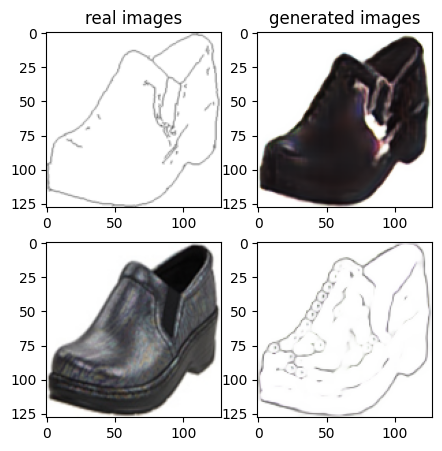

Train Epoch: 1 76% 	Total Loss: 1.374635 	Loss_G_AB: 0.320731	Loss_G_BA: 1.000166	Loss_cycle: 0.490239	Loss_D_A: 0.002379	Loss_D_B: 0.221569
0 38009 T:  1.4285519123077393
Train Epoch: 1 76% 	Total Loss: 1.429098 	Loss_G_AB: 0.264927	Loss_G_BA: 0.990259	Loss_cycle: 0.529942	Loss_D_A: 0.001778	Loss_D_B: 0.269786
0 38019 T:  0.6096270084381104
Train Epoch: 1 76% 	Total Loss: 1.350696 	Loss_G_AB: 0.296416	Loss_G_BA: 1.024657	Loss_cycle: 0.456412	Loss_D_A: 0.002719	Loss_D_B: 0.231029
0 38029 T:  0.6243729591369629
Train Epoch: 1 76% 	Total Loss: 1.289569 	Loss_G_AB: 0.288592	Loss_G_BA: 0.991629	Loss_cycle: 0.407396	Loss_D_A: 0.002253	Loss_D_B: 0.239810
0 38039 T:  0.6529946327209473
Train Epoch: 1 76% 	Total Loss: 1.326045 	Loss_G_AB: 0.246615	Loss_G_BA: 0.992912	Loss_cycle: 0.413836	Loss_D_A: 0.002528	Loss_D_B: 0.289918
0 38049 T:  0.6066477298736572
Train Epoch: 1 76% 	Total Loss: 1.390381 	Loss_G_AB: 0.287983	Loss_G_BA: 0.992742	Loss_cycle: 0.508203	Loss_D_A: 0.004034	Loss_D_B: 0.237781

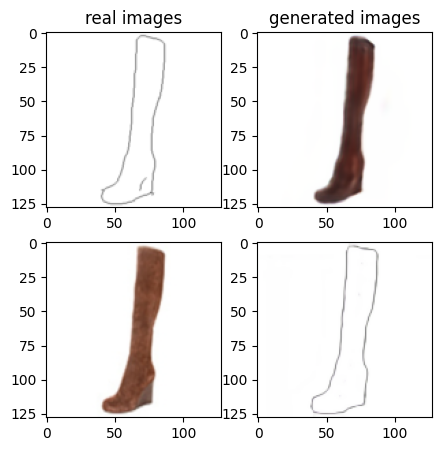

Train Epoch: 1 78% 	Total Loss: 1.352552 	Loss_G_AB: 0.295675	Loss_G_BA: 1.013560	Loss_cycle: 0.418803	Loss_D_A: 0.014426	Loss_D_B: 0.264705
0 39009 T:  1.6578624248504639
Train Epoch: 1 78% 	Total Loss: 1.326570 	Loss_G_AB: 0.297269	Loss_G_BA: 1.001759	Loss_cycle: 0.445737	Loss_D_A: 0.003320	Loss_D_B: 0.227999
0 39019 T:  0.626410722732544
Train Epoch: 1 78% 	Total Loss: 1.452885 	Loss_G_AB: 0.294829	Loss_G_BA: 1.004566	Loss_cycle: 0.555403	Loss_D_A: 0.004728	Loss_D_B: 0.243057
0 39029 T:  0.8047294616699219
Train Epoch: 1 78% 	Total Loss: 1.287409 	Loss_G_AB: 0.288328	Loss_G_BA: 0.997636	Loss_cycle: 0.398162	Loss_D_A: 0.002906	Loss_D_B: 0.243360
0 39039 T:  0.8213741779327393
Train Epoch: 1 78% 	Total Loss: 1.288980 	Loss_G_AB: 0.309892	Loss_G_BA: 0.971844	Loss_cycle: 0.395449	Loss_D_A: 0.003375	Loss_D_B: 0.249288
0 39049 T:  0.8202619552612305
Train Epoch: 1 78% 	Total Loss: 1.313317 	Loss_G_AB: 0.251511	Loss_G_BA: 1.022516	Loss_cycle: 0.402696	Loss_D_A: 0.002470	Loss_D_B: 0.271137


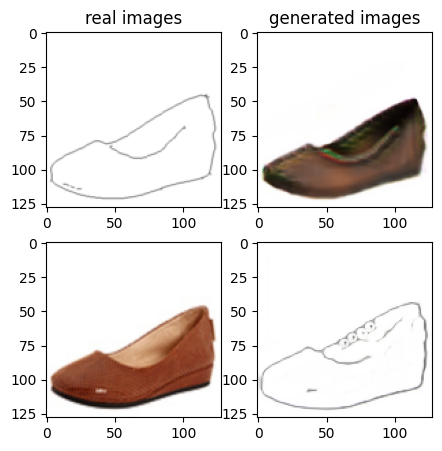

Train Epoch: 1 80% 	Total Loss: 1.236401 	Loss_G_AB: 0.268543	Loss_G_BA: 1.008026	Loss_cycle: 0.348441	Loss_D_A: 0.003584	Loss_D_B: 0.246092
0 40009 T:  2.0222859382629395
Train Epoch: 1 80% 	Total Loss: 1.377763 	Loss_G_AB: 0.339269	Loss_G_BA: 0.999324	Loss_cycle: 0.453707	Loss_D_A: 0.008446	Loss_D_B: 0.246313
0 40019 T:  0.8161816596984863
Train Epoch: 1 80% 	Total Loss: 1.393285 	Loss_G_AB: 0.346430	Loss_G_BA: 1.000753	Loss_cycle: 0.517252	Loss_D_A: 0.004920	Loss_D_B: 0.197521
0 40029 T:  0.8145394325256348
Train Epoch: 1 80% 	Total Loss: 1.402516 	Loss_G_AB: 0.336786	Loss_G_BA: 1.007547	Loss_cycle: 0.477190	Loss_D_A: 0.002705	Loss_D_B: 0.250454
0 40039 T:  0.7944190502166748
Train Epoch: 1 80% 	Total Loss: 1.347246 	Loss_G_AB: 0.300212	Loss_G_BA: 0.883792	Loss_cycle: 0.473298	Loss_D_A: 0.032708	Loss_D_B: 0.249238
0 40049 T:  0.6378989219665527
Train Epoch: 1 80% 	Total Loss: 1.394306 	Loss_G_AB: 0.334944	Loss_G_BA: 0.933034	Loss_cycle: 0.492969	Loss_D_A: 0.049690	Loss_D_B: 0.217659

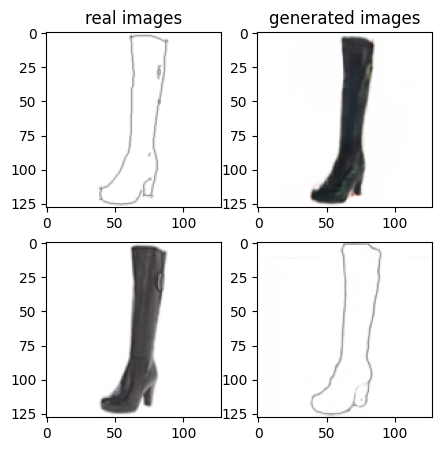

Train Epoch: 1 82% 	Total Loss: 1.383113 	Loss_G_AB: 0.347232	Loss_G_BA: 0.993995	Loss_cycle: 0.501744	Loss_D_A: 0.004205	Loss_D_B: 0.206551
0 41009 T:  1.4591608047485352
Train Epoch: 1 82% 	Total Loss: 1.492287 	Loss_G_AB: 0.347829	Loss_G_BA: 0.995844	Loss_cycle: 0.571464	Loss_D_A: 0.007546	Loss_D_B: 0.241440
0 41019 T:  0.6149435043334961
Train Epoch: 1 82% 	Total Loss: 1.275018 	Loss_G_AB: 0.307480	Loss_G_BA: 0.981628	Loss_cycle: 0.368463	Loss_D_A: 0.005576	Loss_D_B: 0.256425
0 41029 T:  0.6037993431091309
Train Epoch: 1 82% 	Total Loss: 1.334296 	Loss_G_AB: 0.293495	Loss_G_BA: 0.982976	Loss_cycle: 0.443248	Loss_D_A: 0.003914	Loss_D_B: 0.248898
0 41039 T:  0.5954432487487793
Train Epoch: 1 82% 	Total Loss: 1.382916 	Loss_G_AB: 0.285306	Loss_G_BA: 0.963970	Loss_cycle: 0.494873	Loss_D_A: 0.010704	Loss_D_B: 0.252700
0 41049 T:  0.5989410877227783
Train Epoch: 1 82% 	Total Loss: 1.288547 	Loss_G_AB: 0.301283	Loss_G_BA: 0.995468	Loss_cycle: 0.391536	Loss_D_A: 0.007404	Loss_D_B: 0.241231

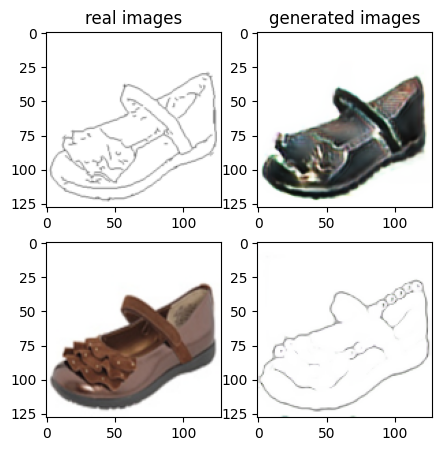

Train Epoch: 1 84% 	Total Loss: 1.263463 	Loss_G_AB: 0.257791	Loss_G_BA: 0.700641	Loss_cycle: 0.427316	Loss_D_A: 0.095776	Loss_D_B: 0.261155
0 42009 T:  1.430086374282837
Train Epoch: 1 84% 	Total Loss: 1.385684 	Loss_G_AB: 0.311115	Loss_G_BA: 0.928337	Loss_cycle: 0.447008	Loss_D_A: 0.075493	Loss_D_B: 0.243458
0 42019 T:  0.5984678268432617
Train Epoch: 1 84% 	Total Loss: 1.275199 	Loss_G_AB: 0.281417	Loss_G_BA: 0.705112	Loss_cycle: 0.458779	Loss_D_A: 0.083685	Loss_D_B: 0.239471
0 42029 T:  0.6022846698760986
Train Epoch: 1 84% 	Total Loss: 1.524957 	Loss_G_AB: 0.330617	Loss_G_BA: 1.084159	Loss_cycle: 0.564487	Loss_D_A: 0.016514	Loss_D_B: 0.236568
0 42039 T:  0.6370658874511719
Train Epoch: 1 84% 	Total Loss: 1.314825 	Loss_G_AB: 0.330997	Loss_G_BA: 0.957513	Loss_cycle: 0.420734	Loss_D_A: 0.014413	Loss_D_B: 0.235423
0 42049 T:  0.6144185066223145
Train Epoch: 1 84% 	Total Loss: 1.365141 	Loss_G_AB: 0.260781	Loss_G_BA: 0.990587	Loss_cycle: 0.458723	Loss_D_A: 0.010729	Loss_D_B: 0.270005


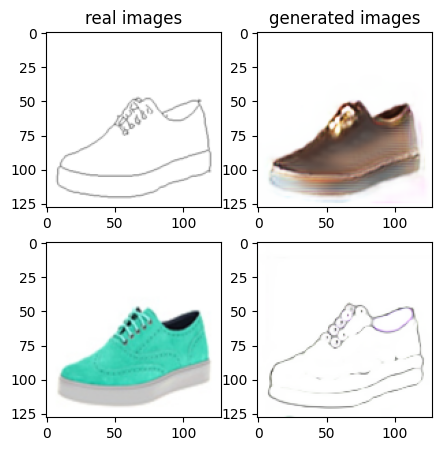

Train Epoch: 1 86% 	Total Loss: 1.342099 	Loss_G_AB: 0.274973	Loss_G_BA: 1.008209	Loss_cycle: 0.443812	Loss_D_A: 0.002704	Loss_D_B: 0.253992
0 43009 T:  1.4702391624450684
Train Epoch: 1 86% 	Total Loss: 1.410286 	Loss_G_AB: 0.301009	Loss_G_BA: 1.008938	Loss_cycle: 0.505443	Loss_D_A: 0.002950	Loss_D_B: 0.246920
0 43019 T:  0.676887035369873
Train Epoch: 1 86% 	Total Loss: 1.440897 	Loss_G_AB: 0.336398	Loss_G_BA: 0.993664	Loss_cycle: 0.506651	Loss_D_A: 0.004853	Loss_D_B: 0.264362
0 43029 T:  0.870507001876831
Train Epoch: 1 86% 	Total Loss: 1.316238 	Loss_G_AB: 0.268404	Loss_G_BA: 0.975660	Loss_cycle: 0.430244	Loss_D_A: 0.002905	Loss_D_B: 0.261058
0 43039 T:  0.8240010738372803
Train Epoch: 1 86% 	Total Loss: 1.374576 	Loss_G_AB: 0.312701	Loss_G_BA: 1.030485	Loss_cycle: 0.481591	Loss_D_A: 0.002424	Loss_D_B: 0.218968
0 43049 T:  0.814568042755127
Train Epoch: 1 86% 	Total Loss: 1.331361 	Loss_G_AB: 0.288254	Loss_G_BA: 0.989631	Loss_cycle: 0.436775	Loss_D_A: 0.002519	Loss_D_B: 0.253124
0 

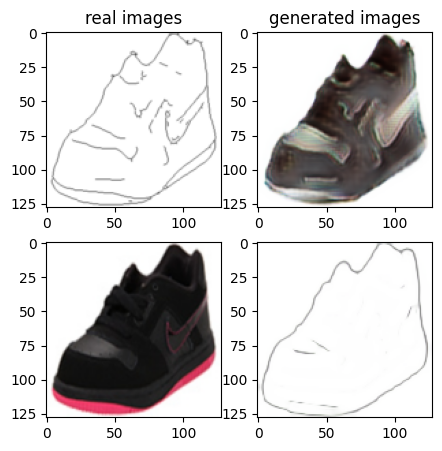

Train Epoch: 1 88% 	Total Loss: 1.306092 	Loss_G_AB: 0.291889	Loss_G_BA: 0.730582	Loss_cycle: 0.455768	Loss_D_A: 0.091668	Loss_D_B: 0.247420
0 44009 T:  2.577664613723755
Train Epoch: 1 88% 	Total Loss: 1.278321 	Loss_G_AB: 0.290438	Loss_G_BA: 1.023599	Loss_cycle: 0.358243	Loss_D_A: 0.018298	Loss_D_B: 0.244761
0 44019 T:  1.1075325012207031
Train Epoch: 1 88% 	Total Loss: 1.305117 	Loss_G_AB: 0.271626	Loss_G_BA: 1.046183	Loss_cycle: 0.370656	Loss_D_A: 0.009982	Loss_D_B: 0.265575
0 44029 T:  1.0157556533813477
Train Epoch: 1 88% 	Total Loss: 1.327152 	Loss_G_AB: 0.272169	Loss_G_BA: 1.013333	Loss_cycle: 0.441734	Loss_D_A: 0.004942	Loss_D_B: 0.237725
0 44039 T:  0.9862935543060303
Train Epoch: 1 88% 	Total Loss: 1.331056 	Loss_G_AB: 0.316325	Loss_G_BA: 0.936992	Loss_cycle: 0.468219	Loss_D_A: 0.017605	Loss_D_B: 0.218573
0 44049 T:  1.1111223697662354
Train Epoch: 1 88% 	Total Loss: 1.255057 	Loss_G_AB: 0.273258	Loss_G_BA: 0.828833	Loss_cycle: 0.382062	Loss_D_A: 0.063550	Loss_D_B: 0.258400


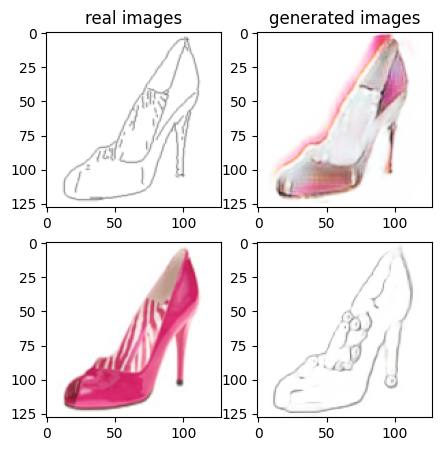

Train Epoch: 1 90% 	Total Loss: 1.285425 	Loss_G_AB: 0.275520	Loss_G_BA: 0.974644	Loss_cycle: 0.405179	Loss_D_A: 0.002621	Loss_D_B: 0.252543
0 45009 T:  1.4974303245544434
Train Epoch: 1 90% 	Total Loss: 1.361995 	Loss_G_AB: 0.291961	Loss_G_BA: 0.995052	Loss_cycle: 0.475273	Loss_D_A: 0.008235	Loss_D_B: 0.234981
0 45019 T:  0.641655445098877
Train Epoch: 1 90% 	Total Loss: 1.386507 	Loss_G_AB: 0.301677	Loss_G_BA: 1.000919	Loss_cycle: 0.495463	Loss_D_A: 0.001883	Loss_D_B: 0.237863
0 45029 T:  0.6209909915924072
Train Epoch: 1 90% 	Total Loss: 1.198735 	Loss_G_AB: 0.273742	Loss_G_BA: 0.978032	Loss_cycle: 0.324244	Loss_D_A: 0.002801	Loss_D_B: 0.245803
0 45039 T:  0.6630890369415283
Train Epoch: 1 90% 	Total Loss: 1.396532 	Loss_G_AB: 0.287375	Loss_G_BA: 0.987587	Loss_cycle: 0.519456	Loss_D_A: 0.001939	Loss_D_B: 0.237656
0 45049 T:  0.6415059566497803
Train Epoch: 1 90% 	Total Loss: 1.387964 	Loss_G_AB: 0.273056	Loss_G_BA: 1.016117	Loss_cycle: 0.499600	Loss_D_A: 0.002487	Loss_D_B: 0.241291


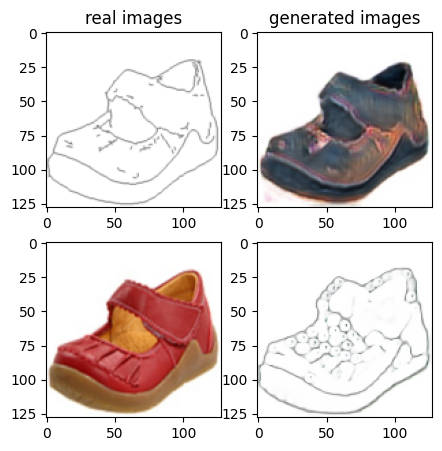

Train Epoch: 1 92% 	Total Loss: 1.252864 	Loss_G_AB: 0.311650	Loss_G_BA: 0.988770	Loss_cycle: 0.373537	Loss_D_A: 0.005050	Loss_D_B: 0.224066
0 46009 T:  1.4568836688995361
Train Epoch: 1 92% 	Total Loss: 1.386968 	Loss_G_AB: 0.279986	Loss_G_BA: 0.861285	Loss_cycle: 0.507372	Loss_D_A: 0.038274	Loss_D_B: 0.270687
0 46019 T:  0.6088387966156006
Train Epoch: 1 92% 	Total Loss: 1.379360 	Loss_G_AB: 0.305020	Loss_G_BA: 1.037119	Loss_cycle: 0.426935	Loss_D_A: 0.040569	Loss_D_B: 0.240787
0 46029 T:  0.66524338722229
Train Epoch: 1 92% 	Total Loss: 1.475140 	Loss_G_AB: 0.316824	Loss_G_BA: 1.014085	Loss_cycle: 0.562233	Loss_D_A: 0.017346	Loss_D_B: 0.230106
0 46039 T:  0.5810863971710205
Train Epoch: 1 92% 	Total Loss: 1.276359 	Loss_G_AB: 0.321323	Loss_G_BA: 0.937898	Loss_cycle: 0.397123	Loss_D_A: 0.020600	Loss_D_B: 0.229025
0 46049 T:  0.6034336090087891
Train Epoch: 1 92% 	Total Loss: 1.330081 	Loss_G_AB: 0.278188	Loss_G_BA: 0.956891	Loss_cycle: 0.433125	Loss_D_A: 0.008364	Loss_D_B: 0.271053
0

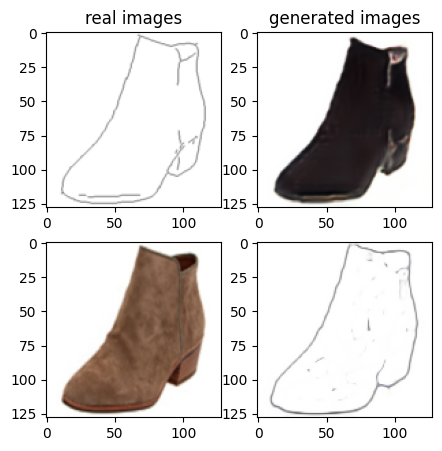

Train Epoch: 1 94% 	Total Loss: 1.311548 	Loss_G_AB: 0.277643	Loss_G_BA: 0.953744	Loss_cycle: 0.440264	Loss_D_A: 0.007572	Loss_D_B: 0.248019
0 47009 T:  1.7006189823150635
Train Epoch: 1 94% 	Total Loss: 1.288297 	Loss_G_AB: 0.279857	Loss_G_BA: 0.992206	Loss_cycle: 0.380897	Loss_D_A: 0.006145	Loss_D_B: 0.265223
0 47019 T:  0.604440450668335
Train Epoch: 1 94% 	Total Loss: 1.434299 	Loss_G_AB: 0.267351	Loss_G_BA: 1.005250	Loss_cycle: 0.528114	Loss_D_A: 0.002348	Loss_D_B: 0.267537
0 47029 T:  0.8437995910644531
Train Epoch: 1 94% 	Total Loss: 1.344155 	Loss_G_AB: 0.280488	Loss_G_BA: 1.003963	Loss_cycle: 0.446029	Loss_D_A: 0.001511	Loss_D_B: 0.254390
0 47039 T:  0.7687957286834717
Train Epoch: 1 94% 	Total Loss: 1.345418 	Loss_G_AB: 0.279747	Loss_G_BA: 1.006846	Loss_cycle: 0.459912	Loss_D_A: 0.002068	Loss_D_B: 0.240141
0 47049 T:  0.79245924949646
Train Epoch: 1 94% 	Total Loss: 1.366218 	Loss_G_AB: 0.278639	Loss_G_BA: 1.001090	Loss_cycle: 0.473054	Loss_D_A: 0.001749	Loss_D_B: 0.251551
0 

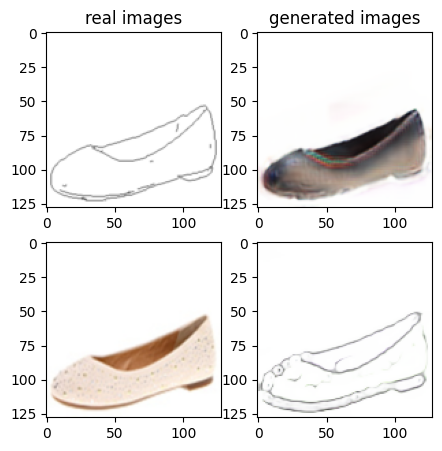

Train Epoch: 1 96% 	Total Loss: 1.210850 	Loss_G_AB: 0.297061	Loss_G_BA: 1.008805	Loss_cycle: 0.299787	Loss_D_A: 0.002512	Loss_D_B: 0.255617
0 48009 T:  1.8143455982208252
Train Epoch: 1 96% 	Total Loss: 1.357723 	Loss_G_AB: 0.291439	Loss_G_BA: 0.960828	Loss_cycle: 0.487979	Loss_D_A: 0.006448	Loss_D_B: 0.237163
0 48019 T:  0.8838427066802979
Train Epoch: 1 96% 	Total Loss: 1.450754 	Loss_G_AB: 0.273346	Loss_G_BA: 1.035627	Loss_cycle: 0.518399	Loss_D_A: 0.003367	Loss_D_B: 0.274502
0 48029 T:  0.8309378623962402
Train Epoch: 1 96% 	Total Loss: 1.205184 	Loss_G_AB: 0.311337	Loss_G_BA: 0.977649	Loss_cycle: 0.311305	Loss_D_A: 0.003271	Loss_D_B: 0.246115
0 48039 T:  0.7942109107971191
Train Epoch: 1 96% 	Total Loss: 1.213169 	Loss_G_AB: 0.314399	Loss_G_BA: 1.018512	Loss_cycle: 0.303136	Loss_D_A: 0.002900	Loss_D_B: 0.240677
0 48049 T:  0.816124439239502
Train Epoch: 1 96% 	Total Loss: 1.246007 	Loss_G_AB: 0.263744	Loss_G_BA: 0.994201	Loss_cycle: 0.353687	Loss_D_A: 0.001945	Loss_D_B: 0.261402


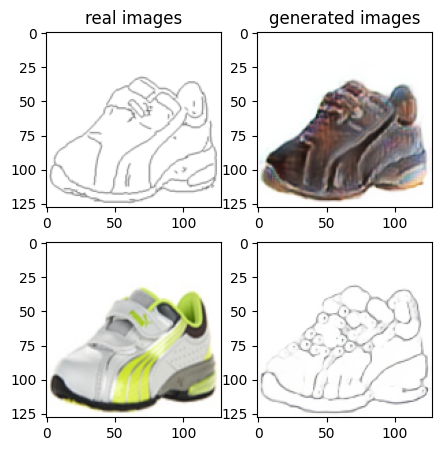

Train Epoch: 1 98% 	Total Loss: 1.257635 	Loss_G_AB: 0.305353	Loss_G_BA: 0.997369	Loss_cycle: 0.357209	Loss_D_A: 0.005749	Loss_D_B: 0.243316
0 49009 T:  2.1157567501068115
Train Epoch: 1 98% 	Total Loss: 1.319408 	Loss_G_AB: 0.296761	Loss_G_BA: 0.980346	Loss_cycle: 0.439588	Loss_D_A: 0.011431	Loss_D_B: 0.229836
0 49019 T:  0.7721295356750488
Train Epoch: 1 98% 	Total Loss: 1.427587 	Loss_G_AB: 0.310822	Loss_G_BA: 0.952465	Loss_cycle: 0.538526	Loss_D_A: 0.014310	Loss_D_B: 0.243107
0 49029 T:  0.8301558494567871
Train Epoch: 1 98% 	Total Loss: 1.350500 	Loss_G_AB: 0.292563	Loss_G_BA: 0.947094	Loss_cycle: 0.443856	Loss_D_A: 0.028015	Loss_D_B: 0.258801
0 49039 T:  0.8696777820587158
Train Epoch: 1 98% 	Total Loss: 1.388182 	Loss_G_AB: 0.279708	Loss_G_BA: 0.815166	Loss_cycle: 0.502839	Loss_D_A: 0.066277	Loss_D_B: 0.271629
0 49049 T:  0.647615909576416
Train Epoch: 1 98% 	Total Loss: 1.408757 	Loss_G_AB: 0.285272	Loss_G_BA: 0.961362	Loss_cycle: 0.493002	Loss_D_A: 0.027324	Loss_D_B: 0.265114


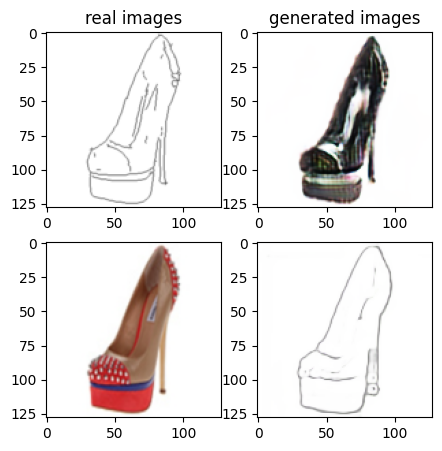

Train Epoch: 2 0% 	Total Loss: 1.364656 	Loss_G_AB: 0.325510	Loss_G_BA: 0.967888	Loss_cycle: 0.474308	Loss_D_A: 0.010579	Loss_D_B: 0.233070
1 50009 T:  1.8157086372375488
Train Epoch: 2 0% 	Total Loss: 1.333810 	Loss_G_AB: 0.320134	Loss_G_BA: 0.859501	Loss_cycle: 0.390790	Loss_D_A: 0.110380	Loss_D_B: 0.242822
1 50019 T:  0.6036884784698486
Train Epoch: 2 0% 	Total Loss: 1.328367 	Loss_G_AB: 0.359309	Loss_G_BA: 0.687931	Loss_cycle: 0.422753	Loss_D_A: 0.112460	Loss_D_B: 0.269534
1 50029 T:  0.6037266254425049
Train Epoch: 2 0% 	Total Loss: 1.356683 	Loss_G_AB: 0.296658	Loss_G_BA: 0.678703	Loss_cycle: 0.444598	Loss_D_A: 0.162346	Loss_D_B: 0.262059
1 50039 T:  0.6258618831634521
Train Epoch: 2 0% 	Total Loss: 1.353082 	Loss_G_AB: 0.305066	Loss_G_BA: 0.622492	Loss_cycle: 0.517390	Loss_D_A: 0.143096	Loss_D_B: 0.228817
1 50049 T:  0.594893217086792
Train Epoch: 2 0% 	Total Loss: 1.370189 	Loss_G_AB: 0.302297	Loss_G_BA: 1.003269	Loss_cycle: 0.441311	Loss_D_A: 0.054409	Loss_D_B: 0.221686
1 5005

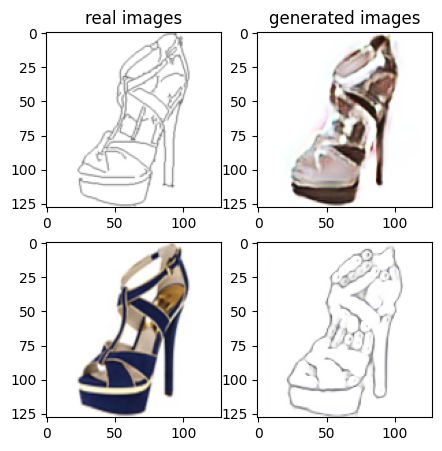

Train Epoch: 2 2% 	Total Loss: 1.355600 	Loss_G_AB: 0.314299	Loss_G_BA: 0.987051	Loss_cycle: 0.454467	Loss_D_A: 0.002615	Loss_D_B: 0.247843
1 51009 T:  1.4104604721069336
Train Epoch: 2 2% 	Total Loss: 1.324921 	Loss_G_AB: 0.300863	Loss_G_BA: 0.982654	Loss_cycle: 0.431373	Loss_D_A: 0.004403	Loss_D_B: 0.247388
1 51019 T:  0.6023170948028564
Train Epoch: 2 2% 	Total Loss: 1.400622 	Loss_G_AB: 0.303392	Loss_G_BA: 1.017721	Loss_cycle: 0.510583	Loss_D_A: 0.002322	Loss_D_B: 0.227160
1 51029 T:  0.5623526573181152
Train Epoch: 2 2% 	Total Loss: 1.392050 	Loss_G_AB: 0.273416	Loss_G_BA: 0.992920	Loss_cycle: 0.517899	Loss_D_A: 0.004687	Loss_D_B: 0.236297
1 51039 T:  0.6523511409759521
Train Epoch: 2 2% 	Total Loss: 1.231379 	Loss_G_AB: 0.330107	Loss_G_BA: 0.992727	Loss_cycle: 0.346771	Loss_D_A: 0.002782	Loss_D_B: 0.220410
1 51049 T:  0.6316568851470947
Train Epoch: 2 2% 	Total Loss: 1.325308 	Loss_G_AB: 0.318123	Loss_G_BA: 1.007936	Loss_cycle: 0.407977	Loss_D_A: 0.002423	Loss_D_B: 0.251880
1 510

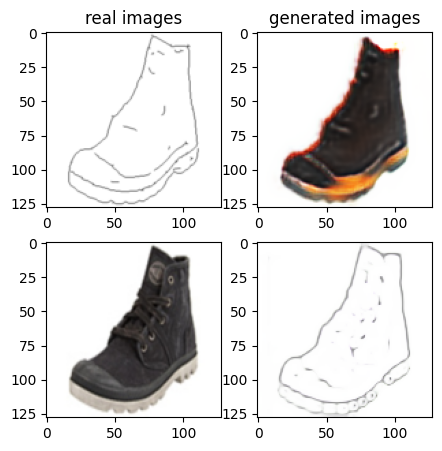

Train Epoch: 2 4% 	Total Loss: 1.242918 	Loss_G_AB: 0.292720	Loss_G_BA: 0.997881	Loss_cycle: 0.339246	Loss_D_A: 0.002436	Loss_D_B: 0.255936
1 52009 T:  1.4297575950622559
Train Epoch: 2 4% 	Total Loss: 1.359473 	Loss_G_AB: 0.283427	Loss_G_BA: 0.988566	Loss_cycle: 0.466829	Loss_D_A: 0.001956	Loss_D_B: 0.254692
1 52019 T:  0.6019227504730225
Train Epoch: 2 4% 	Total Loss: 1.359017 	Loss_G_AB: 0.302149	Loss_G_BA: 1.026747	Loss_cycle: 0.460968	Loss_D_A: 0.003185	Loss_D_B: 0.230416
1 52029 T:  0.6071524620056152
Train Epoch: 2 4% 	Total Loss: 1.271815 	Loss_G_AB: 0.272613	Loss_G_BA: 0.994276	Loss_cycle: 0.389815	Loss_D_A: 0.001609	Loss_D_B: 0.246946
1 52039 T:  0.6040472984313965
Train Epoch: 2 4% 	Total Loss: 1.246105 	Loss_G_AB: 0.318044	Loss_G_BA: 0.999668	Loss_cycle: 0.369858	Loss_D_A: 0.001643	Loss_D_B: 0.215748
1 52049 T:  0.5813241004943848
Train Epoch: 2 4% 	Total Loss: 1.260391 	Loss_G_AB: 0.292876	Loss_G_BA: 0.986460	Loss_cycle: 0.381531	Loss_D_A: 0.001689	Loss_D_B: 0.237503
1 520

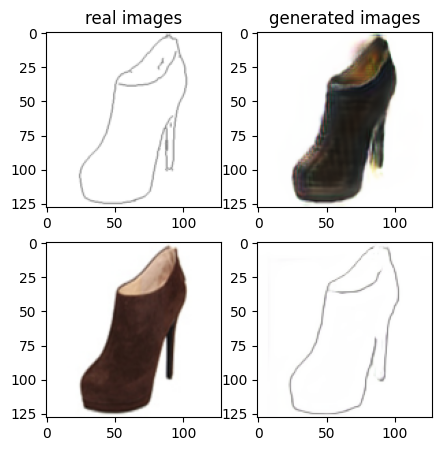

Train Epoch: 2 6% 	Total Loss: 1.441581 	Loss_G_AB: 0.283302	Loss_G_BA: 1.014262	Loss_cycle: 0.530957	Loss_D_A: 0.002549	Loss_D_B: 0.259294
1 53009 T:  1.4638962745666504
Train Epoch: 2 6% 	Total Loss: 1.236705 	Loss_G_AB: 0.308049	Loss_G_BA: 0.989676	Loss_cycle: 0.357819	Loss_D_A: 0.002700	Loss_D_B: 0.227324
1 53019 T:  0.610213041305542
Train Epoch: 2 6% 	Total Loss: 1.387135 	Loss_G_AB: 0.310107	Loss_G_BA: 0.998227	Loss_cycle: 0.492242	Loss_D_A: 0.001837	Loss_D_B: 0.238888
1 53029 T:  0.5833194255828857
Train Epoch: 2 6% 	Total Loss: 1.346685 	Loss_G_AB: 0.299882	Loss_G_BA: 0.987597	Loss_cycle: 0.474794	Loss_D_A: 0.002977	Loss_D_B: 0.225175
1 53039 T:  0.62131667137146
Train Epoch: 2 6% 	Total Loss: 1.290504 	Loss_G_AB: 0.331881	Loss_G_BA: 0.999743	Loss_cycle: 0.417707	Loss_D_A: 0.002668	Loss_D_B: 0.204317
1 53049 T:  0.5806291103363037
Train Epoch: 2 6% 	Total Loss: 1.372148 	Loss_G_AB: 0.279060	Loss_G_BA: 1.003834	Loss_cycle: 0.454604	Loss_D_A: 0.001962	Loss_D_B: 0.274135
1 53059 

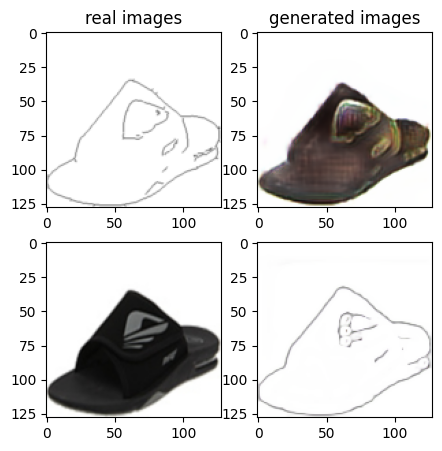

Train Epoch: 2 8% 	Total Loss: 1.303402 	Loss_G_AB: 0.306105	Loss_G_BA: 0.980880	Loss_cycle: 0.406691	Loss_D_A: 0.004863	Loss_D_B: 0.248356
1 54009 T:  1.666189432144165
Train Epoch: 2 8% 	Total Loss: 1.426205 	Loss_G_AB: 0.262300	Loss_G_BA: 1.006111	Loss_cycle: 0.527246	Loss_D_A: 0.007739	Loss_D_B: 0.257015
1 54019 T:  0.6190123558044434
Train Epoch: 2 8% 	Total Loss: 1.402935 	Loss_G_AB: 0.284645	Loss_G_BA: 1.013613	Loss_cycle: 0.493787	Loss_D_A: 0.002629	Loss_D_B: 0.257389
1 54029 T:  0.6109097003936768
Train Epoch: 2 8% 	Total Loss: 1.225022 	Loss_G_AB: 0.281171	Loss_G_BA: 0.996369	Loss_cycle: 0.352213	Loss_D_A: 0.002094	Loss_D_B: 0.231945
1 54039 T:  0.6044771671295166
Train Epoch: 2 8% 	Total Loss: 1.320163 	Loss_G_AB: 0.301350	Loss_G_BA: 0.979052	Loss_cycle: 0.421040	Loss_D_A: 0.003066	Loss_D_B: 0.255855
1 54049 T:  0.8551106452941895
Train Epoch: 2 8% 	Total Loss: 1.284228 	Loss_G_AB: 0.256831	Loss_G_BA: 0.956454	Loss_cycle: 0.416232	Loss_D_A: 0.009539	Loss_D_B: 0.251814
1 5405

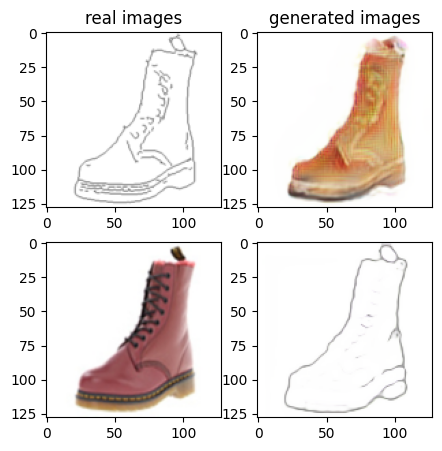

Train Epoch: 2 10% 	Total Loss: 1.229845 	Loss_G_AB: 0.302095	Loss_G_BA: 0.956510	Loss_cycle: 0.369524	Loss_D_A: 0.008821	Loss_D_B: 0.222198
1 55009 T:  1.9917821884155273
Train Epoch: 2 10% 	Total Loss: 1.379525 	Loss_G_AB: 0.332909	Loss_G_BA: 1.030320	Loss_cycle: 0.414250	Loss_D_A: 0.006917	Loss_D_B: 0.276743
1 55019 T:  0.8768191337585449
Train Epoch: 2 10% 	Total Loss: 1.392188 	Loss_G_AB: 0.316868	Loss_G_BA: 1.020310	Loss_cycle: 0.426486	Loss_D_A: 0.004115	Loss_D_B: 0.292998
1 55029 T:  0.8254461288452148
Train Epoch: 2 10% 	Total Loss: 1.307030 	Loss_G_AB: 0.290698	Loss_G_BA: 0.998966	Loss_cycle: 0.401202	Loss_D_A: 0.004832	Loss_D_B: 0.256164
1 55039 T:  0.8373713493347168
Train Epoch: 2 10% 	Total Loss: 1.187060 	Loss_G_AB: 0.280224	Loss_G_BA: 0.978729	Loss_cycle: 0.302559	Loss_D_A: 0.007109	Loss_D_B: 0.247915
1 55049 T:  0.9124200344085693
Train Epoch: 2 11% 	Total Loss: 1.312842 	Loss_G_AB: 0.247080	Loss_G_BA: 0.934609	Loss_cycle: 0.435447	Loss_D_A: 0.014552	Loss_D_B: 0.271999

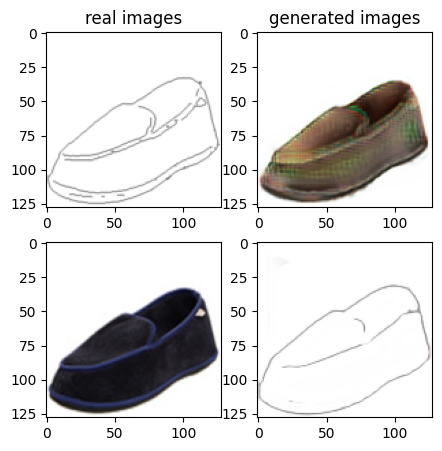

Train Epoch: 2 12% 	Total Loss: 1.211717 	Loss_G_AB: 0.286753	Loss_G_BA: 0.956781	Loss_cycle: 0.340855	Loss_D_A: 0.008628	Loss_D_B: 0.240466
1 56009 T:  1.5897455215454102
Train Epoch: 2 12% 	Total Loss: 1.424944 	Loss_G_AB: 0.389577	Loss_G_BA: 1.003993	Loss_cycle: 0.493881	Loss_D_A: 0.004065	Loss_D_B: 0.230213
1 56019 T:  0.6153454780578613
Train Epoch: 2 12% 	Total Loss: 1.258992 	Loss_G_AB: 0.296581	Loss_G_BA: 1.005000	Loss_cycle: 0.366485	Loss_D_A: 0.002658	Loss_D_B: 0.239058
1 56029 T:  0.6306653022766113
Train Epoch: 2 12% 	Total Loss: 1.343338 	Loss_G_AB: 0.325756	Loss_G_BA: 0.944038	Loss_cycle: 0.459161	Loss_D_A: 0.015150	Loss_D_B: 0.234129
1 56039 T:  0.6319606304168701
Train Epoch: 2 12% 	Total Loss: 1.295384 	Loss_G_AB: 0.308564	Loss_G_BA: 0.964292	Loss_cycle: 0.408277	Loss_D_A: 0.005835	Loss_D_B: 0.244844
1 56049 T:  0.6246702671051025
Train Epoch: 2 13% 	Total Loss: 1.413417 	Loss_G_AB: 0.320749	Loss_G_BA: 0.981154	Loss_cycle: 0.510298	Loss_D_A: 0.008693	Loss_D_B: 0.243474

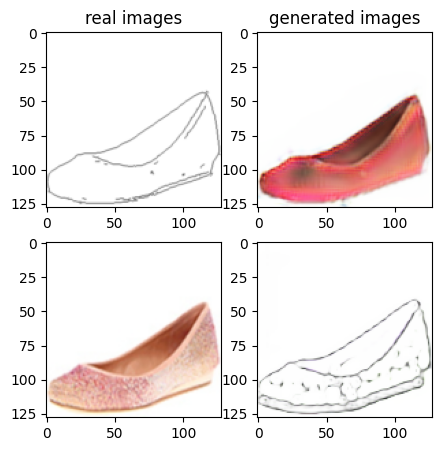

Train Epoch: 2 14% 	Total Loss: 1.345405 	Loss_G_AB: 0.284046	Loss_G_BA: 1.007136	Loss_cycle: 0.427964	Loss_D_A: 0.001708	Loss_D_B: 0.270142
1 57009 T:  1.4284989833831787
Train Epoch: 2 14% 	Total Loss: 1.320651 	Loss_G_AB: 0.306869	Loss_G_BA: 1.000216	Loss_cycle: 0.385979	Loss_D_A: 0.001558	Loss_D_B: 0.279572
1 57019 T:  0.6220240592956543
Train Epoch: 2 14% 	Total Loss: 1.297576 	Loss_G_AB: 0.326781	Loss_G_BA: 1.004561	Loss_cycle: 0.384363	Loss_D_A: 0.002962	Loss_D_B: 0.244579
1 57029 T:  0.5945448875427246
Train Epoch: 2 14% 	Total Loss: 1.400416 	Loss_G_AB: 0.351849	Loss_G_BA: 0.990829	Loss_cycle: 0.497802	Loss_D_A: 0.002929	Loss_D_B: 0.228346
1 57039 T:  0.6103761196136475
Train Epoch: 2 14% 	Total Loss: 1.265331 	Loss_G_AB: 0.298727	Loss_G_BA: 1.006235	Loss_cycle: 0.374024	Loss_D_A: 0.002295	Loss_D_B: 0.236531
1 57049 T:  0.6193969249725342
Train Epoch: 2 15% 	Total Loss: 1.243926 	Loss_G_AB: 0.283009	Loss_G_BA: 0.974549	Loss_cycle: 0.361204	Loss_D_A: 0.007214	Loss_D_B: 0.246729

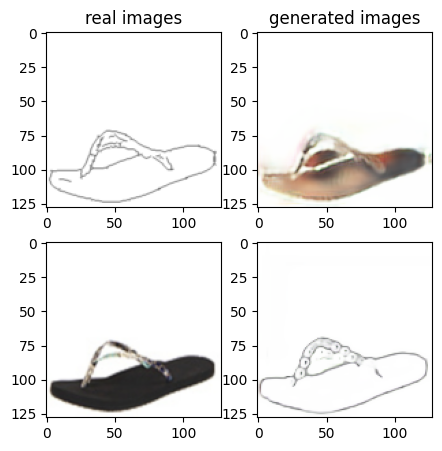

Train Epoch: 2 16% 	Total Loss: 1.268248 	Loss_G_AB: 0.294240	Loss_G_BA: 1.005266	Loss_cycle: 0.352823	Loss_D_A: 0.002508	Loss_D_B: 0.263163
1 58009 T:  1.4427523612976074
Train Epoch: 2 16% 	Total Loss: 1.252949 	Loss_G_AB: 0.310653	Loss_G_BA: 0.997318	Loss_cycle: 0.346116	Loss_D_A: 0.002344	Loss_D_B: 0.250504
1 58019 T:  0.6147956848144531
Train Epoch: 2 16% 	Total Loss: 1.341454 	Loss_G_AB: 0.273881	Loss_G_BA: 0.984812	Loss_cycle: 0.455740	Loss_D_A: 0.002683	Loss_D_B: 0.253685
1 58029 T:  0.605015754699707
Train Epoch: 2 16% 	Total Loss: 1.270876 	Loss_G_AB: 0.342315	Loss_G_BA: 1.031850	Loss_cycle: 0.358418	Loss_D_A: 0.002012	Loss_D_B: 0.223364
1 58039 T:  0.6705038547515869
Train Epoch: 2 17% 	Total Loss: 1.220622 	Loss_G_AB: 0.310437	Loss_G_BA: 0.994578	Loss_cycle: 0.352992	Loss_D_A: 0.001478	Loss_D_B: 0.213645
1 58049 T:  0.8253445625305176
Train Epoch: 2 17% 	Total Loss: 1.320810 	Loss_G_AB: 0.323887	Loss_G_BA: 0.986431	Loss_cycle: 0.407023	Loss_D_A: 0.002383	Loss_D_B: 0.256244


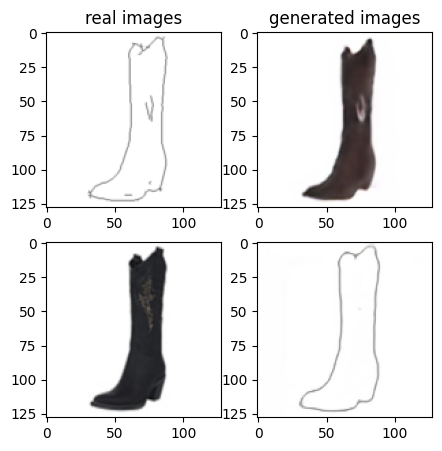

Train Epoch: 2 18% 	Total Loss: 1.248479 	Loss_G_AB: 0.286138	Loss_G_BA: 0.986783	Loss_cycle: 0.357417	Loss_D_A: 0.002396	Loss_D_B: 0.252206
1 59009 T:  2.0310473442077637
Train Epoch: 2 18% 	Total Loss: 1.256192 	Loss_G_AB: 0.311594	Loss_G_BA: 0.987416	Loss_cycle: 0.362831	Loss_D_A: 0.002189	Loss_D_B: 0.241667
1 59019 T:  0.8364260196685791
Train Epoch: 2 18% 	Total Loss: 1.218034 	Loss_G_AB: 0.333370	Loss_G_BA: 1.004309	Loss_cycle: 0.314660	Loss_D_A: 0.002649	Loss_D_B: 0.231885
1 59029 T:  0.8556206226348877
Train Epoch: 2 18% 	Total Loss: 1.359959 	Loss_G_AB: 0.297580	Loss_G_BA: 0.995172	Loss_cycle: 0.449654	Loss_D_A: 0.002377	Loss_D_B: 0.261552
1 59039 T:  0.8564343452453613
Train Epoch: 2 19% 	Total Loss: 1.372104 	Loss_G_AB: 0.321728	Loss_G_BA: 1.003495	Loss_cycle: 0.483735	Loss_D_A: 0.002139	Loss_D_B: 0.223619
1 59049 T:  0.8721745014190674
Train Epoch: 2 19% 	Total Loss: 1.265351 	Loss_G_AB: 0.285874	Loss_G_BA: 1.001466	Loss_cycle: 0.362237	Loss_D_A: 0.003053	Loss_D_B: 0.256391

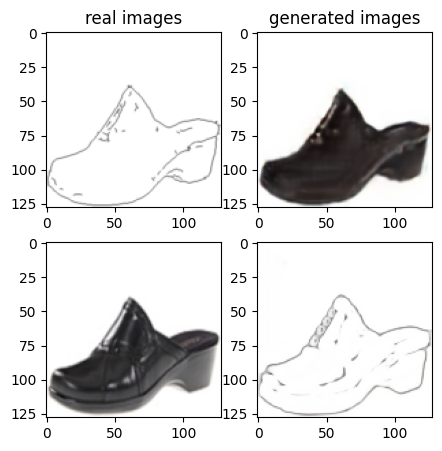

Train Epoch: 2 20% 	Total Loss: 1.217519 	Loss_G_AB: 0.317166	Loss_G_BA: 0.982862	Loss_cycle: 0.338265	Loss_D_A: 0.002824	Loss_D_B: 0.226417
1 60009 T:  1.4384078979492188
Train Epoch: 2 20% 	Total Loss: 1.257585 	Loss_G_AB: 0.331533	Loss_G_BA: 1.002684	Loss_cycle: 0.367018	Loss_D_A: 0.001902	Loss_D_B: 0.221557
1 60019 T:  0.6584217548370361
Train Epoch: 2 20% 	Total Loss: 1.261955 	Loss_G_AB: 0.322292	Loss_G_BA: 1.004868	Loss_cycle: 0.346702	Loss_D_A: 0.002434	Loss_D_B: 0.249238
1 60029 T:  0.6198916435241699
Train Epoch: 2 20% 	Total Loss: 1.200159 	Loss_G_AB: 0.276953	Loss_G_BA: 0.986420	Loss_cycle: 0.306518	Loss_D_A: 0.003378	Loss_D_B: 0.258577
1 60039 T:  0.6105854511260986
Train Epoch: 2 21% 	Total Loss: 1.322121 	Loss_G_AB: 0.312725	Loss_G_BA: 1.024531	Loss_cycle: 0.410264	Loss_D_A: 0.003078	Loss_D_B: 0.240151
1 60049 T:  0.614368200302124
Train Epoch: 2 21% 	Total Loss: 1.284425 	Loss_G_AB: 0.339410	Loss_G_BA: 0.994057	Loss_cycle: 0.381257	Loss_D_A: 0.002201	Loss_D_B: 0.234234


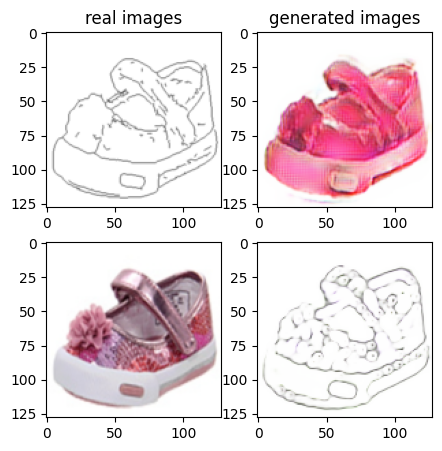

Train Epoch: 2 22% 	Total Loss: 1.342809 	Loss_G_AB: 0.336942	Loss_G_BA: 0.998129	Loss_cycle: 0.449198	Loss_D_A: 0.001745	Loss_D_B: 0.224330
1 61009 T:  1.4141194820404053
Train Epoch: 2 22% 	Total Loss: 1.309054 	Loss_G_AB: 0.354248	Loss_G_BA: 0.992296	Loss_cycle: 0.416756	Loss_D_A: 0.002931	Loss_D_B: 0.216094
1 61019 T:  0.650679349899292
Train Epoch: 2 22% 	Total Loss: 1.312629 	Loss_G_AB: 0.263432	Loss_G_BA: 0.983505	Loss_cycle: 0.400385	Loss_D_A: 0.001524	Loss_D_B: 0.287252
1 61029 T:  0.616661548614502
Train Epoch: 2 23% 	Total Loss: 1.259194 	Loss_G_AB: 0.266738	Loss_G_BA: 0.955664	Loss_cycle: 0.331129	Loss_D_A: 0.050500	Loss_D_B: 0.266364
1 61039 T:  0.6133944988250732
Train Epoch: 2 23% 	Total Loss: 1.247195 	Loss_G_AB: 0.276668	Loss_G_BA: 0.850140	Loss_cycle: 0.424138	Loss_D_A: 0.014684	Loss_D_B: 0.244968
1 61049 T:  0.6036286354064941
Train Epoch: 2 23% 	Total Loss: 1.429502 	Loss_G_AB: 0.318969	Loss_G_BA: 1.050498	Loss_cycle: 0.501157	Loss_D_A: 0.010710	Loss_D_B: 0.232903
1

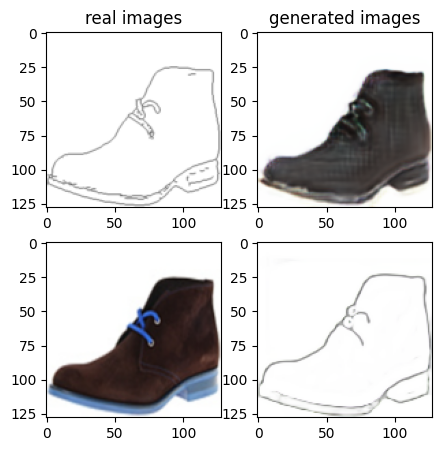

Train Epoch: 2 24% 	Total Loss: 1.345232 	Loss_G_AB: 0.306122	Loss_G_BA: 1.001278	Loss_cycle: 0.470855	Loss_D_A: 0.007229	Loss_D_B: 0.213448
1 62009 T:  1.6989004611968994
Train Epoch: 2 24% 	Total Loss: 1.222292 	Loss_G_AB: 0.280789	Loss_G_BA: 1.002522	Loss_cycle: 0.332077	Loss_D_A: 0.006467	Loss_D_B: 0.242092
1 62019 T:  0.6111037731170654
Train Epoch: 2 24% 	Total Loss: 1.407654 	Loss_G_AB: 0.313285	Loss_G_BA: 0.975516	Loss_cycle: 0.543826	Loss_D_A: 0.003032	Loss_D_B: 0.216396
1 62029 T:  0.7226533889770508
Train Epoch: 2 25% 	Total Loss: 1.416025 	Loss_G_AB: 0.267503	Loss_G_BA: 1.019071	Loss_cycle: 0.481112	Loss_D_A: 0.003788	Loss_D_B: 0.287839
1 62039 T:  0.8778042793273926
Train Epoch: 2 25% 	Total Loss: 1.275083 	Loss_G_AB: 0.359749	Loss_G_BA: 0.994799	Loss_cycle: 0.366383	Loss_D_A: 0.010566	Loss_D_B: 0.220859
1 62049 T:  0.8482184410095215
Train Epoch: 2 25% 	Total Loss: 1.351473 	Loss_G_AB: 0.334476	Loss_G_BA: 0.916907	Loss_cycle: 0.490823	Loss_D_A: 0.009550	Loss_D_B: 0.225410

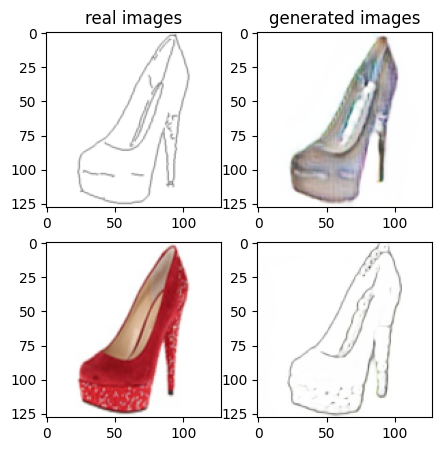

Train Epoch: 2 26% 	Total Loss: 1.436733 	Loss_G_AB: 0.289942	Loss_G_BA: 0.994598	Loss_cycle: 0.534098	Loss_D_A: 0.001427	Loss_D_B: 0.258939
1 63009 T:  2.067272901535034
Train Epoch: 2 26% 	Total Loss: 1.184444 	Loss_G_AB: 0.323530	Loss_G_BA: 0.994023	Loss_cycle: 0.296241	Loss_D_A: 0.001144	Loss_D_B: 0.228283
1 63019 T:  0.8704829216003418
Train Epoch: 2 27% 	Total Loss: 1.333262 	Loss_G_AB: 0.324120	Loss_G_BA: 1.006651	Loss_cycle: 0.442830	Loss_D_A: 0.001470	Loss_D_B: 0.223576
1 63029 T:  0.8876402378082275
Train Epoch: 2 27% 	Total Loss: 1.316198 	Loss_G_AB: 0.294677	Loss_G_BA: 1.006700	Loss_cycle: 0.407770	Loss_D_A: 0.001509	Loss_D_B: 0.256230
1 63039 T:  0.8900578022003174
Train Epoch: 2 27% 	Total Loss: 1.279286 	Loss_G_AB: 0.332803	Loss_G_BA: 0.988090	Loss_cycle: 0.411475	Loss_D_A: 0.001895	Loss_D_B: 0.205470
1 63049 T:  0.6157791614532471
Train Epoch: 2 27% 	Total Loss: 1.472311 	Loss_G_AB: 0.266550	Loss_G_BA: 0.994749	Loss_cycle: 0.511208	Loss_D_A: 0.001300	Loss_D_B: 0.329153


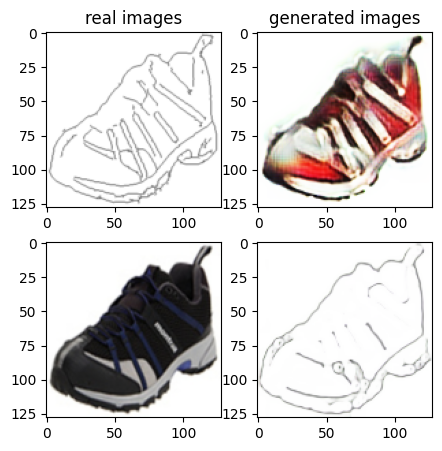

Train Epoch: 2 28% 	Total Loss: 1.305593 	Loss_G_AB: 0.269481	Loss_G_BA: 0.917344	Loss_cycle: 0.425055	Loss_D_A: 0.030969	Loss_D_B: 0.256156
1 64009 T:  1.727722406387329
Train Epoch: 2 28% 	Total Loss: 1.406146 	Loss_G_AB: 0.351506	Loss_G_BA: 0.918585	Loss_cycle: 0.488486	Loss_D_A: 0.048548	Loss_D_B: 0.234067
1 64019 T:  0.5999405384063721
Train Epoch: 2 29% 	Total Loss: 1.203900 	Loss_G_AB: 0.270129	Loss_G_BA: 0.993291	Loss_cycle: 0.302113	Loss_D_A: 0.013456	Loss_D_B: 0.256621
1 64029 T:  0.5916552543640137
Train Epoch: 2 29% 	Total Loss: 1.295136 	Loss_G_AB: 0.331762	Loss_G_BA: 0.993708	Loss_cycle: 0.422710	Loss_D_A: 0.009074	Loss_D_B: 0.200617
1 64039 T:  0.5997345447540283
Train Epoch: 2 29% 	Total Loss: 1.354327 	Loss_G_AB: 0.271183	Loss_G_BA: 0.852772	Loss_cycle: 0.449670	Loss_D_A: 0.078420	Loss_D_B: 0.264258
1 64049 T:  0.6052749156951904
Train Epoch: 2 29% 	Total Loss: 1.448636 	Loss_G_AB: 0.243022	Loss_G_BA: 0.535409	Loss_cycle: 0.494070	Loss_D_A: 0.278922	Loss_D_B: 0.286428


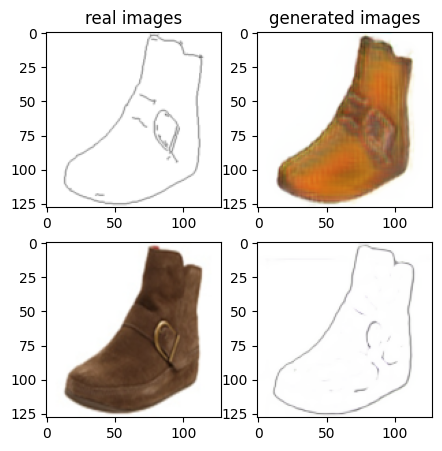

Train Epoch: 2 30% 	Total Loss: 1.156147 	Loss_G_AB: 0.310772	Loss_G_BA: 0.991679	Loss_cycle: 0.285125	Loss_D_A: 0.002692	Loss_D_B: 0.217104
1 65009 T:  1.433598279953003
Train Epoch: 2 30% 	Total Loss: 1.308548 	Loss_G_AB: 0.326251	Loss_G_BA: 1.013067	Loss_cycle: 0.401031	Loss_D_A: 0.002833	Loss_D_B: 0.235025
1 65019 T:  0.5933289527893066
Train Epoch: 2 31% 	Total Loss: 1.250126 	Loss_G_AB: 0.289638	Loss_G_BA: 1.004624	Loss_cycle: 0.358715	Loss_D_A: 0.001091	Loss_D_B: 0.243189
1 65029 T:  0.5716185569763184
Train Epoch: 2 31% 	Total Loss: 1.178586 	Loss_G_AB: 0.304519	Loss_G_BA: 0.989774	Loss_cycle: 0.304965	Loss_D_A: 0.002650	Loss_D_B: 0.223824
1 65039 T:  0.5842463970184326
Train Epoch: 2 31% 	Total Loss: 1.301723 	Loss_G_AB: 0.298471	Loss_G_BA: 0.960193	Loss_cycle: 0.414434	Loss_D_A: 0.014341	Loss_D_B: 0.243616
1 65049 T:  0.5975503921508789
Train Epoch: 2 31% 	Total Loss: 1.272232 	Loss_G_AB: 0.305538	Loss_G_BA: 0.989450	Loss_cycle: 0.385859	Loss_D_A: 0.005894	Loss_D_B: 0.232983


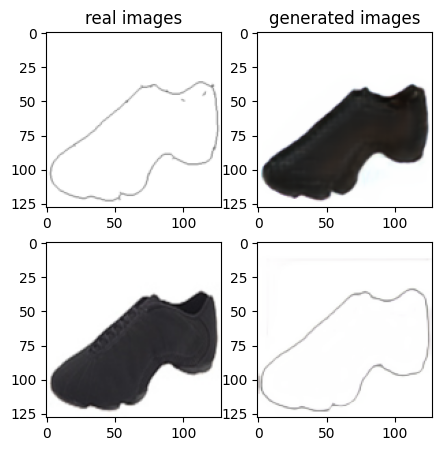

Train Epoch: 2 32% 	Total Loss: 1.341936 	Loss_G_AB: 0.292928	Loss_G_BA: 0.985720	Loss_cycle: 0.436937	Loss_D_A: 0.002126	Loss_D_B: 0.263548
1 66009 T:  1.4234397411346436
Train Epoch: 2 33% 	Total Loss: 1.241582 	Loss_G_AB: 0.288618	Loss_G_BA: 0.965642	Loss_cycle: 0.374559	Loss_D_A: 0.002267	Loss_D_B: 0.237626
1 66019 T:  0.653130054473877
Train Epoch: 2 33% 	Total Loss: 1.321802 	Loss_G_AB: 0.307740	Loss_G_BA: 1.014380	Loss_cycle: 0.410088	Loss_D_A: 0.002064	Loss_D_B: 0.248590
1 66029 T:  0.595935583114624
Train Epoch: 2 33% 	Total Loss: 1.308806 	Loss_G_AB: 0.319000	Loss_G_BA: 1.005977	Loss_cycle: 0.424105	Loss_D_A: 0.002039	Loss_D_B: 0.220174
1 66039 T:  0.6023457050323486
Train Epoch: 2 33% 	Total Loss: 1.348157 	Loss_G_AB: 0.278669	Loss_G_BA: 1.005915	Loss_cycle: 0.443540	Loss_D_A: 0.002719	Loss_D_B: 0.259606
1 66049 T:  0.6132276058197021
Train Epoch: 2 33% 	Total Loss: 1.385717 	Loss_G_AB: 0.345783	Loss_G_BA: 0.976241	Loss_cycle: 0.477976	Loss_D_A: 0.002676	Loss_D_B: 0.244053
1

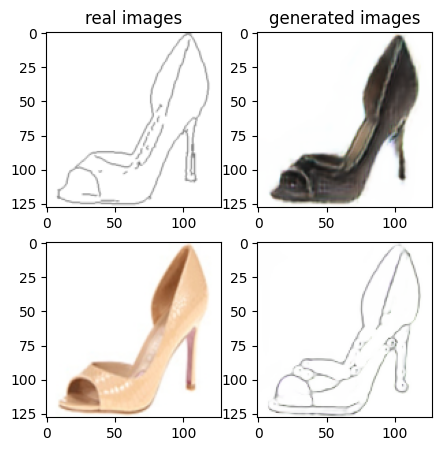

Train Epoch: 2 34% 	Total Loss: 1.310997 	Loss_G_AB: 0.317062	Loss_G_BA: 0.902303	Loss_cycle: 0.423163	Loss_D_A: 0.041677	Loss_D_B: 0.236474
1 67009 T:  1.4225108623504639
Train Epoch: 2 35% 	Total Loss: 1.292877 	Loss_G_AB: 0.289377	Loss_G_BA: 0.754187	Loss_cycle: 0.414050	Loss_D_A: 0.119733	Loss_D_B: 0.237312
1 67019 T:  0.6126041412353516
Train Epoch: 2 35% 	Total Loss: 1.344219 	Loss_G_AB: 0.315528	Loss_G_BA: 0.895929	Loss_cycle: 0.473732	Loss_D_A: 0.034468	Loss_D_B: 0.230291
1 67029 T:  0.6220979690551758
Train Epoch: 2 35% 	Total Loss: 1.246250 	Loss_G_AB: 0.293671	Loss_G_BA: 0.999952	Loss_cycle: 0.364454	Loss_D_A: 0.006898	Loss_D_B: 0.228086
1 67039 T:  0.6085770130157471
Train Epoch: 2 35% 	Total Loss: 1.291533 	Loss_G_AB: 0.283205	Loss_G_BA: 1.016345	Loss_cycle: 0.378715	Loss_D_A: 0.003494	Loss_D_B: 0.259550
1 67049 T:  0.6466653347015381
Train Epoch: 2 35% 	Total Loss: 1.269349 	Loss_G_AB: 0.255273	Loss_G_BA: 0.988005	Loss_cycle: 0.353117	Loss_D_A: 0.005502	Loss_D_B: 0.289090

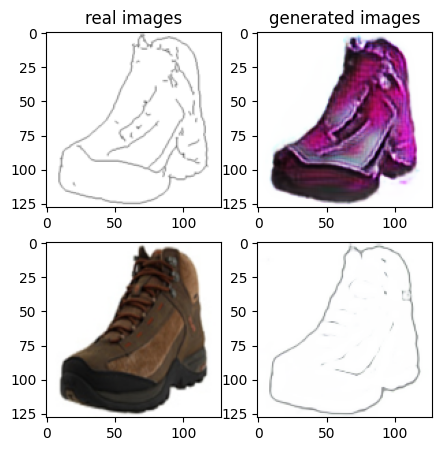

Train Epoch: 2 36% 	Total Loss: 1.307758 	Loss_G_AB: 0.337046	Loss_G_BA: 0.995443	Loss_cycle: 0.409008	Loss_D_A: 0.002340	Loss_D_B: 0.230166
1 68009 T:  1.4833147525787354
Train Epoch: 2 37% 	Total Loss: 1.251239 	Loss_G_AB: 0.274520	Loss_G_BA: 1.002964	Loss_cycle: 0.367799	Loss_D_A: 0.001713	Loss_D_B: 0.242985
1 68019 T:  0.7417781352996826
Train Epoch: 2 37% 	Total Loss: 1.253953 	Loss_G_AB: 0.267380	Loss_G_BA: 1.003742	Loss_cycle: 0.368532	Loss_D_A: 0.001151	Loss_D_B: 0.248709
1 68029 T:  0.8451259136199951
Train Epoch: 2 37% 	Total Loss: 1.297908 	Loss_G_AB: 0.326081	Loss_G_BA: 1.004488	Loss_cycle: 0.380417	Loss_D_A: 0.001518	Loss_D_B: 0.250689
1 68039 T:  0.756263256072998
Train Epoch: 2 37% 	Total Loss: 1.198775 	Loss_G_AB: 0.309998	Loss_G_BA: 0.989049	Loss_cycle: 0.306786	Loss_D_A: 0.002178	Loss_D_B: 0.240287
1 68049 T:  0.7749595642089844
Train Epoch: 2 37% 	Total Loss: 1.393765 	Loss_G_AB: 0.290035	Loss_G_BA: 1.006151	Loss_cycle: 0.495388	Loss_D_A: 0.001327	Loss_D_B: 0.248958


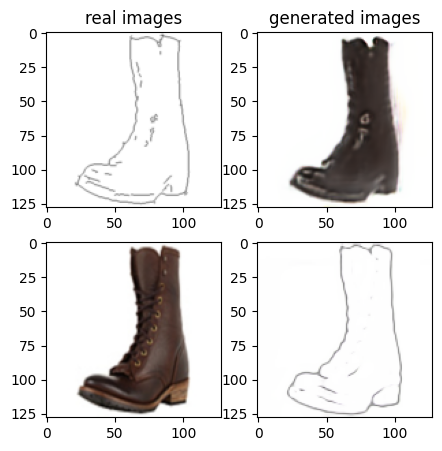

Train Epoch: 2 39% 	Total Loss: 1.252256 	Loss_G_AB: 0.315477	Loss_G_BA: 0.985201	Loss_cycle: 0.370087	Loss_D_A: 0.003051	Loss_D_B: 0.228779
1 69009 T:  2.3018949031829834
Train Epoch: 2 39% 	Total Loss: 1.200156 	Loss_G_AB: 0.287856	Loss_G_BA: 0.996581	Loss_cycle: 0.313779	Loss_D_A: 0.003418	Loss_D_B: 0.240741
1 69019 T:  0.7942545413970947
Train Epoch: 2 39% 	Total Loss: 1.206840 	Loss_G_AB: 0.298322	Loss_G_BA: 0.979922	Loss_cycle: 0.316166	Loss_D_A: 0.008732	Loss_D_B: 0.242820
1 69029 T:  0.9250137805938721
Train Epoch: 2 39% 	Total Loss: 1.341612 	Loss_G_AB: 0.349180	Loss_G_BA: 0.990242	Loss_cycle: 0.430013	Loss_D_A: 0.002456	Loss_D_B: 0.239433
1 69039 T:  0.8358218669891357
Train Epoch: 2 39% 	Total Loss: 1.245310 	Loss_G_AB: 0.287597	Loss_G_BA: 0.993812	Loss_cycle: 0.349687	Loss_D_A: 0.001567	Loss_D_B: 0.253352
1 69049 T:  0.8143644332885742
Train Epoch: 2 39% 	Total Loss: 1.263672 	Loss_G_AB: 0.281202	Loss_G_BA: 0.990100	Loss_cycle: 0.379763	Loss_D_A: 0.002851	Loss_D_B: 0.245408

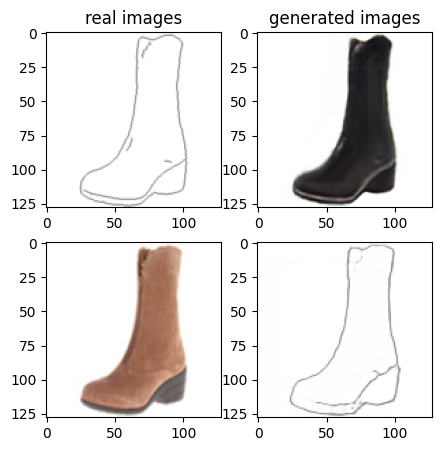

Train Epoch: 2 41% 	Total Loss: 1.254883 	Loss_G_AB: 0.299510	Loss_G_BA: 1.004031	Loss_cycle: 0.361349	Loss_D_A: 0.007025	Loss_D_B: 0.234738
1 70009 T:  1.9650154113769531
Train Epoch: 2 41% 	Total Loss: 1.249869 	Loss_G_AB: 0.300128	Loss_G_BA: 0.967348	Loss_cycle: 0.370311	Loss_D_A: 0.012654	Loss_D_B: 0.233167
1 70019 T:  0.8064844608306885
Train Epoch: 2 41% 	Total Loss: 1.352595 	Loss_G_AB: 0.346540	Loss_G_BA: 1.021194	Loss_cycle: 0.457227	Loss_D_A: 0.002766	Loss_D_B: 0.208735
1 70029 T:  0.5949079990386963
Train Epoch: 2 41% 	Total Loss: 1.257629 	Loss_G_AB: 0.276142	Loss_G_BA: 0.978553	Loss_cycle: 0.369923	Loss_D_A: 0.002679	Loss_D_B: 0.257680
1 70039 T:  0.5822610855102539
Train Epoch: 2 41% 	Total Loss: 1.233425 	Loss_G_AB: 0.313288	Loss_G_BA: 0.989542	Loss_cycle: 0.333628	Loss_D_A: 0.002481	Loss_D_B: 0.245902
1 70049 T:  0.6151440143585205
Train Epoch: 2 41% 	Total Loss: 1.139678 	Loss_G_AB: 0.279276	Loss_G_BA: 0.944863	Loss_cycle: 0.266712	Loss_D_A: 0.014889	Loss_D_B: 0.246008

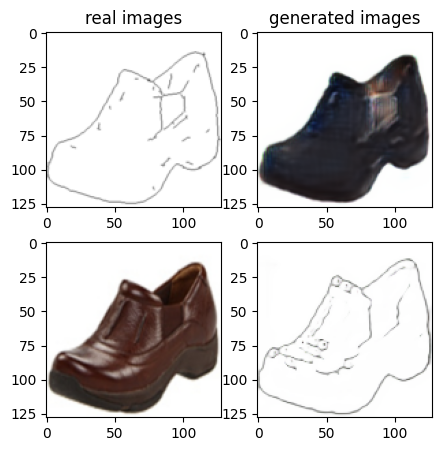

Train Epoch: 2 43% 	Total Loss: 1.263917 	Loss_G_AB: 0.309259	Loss_G_BA: 0.794101	Loss_cycle: 0.379595	Loss_D_A: 0.092208	Loss_D_B: 0.240435
1 71009 T:  1.918625831604004
Train Epoch: 2 43% 	Total Loss: 1.295262 	Loss_G_AB: 0.317195	Loss_G_BA: 0.792033	Loss_cycle: 0.419389	Loss_D_A: 0.085680	Loss_D_B: 0.235579
1 71019 T:  0.5837991237640381
Train Epoch: 2 43% 	Total Loss: 1.346490 	Loss_G_AB: 0.312717	Loss_G_BA: 0.837302	Loss_cycle: 0.472162	Loss_D_A: 0.077956	Loss_D_B: 0.221363
1 71029 T:  0.5849027633666992
Train Epoch: 2 43% 	Total Loss: 1.344455 	Loss_G_AB: 0.315722	Loss_G_BA: 0.825630	Loss_cycle: 0.499345	Loss_D_A: 0.038907	Loss_D_B: 0.235527
1 71039 T:  0.606806755065918
Train Epoch: 2 43% 	Total Loss: 1.384547 	Loss_G_AB: 0.292139	Loss_G_BA: 0.944868	Loss_cycle: 0.498055	Loss_D_A: 0.023671	Loss_D_B: 0.244318
1 71049 T:  0.6131725311279297
Train Epoch: 2 43% 	Total Loss: 1.333682 	Loss_G_AB: 0.294314	Loss_G_BA: 0.915972	Loss_cycle: 0.445553	Loss_D_A: 0.044310	Loss_D_B: 0.238676
1

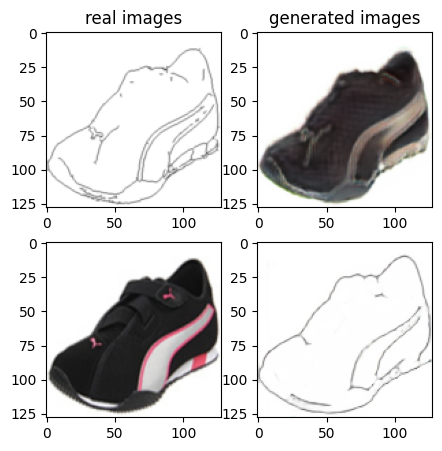

Train Epoch: 2 45% 	Total Loss: 1.260058 	Loss_G_AB: 0.304169	Loss_G_BA: 1.006737	Loss_cycle: 0.353137	Loss_D_A: 0.002734	Loss_D_B: 0.248735
1 72009 T:  1.6190738677978516
Train Epoch: 2 45% 	Total Loss: 1.204728 	Loss_G_AB: 0.337329	Loss_G_BA: 0.989996	Loss_cycle: 0.303125	Loss_D_A: 0.002404	Loss_D_B: 0.235536
1 72019 T:  0.6831278800964355
Train Epoch: 2 45% 	Total Loss: 1.523650 	Loss_G_AB: 0.320089	Loss_G_BA: 0.998338	Loss_cycle: 0.595476	Loss_D_A: 0.002078	Loss_D_B: 0.266882
1 72029 T:  0.6814031600952148
Train Epoch: 2 45% 	Total Loss: 1.333172 	Loss_G_AB: 0.329210	Loss_G_BA: 0.989890	Loss_cycle: 0.406183	Loss_D_A: 0.002492	Loss_D_B: 0.264947
1 72039 T:  0.6944053173065186
Train Epoch: 2 45% 	Total Loss: 1.399298 	Loss_G_AB: 0.329225	Loss_G_BA: 1.016982	Loss_cycle: 0.474770	Loss_D_A: 0.002290	Loss_D_B: 0.249135
1 72049 T:  0.6820089817047119
Train Epoch: 2 45% 	Total Loss: 1.334413 	Loss_G_AB: 0.358798	Loss_G_BA: 1.004548	Loss_cycle: 0.450426	Loss_D_A: 0.001688	Loss_D_B: 0.200626

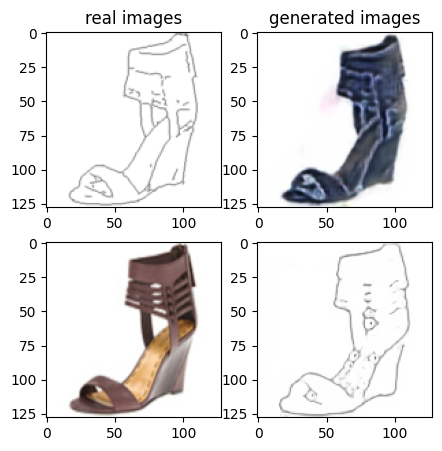

Train Epoch: 2 47% 	Total Loss: 1.213408 	Loss_G_AB: 0.302519	Loss_G_BA: 0.828643	Loss_cycle: 0.349920	Loss_D_A: 0.054339	Loss_D_B: 0.243567
1 73009 T:  1.9172923564910889
Train Epoch: 2 47% 	Total Loss: 1.344599 	Loss_G_AB: 0.338131	Loss_G_BA: 0.904066	Loss_cycle: 0.475357	Loss_D_A: 0.019703	Loss_D_B: 0.228441
1 73019 T:  0.8919539451599121
Train Epoch: 2 47% 	Total Loss: 1.332023 	Loss_G_AB: 0.321823	Loss_G_BA: 1.028773	Loss_cycle: 0.396610	Loss_D_A: 0.009504	Loss_D_B: 0.250611
1 73029 T:  1.0311405658721924
Train Epoch: 2 47% 	Total Loss: 1.349428 	Loss_G_AB: 0.272874	Loss_G_BA: 0.895202	Loss_cycle: 0.482587	Loss_D_A: 0.020296	Loss_D_B: 0.262507
1 73039 T:  0.8374099731445312
Train Epoch: 2 47% 	Total Loss: 1.460299 	Loss_G_AB: 0.309415	Loss_G_BA: 1.058459	Loss_cycle: 0.514357	Loss_D_A: 0.017318	Loss_D_B: 0.244687
1 73049 T:  0.8999741077423096
Train Epoch: 2 47% 	Total Loss: 1.386187 	Loss_G_AB: 0.289436	Loss_G_BA: 0.850060	Loss_cycle: 0.510991	Loss_D_A: 0.028709	Loss_D_B: 0.276739

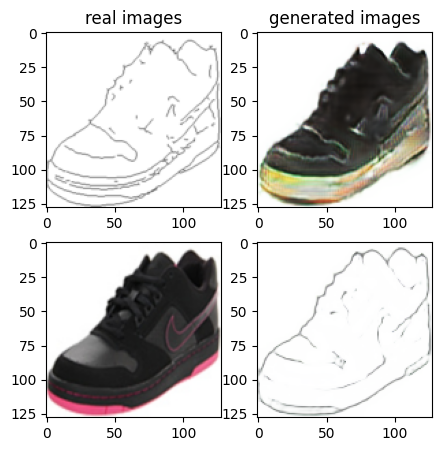

Train Epoch: 2 49% 	Total Loss: 1.300548 	Loss_G_AB: 0.322129	Loss_G_BA: 1.018338	Loss_cycle: 0.396308	Loss_D_A: 0.003427	Loss_D_B: 0.230580
1 74009 T:  1.65761399269104
Train Epoch: 2 49% 	Total Loss: 1.394761 	Loss_G_AB: 0.293934	Loss_G_BA: 0.989028	Loss_cycle: 0.498741	Loss_D_A: 0.002935	Loss_D_B: 0.251604
1 74019 T:  0.664003849029541
Train Epoch: 2 49% 	Total Loss: 1.254500 	Loss_G_AB: 0.416136	Loss_G_BA: 0.960640	Loss_cycle: 0.377272	Loss_D_A: 0.026023	Loss_D_B: 0.162817
1 74029 T:  0.6806473731994629
Train Epoch: 2 49% 	Total Loss: 1.343714 	Loss_G_AB: 0.319882	Loss_G_BA: 1.013374	Loss_cycle: 0.398680	Loss_D_A: 0.004714	Loss_D_B: 0.273692
1 74039 T:  0.6999690532684326
Train Epoch: 2 49% 	Total Loss: 1.240447 	Loss_G_AB: 0.290914	Loss_G_BA: 0.948009	Loss_cycle: 0.373042	Loss_D_A: 0.004835	Loss_D_B: 0.243109
1 74049 T:  0.6610212326049805
Train Epoch: 2 49% 	Total Loss: 1.338166 	Loss_G_AB: 0.323605	Loss_G_BA: 1.038858	Loss_cycle: 0.439214	Loss_D_A: 0.004706	Loss_D_B: 0.213016
1 

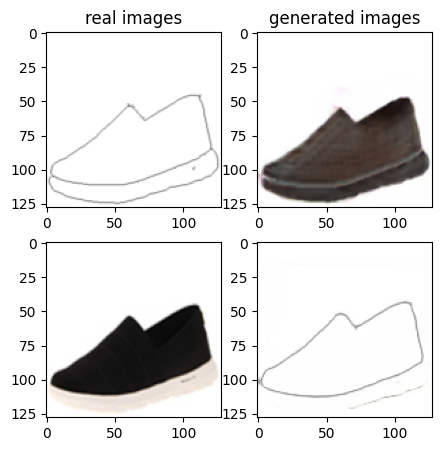

Train Epoch: 2 51% 	Total Loss: 1.232491 	Loss_G_AB: 0.299425	Loss_G_BA: 1.015667	Loss_cycle: 0.339979	Loss_D_A: 0.007235	Loss_D_B: 0.227731
1 75009 T:  1.5353631973266602
Train Epoch: 2 51% 	Total Loss: 1.299751 	Loss_G_AB: 0.300006	Loss_G_BA: 0.993501	Loss_cycle: 0.429525	Loss_D_A: 0.002375	Loss_D_B: 0.221097
1 75019 T:  0.6332442760467529
Train Epoch: 2 51% 	Total Loss: 1.298549 	Loss_G_AB: 0.265057	Loss_G_BA: 1.014722	Loss_cycle: 0.403029	Loss_D_A: 0.001447	Loss_D_B: 0.254184
1 75029 T:  0.6343333721160889
Train Epoch: 2 51% 	Total Loss: 1.387151 	Loss_G_AB: 0.293084	Loss_G_BA: 0.966391	Loss_cycle: 0.525503	Loss_D_A: 0.004201	Loss_D_B: 0.227709
1 75039 T:  0.6734919548034668
Train Epoch: 2 51% 	Total Loss: 1.302113 	Loss_G_AB: 0.306993	Loss_G_BA: 1.002460	Loss_cycle: 0.408339	Loss_D_A: 0.005093	Loss_D_B: 0.233954
1 75049 T:  0.7068593502044678
Train Epoch: 2 51% 	Total Loss: 1.249451 	Loss_G_AB: 0.276851	Loss_G_BA: 0.984861	Loss_cycle: 0.373013	Loss_D_A: 0.006819	Loss_D_B: 0.238762

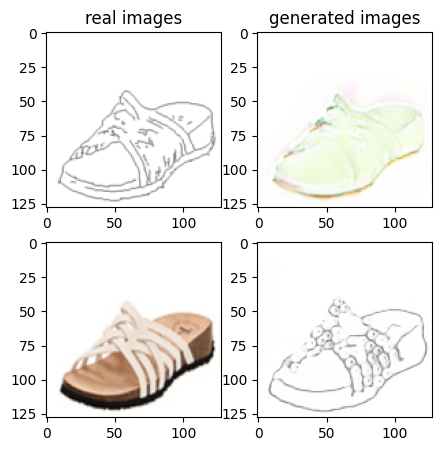

Train Epoch: 2 53% 	Total Loss: 1.429636 	Loss_G_AB: 0.349662	Loss_G_BA: 0.969260	Loss_cycle: 0.465560	Loss_D_A: 0.049685	Loss_D_B: 0.254930
1 76009 T:  2.153862714767456
Train Epoch: 2 53% 	Total Loss: 1.167450 	Loss_G_AB: 0.262079	Loss_G_BA: 0.782512	Loss_cycle: 0.291022	Loss_D_A: 0.078962	Loss_D_B: 0.275170
1 76019 T:  0.8432941436767578
Train Epoch: 2 53% 	Total Loss: 1.414308 	Loss_G_AB: 0.273647	Loss_G_BA: 0.927681	Loss_cycle: 0.544576	Loss_D_A: 0.013343	Loss_D_B: 0.255724
1 76029 T:  0.8414337635040283
Train Epoch: 2 53% 	Total Loss: 1.311474 	Loss_G_AB: 0.303536	Loss_G_BA: 1.069459	Loss_cycle: 0.375957	Loss_D_A: 0.011726	Loss_D_B: 0.237294
1 76039 T:  0.9709248542785645
Train Epoch: 2 53% 	Total Loss: 1.205492 	Loss_G_AB: 0.275962	Loss_G_BA: 0.969521	Loss_cycle: 0.335461	Loss_D_A: 0.007453	Loss_D_B: 0.239837
1 76049 T:  0.8393898010253906
Train Epoch: 2 53% 	Total Loss: 1.180191 	Loss_G_AB: 0.287719	Loss_G_BA: 0.688937	Loss_cycle: 0.314270	Loss_D_A: 0.132933	Loss_D_B: 0.244660


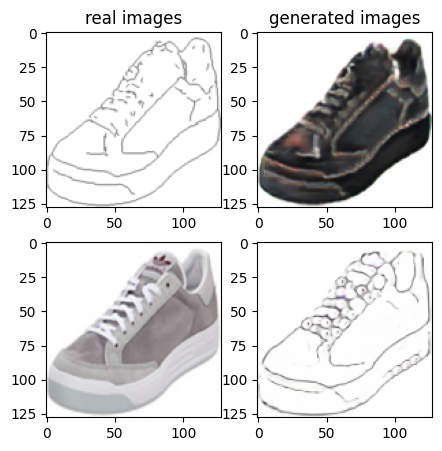

Train Epoch: 2 55% 	Total Loss: 1.250199 	Loss_G_AB: 0.340657	Loss_G_BA: 0.999586	Loss_cycle: 0.357709	Loss_D_A: 0.005573	Loss_D_B: 0.216795
1 77009 T:  1.7177374362945557
Train Epoch: 2 55% 	Total Loss: 1.265897 	Loss_G_AB: 0.285139	Loss_G_BA: 0.968247	Loss_cycle: 0.385897	Loss_D_A: 0.009046	Loss_D_B: 0.244262
1 77019 T:  0.6345229148864746
Train Epoch: 2 55% 	Total Loss: 1.216421 	Loss_G_AB: 0.292825	Loss_G_BA: 0.955165	Loss_cycle: 0.351088	Loss_D_A: 0.010430	Loss_D_B: 0.230908
1 77029 T:  0.654310941696167
Train Epoch: 2 55% 	Total Loss: 1.313640 	Loss_G_AB: 0.270025	Loss_G_BA: 1.011483	Loss_cycle: 0.403145	Loss_D_A: 0.002806	Loss_D_B: 0.266934
1 77039 T:  0.6139316558837891
Train Epoch: 2 55% 	Total Loss: 1.267880 	Loss_G_AB: 0.345072	Loss_G_BA: 0.997873	Loss_cycle: 0.358147	Loss_D_A: 0.004364	Loss_D_B: 0.233896
1 77049 T:  0.6287479400634766
Train Epoch: 2 55% 	Total Loss: 1.231152 	Loss_G_AB: 0.311723	Loss_G_BA: 1.000824	Loss_cycle: 0.341847	Loss_D_A: 0.003610	Loss_D_B: 0.229422


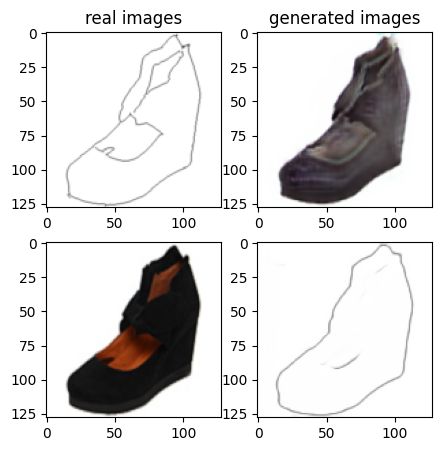

Train Epoch: 2 57% 	Total Loss: 1.271224 	Loss_G_AB: 0.286063	Loss_G_BA: 0.995617	Loss_cycle: 0.388412	Loss_D_A: 0.001400	Loss_D_B: 0.240572
1 78009 T:  1.5274074077606201
Train Epoch: 2 57% 	Total Loss: 1.314569 	Loss_G_AB: 0.268086	Loss_G_BA: 0.991410	Loss_cycle: 0.413702	Loss_D_A: 0.001537	Loss_D_B: 0.269581
1 78019 T:  0.6295261383056641
Train Epoch: 2 57% 	Total Loss: 1.219279 	Loss_G_AB: 0.268204	Loss_G_BA: 0.991239	Loss_cycle: 0.337647	Loss_D_A: 0.002309	Loss_D_B: 0.249602
1 78029 T:  0.6325902938842773
Train Epoch: 2 57% 	Total Loss: 1.289886 	Loss_G_AB: 0.300681	Loss_G_BA: 0.997791	Loss_cycle: 0.383374	Loss_D_A: 0.005229	Loss_D_B: 0.252047
1 78039 T:  0.6534507274627686
Train Epoch: 2 57% 	Total Loss: 1.296319 	Loss_G_AB: 0.273608	Loss_G_BA: 0.980506	Loss_cycle: 0.408676	Loss_D_A: 0.003099	Loss_D_B: 0.257487
1 78049 T:  0.7581067085266113
Train Epoch: 2 57% 	Total Loss: 1.313970 	Loss_G_AB: 0.322458	Loss_G_BA: 1.013760	Loss_cycle: 0.426319	Loss_D_A: 0.001796	Loss_D_B: 0.217746

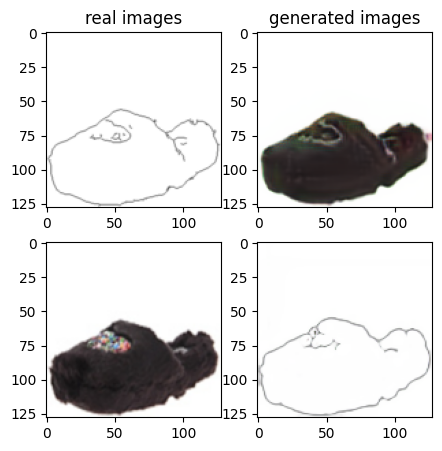

Train Epoch: 2 59% 	Total Loss: 1.291569 	Loss_G_AB: 0.311531	Loss_G_BA: 1.019294	Loss_cycle: 0.374064	Loss_D_A: 0.002690	Loss_D_B: 0.249403
1 79009 T:  2.081883668899536
Train Epoch: 2 59% 	Total Loss: 1.294496 	Loss_G_AB: 0.314050	Loss_G_BA: 1.003088	Loss_cycle: 0.381301	Loss_D_A: 0.001499	Loss_D_B: 0.253128
1 79019 T:  0.8688664436340332
Train Epoch: 2 59% 	Total Loss: 1.226860 	Loss_G_AB: 0.285182	Loss_G_BA: 0.970786	Loss_cycle: 0.355322	Loss_D_A: 0.005032	Loss_D_B: 0.238523
1 79029 T:  0.8467209339141846
Train Epoch: 2 59% 	Total Loss: 1.278032 	Loss_G_AB: 0.311126	Loss_G_BA: 0.982512	Loss_cycle: 0.396446	Loss_D_A: 0.003764	Loss_D_B: 0.231003
1 79039 T:  0.879525899887085
Train Epoch: 2 59% 	Total Loss: 1.290717 	Loss_G_AB: 0.269367	Loss_G_BA: 0.997298	Loss_cycle: 0.384154	Loss_D_A: 0.002211	Loss_D_B: 0.271019
1 79049 T:  0.6209557056427002
Train Epoch: 2 59% 	Total Loss: 1.255570 	Loss_G_AB: 0.232787	Loss_G_BA: 1.012147	Loss_cycle: 0.340987	Loss_D_A: 0.001888	Loss_D_B: 0.290227
1

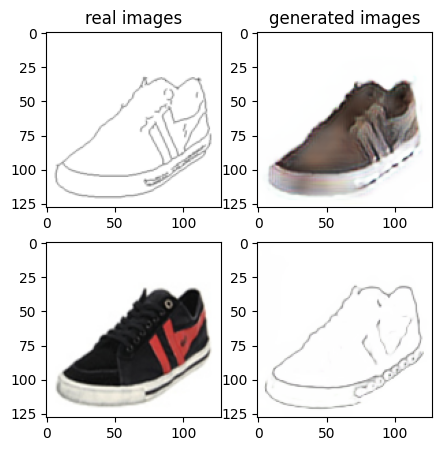

Train Epoch: 2 61% 	Total Loss: 1.196070 	Loss_G_AB: 0.274968	Loss_G_BA: 1.017003	Loss_cycle: 0.283741	Loss_D_A: 0.001735	Loss_D_B: 0.264609
1 80009 T:  1.4971234798431396
Train Epoch: 2 61% 	Total Loss: 1.365205 	Loss_G_AB: 0.335063	Loss_G_BA: 0.999008	Loss_cycle: 0.474413	Loss_D_A: 0.001262	Loss_D_B: 0.222495
1 80019 T:  0.6356017589569092
Train Epoch: 2 61% 	Total Loss: 1.223715 	Loss_G_AB: 0.343357	Loss_G_BA: 0.995973	Loss_cycle: 0.321378	Loss_D_A: 0.000978	Loss_D_B: 0.231694
1 80029 T:  0.6548206806182861
Train Epoch: 2 61% 	Total Loss: 1.285843 	Loss_G_AB: 0.262976	Loss_G_BA: 0.993351	Loss_cycle: 0.383264	Loss_D_A: 0.001032	Loss_D_B: 0.273384
1 80039 T:  0.6455602645874023
Train Epoch: 2 61% 	Total Loss: 1.406387 	Loss_G_AB: 0.402043	Loss_G_BA: 1.002866	Loss_cycle: 0.451376	Loss_D_A: 0.001761	Loss_D_B: 0.250795
1 80049 T:  0.6290462017059326
Train Epoch: 2 61% 	Total Loss: 1.243761 	Loss_G_AB: 0.333910	Loss_G_BA: 1.016755	Loss_cycle: 0.300369	Loss_D_A: 0.001558	Loss_D_B: 0.266502

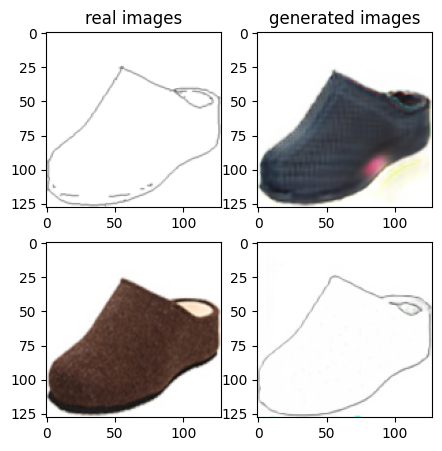

Train Epoch: 2 63% 	Total Loss: 1.295211 	Loss_G_AB: 0.314044	Loss_G_BA: 0.987800	Loss_cycle: 0.413391	Loss_D_A: 0.001201	Loss_D_B: 0.229697
1 81009 T:  1.5596637725830078
Train Epoch: 2 63% 	Total Loss: 1.330210 	Loss_G_AB: 0.335025	Loss_G_BA: 1.014089	Loss_cycle: 0.418209	Loss_D_A: 0.001570	Loss_D_B: 0.235874
1 81019 T:  0.6643538475036621
Train Epoch: 2 63% 	Total Loss: 1.265258 	Loss_G_AB: 0.261246	Loss_G_BA: 0.997190	Loss_cycle: 0.380455	Loss_D_A: 0.001202	Loss_D_B: 0.254384
1 81029 T:  0.6186652183532715
Train Epoch: 2 63% 	Total Loss: 1.279377 	Loss_G_AB: 0.316489	Loss_G_BA: 1.002484	Loss_cycle: 0.394543	Loss_D_A: 0.001492	Loss_D_B: 0.223855
1 81039 T:  0.6449553966522217
Train Epoch: 2 63% 	Total Loss: 1.313103 	Loss_G_AB: 0.305305	Loss_G_BA: 0.994719	Loss_cycle: 0.427837	Loss_D_A: 0.001651	Loss_D_B: 0.233604
1 81049 T:  0.6474747657775879
Train Epoch: 2 63% 	Total Loss: 1.297001 	Loss_G_AB: 0.309082	Loss_G_BA: 0.998935	Loss_cycle: 0.427604	Loss_D_A: 0.001676	Loss_D_B: 0.213712

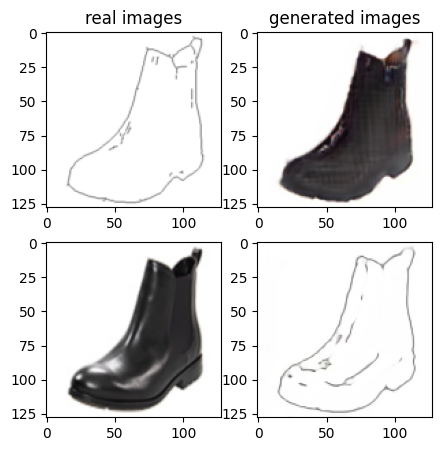

Train Epoch: 2 65% 	Total Loss: 1.251138 	Loss_G_AB: 0.337134	Loss_G_BA: 0.961429	Loss_cycle: 0.361971	Loss_D_A: 0.018491	Loss_D_B: 0.221394
1 82009 T:  1.4751393795013428
Train Epoch: 2 65% 	Total Loss: 1.335027 	Loss_G_AB: 0.247387	Loss_G_BA: 0.927525	Loss_cycle: 0.408080	Loss_D_A: 0.052116	Loss_D_B: 0.287375
1 82019 T:  0.6227056980133057
Train Epoch: 2 65% 	Total Loss: 1.323056 	Loss_G_AB: 0.333814	Loss_G_BA: 0.809321	Loss_cycle: 0.465991	Loss_D_A: 0.059053	Loss_D_B: 0.226445
1 82029 T:  0.6137776374816895
Train Epoch: 2 65% 	Total Loss: 1.369221 	Loss_G_AB: 0.294475	Loss_G_BA: 1.022213	Loss_cycle: 0.392309	Loss_D_A: 0.064592	Loss_D_B: 0.253977
1 82039 T:  0.7271790504455566
Train Epoch: 2 65% 	Total Loss: 1.211424 	Loss_G_AB: 0.275268	Loss_G_BA: 0.965183	Loss_cycle: 0.317145	Loss_D_A: 0.014444	Loss_D_B: 0.259611
1 82049 T:  0.9391231536865234
Train Epoch: 2 65% 	Total Loss: 1.363167 	Loss_G_AB: 0.276211	Loss_G_BA: 1.001859	Loss_cycle: 0.466682	Loss_D_A: 0.006118	Loss_D_B: 0.251333

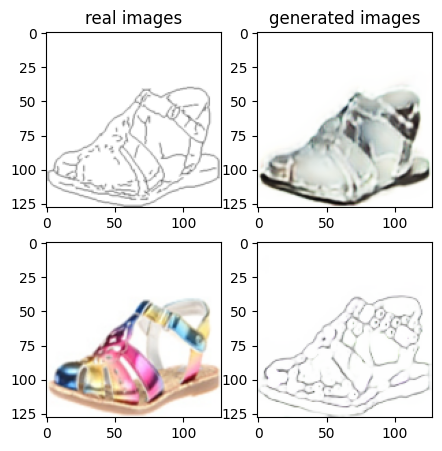

Train Epoch: 2 67% 	Total Loss: 1.353960 	Loss_G_AB: 0.314452	Loss_G_BA: 0.974899	Loss_cycle: 0.442469	Loss_D_A: 0.002068	Loss_D_B: 0.264747
1 83009 T:  2.0209643840789795
Train Epoch: 2 67% 	Total Loss: 1.291524 	Loss_G_AB: 0.273609	Loss_G_BA: 1.019161	Loss_cycle: 0.379979	Loss_D_A: 0.003172	Loss_D_B: 0.261988
1 83019 T:  1.90799880027771
Train Epoch: 2 67% 	Total Loss: 1.282568 	Loss_G_AB: 0.326727	Loss_G_BA: 0.994352	Loss_cycle: 0.359468	Loss_D_A: 0.002098	Loss_D_B: 0.260463
1 83029 T:  0.8436324596405029
Train Epoch: 2 67% 	Total Loss: 1.219101 	Loss_G_AB: 0.317081	Loss_G_BA: 0.971079	Loss_cycle: 0.343536	Loss_D_A: 0.002411	Loss_D_B: 0.229074
1 83039 T:  0.8187336921691895
Train Epoch: 2 67% 	Total Loss: 1.259583 	Loss_G_AB: 0.295966	Loss_G_BA: 1.031444	Loss_cycle: 0.356182	Loss_D_A: 0.002263	Loss_D_B: 0.237433
1 83049 T:  0.8512554168701172
Train Epoch: 2 67% 	Total Loss: 1.177553 	Loss_G_AB: 0.353581	Loss_G_BA: 0.996870	Loss_cycle: 0.280045	Loss_D_A: 0.001544	Loss_D_B: 0.220738
1

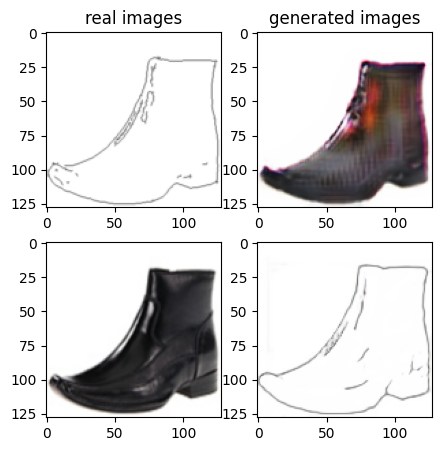

Train Epoch: 2 69% 	Total Loss: 1.220510 	Loss_G_AB: 0.353710	Loss_G_BA: 0.973394	Loss_cycle: 0.295265	Loss_D_A: 0.002657	Loss_D_B: 0.259037
1 84009 T:  2.03302001953125
Train Epoch: 2 69% 	Total Loss: 1.243321 	Loss_G_AB: 0.257464	Loss_G_BA: 1.000006	Loss_cycle: 0.345936	Loss_D_A: 0.002607	Loss_D_B: 0.266044
1 84019 T:  0.6732077598571777
Train Epoch: 2 69% 	Total Loss: 1.282690 	Loss_G_AB: 0.301865	Loss_G_BA: 0.975442	Loss_cycle: 0.398100	Loss_D_A: 0.002847	Loss_D_B: 0.243090
1 84029 T:  0.6201567649841309
Train Epoch: 2 69% 	Total Loss: 1.281492 	Loss_G_AB: 0.302486	Loss_G_BA: 1.036613	Loss_cycle: 0.382036	Loss_D_A: 0.002660	Loss_D_B: 0.227246
1 84039 T:  0.6024947166442871
Train Epoch: 2 69% 	Total Loss: 1.272564 	Loss_G_AB: 0.318232	Loss_G_BA: 1.007991	Loss_cycle: 0.374575	Loss_D_A: 0.002222	Loss_D_B: 0.232655
1 84049 T:  0.6056339740753174
Train Epoch: 2 69% 	Total Loss: 1.317503 	Loss_G_AB: 0.284449	Loss_G_BA: 0.979595	Loss_cycle: 0.422397	Loss_D_A: 0.002645	Loss_D_B: 0.260439
1

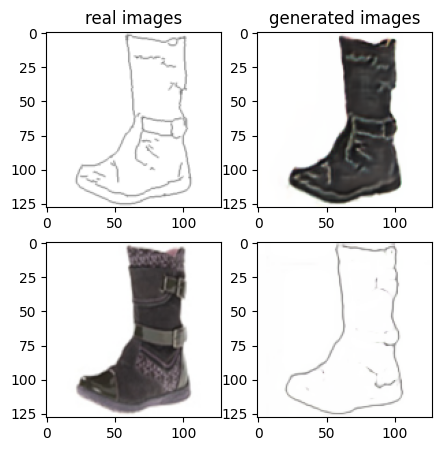

Train Epoch: 2 71% 	Total Loss: 1.275885 	Loss_G_AB: 0.275118	Loss_G_BA: 0.965365	Loss_cycle: 0.405242	Loss_D_A: 0.006600	Loss_D_B: 0.243801
1 85009 T:  1.7130908966064453
Train Epoch: 2 71% 	Total Loss: 1.276610 	Loss_G_AB: 0.294886	Loss_G_BA: 0.986772	Loss_cycle: 0.388985	Loss_D_A: 0.002429	Loss_D_B: 0.244367
1 85019 T:  0.6115825176239014
Train Epoch: 2 71% 	Total Loss: 1.166583 	Loss_G_AB: 0.263109	Loss_G_BA: 1.003030	Loss_cycle: 0.272918	Loss_D_A: 0.004602	Loss_D_B: 0.255994
1 85029 T:  0.63169264793396
Train Epoch: 2 71% 	Total Loss: 1.232058 	Loss_G_AB: 0.288055	Loss_G_BA: 0.979485	Loss_cycle: 0.340732	Loss_D_A: 0.002632	Loss_D_B: 0.254923
1 85039 T:  0.612797737121582
Train Epoch: 2 71% 	Total Loss: 1.201157 	Loss_G_AB: 0.297558	Loss_G_BA: 0.998461	Loss_cycle: 0.308651	Loss_D_A: 0.004066	Loss_D_B: 0.240431
1 85049 T:  0.6335387229919434
Train Epoch: 2 71% 	Total Loss: 1.269650 	Loss_G_AB: 0.313066	Loss_G_BA: 0.947532	Loss_cycle: 0.394014	Loss_D_A: 0.021837	Loss_D_B: 0.223500
1 

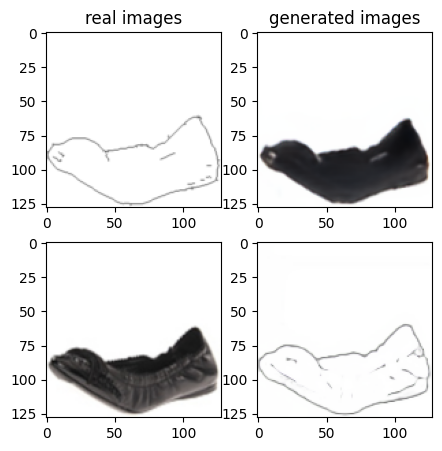

Train Epoch: 2 73% 	Total Loss: 1.280413 	Loss_G_AB: 0.309976	Loss_G_BA: 1.015724	Loss_cycle: 0.339933	Loss_D_A: 0.003852	Loss_D_B: 0.273777
1 86009 T:  1.5374534130096436
Train Epoch: 2 73% 	Total Loss: 1.250670 	Loss_G_AB: 0.319753	Loss_G_BA: 1.003542	Loss_cycle: 0.351722	Loss_D_A: 0.001410	Loss_D_B: 0.235892
1 86019 T:  0.6101560592651367
Train Epoch: 2 73% 	Total Loss: 1.275022 	Loss_G_AB: 0.350059	Loss_G_BA: 1.009951	Loss_cycle: 0.393217	Loss_D_A: 0.001066	Loss_D_B: 0.200734
1 86029 T:  0.6213557720184326
Train Epoch: 2 73% 	Total Loss: 1.290087 	Loss_G_AB: 0.305989	Loss_G_BA: 0.992296	Loss_cycle: 0.385568	Loss_D_A: 0.001029	Loss_D_B: 0.254347
1 86039 T:  0.6100459098815918
Train Epoch: 2 73% 	Total Loss: 1.130010 	Loss_G_AB: 0.289121	Loss_G_BA: 0.992337	Loss_cycle: 0.263584	Loss_D_A: 0.002525	Loss_D_B: 0.223172
1 86049 T:  0.6295797824859619
Train Epoch: 2 73% 	Total Loss: 1.200136 	Loss_G_AB: 0.290574	Loss_G_BA: 1.007325	Loss_cycle: 0.312413	Loss_D_A: 0.001581	Loss_D_B: 0.237192

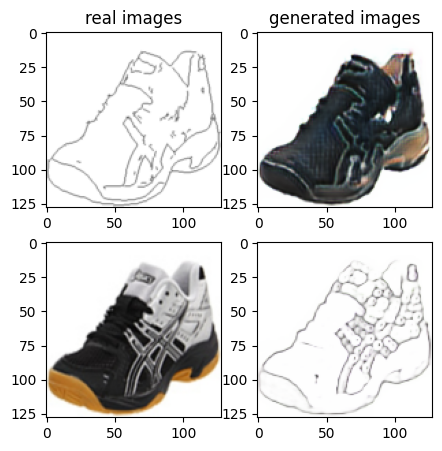

Train Epoch: 2 75% 	Total Loss: 1.321869 	Loss_G_AB: 0.293889	Loss_G_BA: 0.994506	Loss_cycle: 0.445357	Loss_D_A: 0.001523	Loss_D_B: 0.230792
1 87009 T:  1.5497009754180908
Train Epoch: 2 75% 	Total Loss: 1.291176 	Loss_G_AB: 0.298907	Loss_G_BA: 0.989000	Loss_cycle: 0.409926	Loss_D_A: 0.002351	Loss_D_B: 0.234946
1 87019 T:  0.6348774433135986
Train Epoch: 2 75% 	Total Loss: 1.289754 	Loss_G_AB: 0.340562	Loss_G_BA: 1.011887	Loss_cycle: 0.368851	Loss_D_A: 0.004638	Loss_D_B: 0.240042
1 87029 T:  0.9109771251678467
Train Epoch: 2 75% 	Total Loss: 1.198150 	Loss_G_AB: 0.315374	Loss_G_BA: 0.998376	Loss_cycle: 0.330736	Loss_D_A: 0.003395	Loss_D_B: 0.207144
1 87039 T:  0.8585999011993408
Train Epoch: 2 75% 	Total Loss: 1.245347 	Loss_G_AB: 0.309113	Loss_G_BA: 0.996559	Loss_cycle: 0.337261	Loss_D_A: 0.001970	Loss_D_B: 0.253281
1 87049 T:  0.9386324882507324
Train Epoch: 2 75% 	Total Loss: 1.248021 	Loss_G_AB: 0.383111	Loss_G_BA: 1.002255	Loss_cycle: 0.373134	Loss_D_A: 0.001477	Loss_D_B: 0.180727

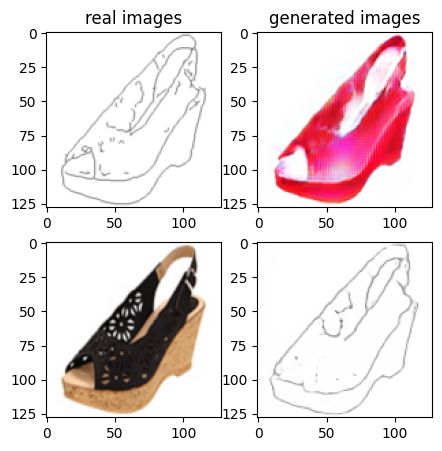

Train Epoch: 2 77% 	Total Loss: 1.386136 	Loss_G_AB: 0.300375	Loss_G_BA: 1.071473	Loss_cycle: 0.420699	Loss_D_A: 0.013023	Loss_D_B: 0.266490
1 88009 T:  2.1246259212493896
Train Epoch: 2 77% 	Total Loss: 1.244232 	Loss_G_AB: 0.284706	Loss_G_BA: 0.945595	Loss_cycle: 0.372213	Loss_D_A: 0.003028	Loss_D_B: 0.253841
1 88019 T:  0.84197998046875
Train Epoch: 2 77% 	Total Loss: 1.304511 	Loss_G_AB: 0.324074	Loss_G_BA: 1.042559	Loss_cycle: 0.393579	Loss_D_A: 0.009347	Loss_D_B: 0.218268
1 88029 T:  0.9014561176300049
Train Epoch: 2 77% 	Total Loss: 1.229987 	Loss_G_AB: 0.311097	Loss_G_BA: 0.978921	Loss_cycle: 0.349974	Loss_D_A: 0.009996	Loss_D_B: 0.225008
1 88039 T:  0.8090829849243164
Train Epoch: 2 77% 	Total Loss: 1.233542 	Loss_G_AB: 0.291181	Loss_G_BA: 0.908924	Loss_cycle: 0.380649	Loss_D_A: 0.011952	Loss_D_B: 0.240888
1 88049 T:  0.8815395832061768
Train Epoch: 2 77% 	Total Loss: 1.268543 	Loss_G_AB: 0.290505	Loss_G_BA: 1.042220	Loss_cycle: 0.353428	Loss_D_A: 0.002405	Loss_D_B: 0.246348
1

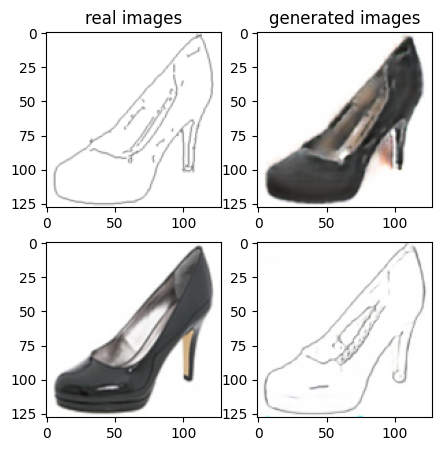

Train Epoch: 2 79% 	Total Loss: 1.258195 	Loss_G_AB: 0.272090	Loss_G_BA: 0.991949	Loss_cycle: 0.367289	Loss_D_A: 0.001139	Loss_D_B: 0.257749
1 89009 T:  1.6352744102478027
Train Epoch: 2 79% 	Total Loss: 1.279251 	Loss_G_AB: 0.307430	Loss_G_BA: 1.000601	Loss_cycle: 0.397969	Loss_D_A: 0.001276	Loss_D_B: 0.225992
1 89019 T:  0.6541199684143066
Train Epoch: 2 79% 	Total Loss: 1.195085 	Loss_G_AB: 0.328914	Loss_G_BA: 1.000104	Loss_cycle: 0.277668	Loss_D_A: 0.001965	Loss_D_B: 0.250943
1 89029 T:  0.6508193016052246
Train Epoch: 2 79% 	Total Loss: 1.137363 	Loss_G_AB: 0.291233	Loss_G_BA: 0.999278	Loss_cycle: 0.257060	Loss_D_A: 0.001449	Loss_D_B: 0.233599
1 89039 T:  0.6158056259155273
Train Epoch: 2 79% 	Total Loss: 1.228407 	Loss_G_AB: 0.314439	Loss_G_BA: 0.998118	Loss_cycle: 0.344426	Loss_D_A: 0.003231	Loss_D_B: 0.224471
1 89049 T:  0.7025740146636963
Train Epoch: 2 79% 	Total Loss: 1.259986 	Loss_G_AB: 0.310732	Loss_G_BA: 1.002494	Loss_cycle: 0.364448	Loss_D_A: 0.001730	Loss_D_B: 0.237194

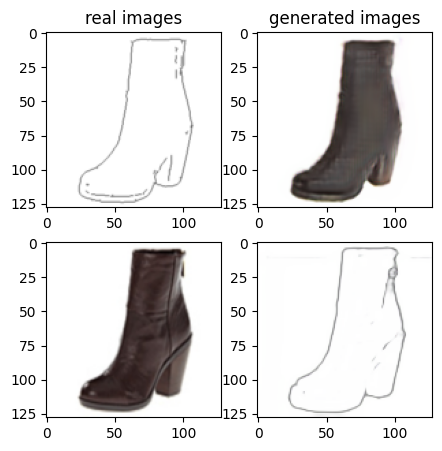

Train Epoch: 2 81% 	Total Loss: 1.321595 	Loss_G_AB: 0.308080	Loss_G_BA: 0.866642	Loss_cycle: 0.459846	Loss_D_A: 0.040213	Loss_D_B: 0.234175
1 90009 T:  1.519705057144165
Train Epoch: 2 81% 	Total Loss: 1.259506 	Loss_G_AB: 0.301335	Loss_G_BA: 0.973096	Loss_cycle: 0.363387	Loss_D_A: 0.014903	Loss_D_B: 0.244002
1 90019 T:  0.6153039932250977
Train Epoch: 2 81% 	Total Loss: 1.231527 	Loss_G_AB: 0.328567	Loss_G_BA: 0.938501	Loss_cycle: 0.365137	Loss_D_A: 0.010396	Loss_D_B: 0.222459
1 90029 T:  0.606297492980957
Train Epoch: 2 81% 	Total Loss: 1.194552 	Loss_G_AB: 0.265201	Loss_G_BA: 0.809855	Loss_cycle: 0.332478	Loss_D_A: 0.074751	Loss_D_B: 0.249795
1 90039 T:  0.6285741329193115
Train Epoch: 2 81% 	Total Loss: 1.411012 	Loss_G_AB: 0.314429	Loss_G_BA: 0.992312	Loss_cycle: 0.468715	Loss_D_A: 0.062521	Loss_D_B: 0.226406
1 90049 T:  0.6130819320678711
Train Epoch: 2 81% 	Total Loss: 1.288222 	Loss_G_AB: 0.268515	Loss_G_BA: 1.018900	Loss_cycle: 0.368511	Loss_D_A: 0.003216	Loss_D_B: 0.272787
1

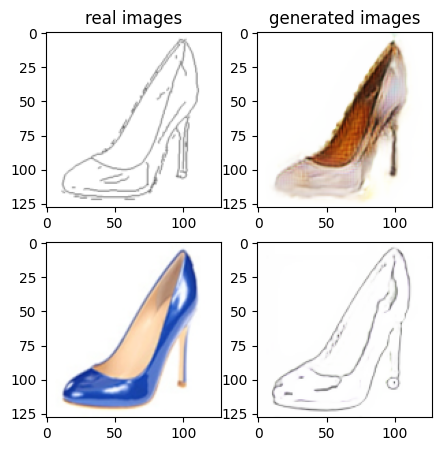

Train Epoch: 2 83% 	Total Loss: 1.301145 	Loss_G_AB: 0.330867	Loss_G_BA: 0.990971	Loss_cycle: 0.398919	Loss_D_A: 0.006592	Loss_D_B: 0.234715
1 91009 T:  1.4942007064819336
Train Epoch: 2 83% 	Total Loss: 1.165390 	Loss_G_AB: 0.328862	Loss_G_BA: 0.968815	Loss_cycle: 0.287637	Loss_D_A: 0.016055	Loss_D_B: 0.212860
1 91019 T:  0.6162121295928955
Train Epoch: 2 83% 	Total Loss: 1.201597 	Loss_G_AB: 0.264227	Loss_G_BA: 0.957153	Loss_cycle: 0.322132	Loss_D_A: 0.003677	Loss_D_B: 0.265098
1 91029 T:  0.6337788105010986
Train Epoch: 2 83% 	Total Loss: 1.228472 	Loss_G_AB: 0.336458	Loss_G_BA: 0.978641	Loss_cycle: 0.316594	Loss_D_A: 0.004081	Loss_D_B: 0.250247
1 91039 T:  0.8593094348907471
Train Epoch: 2 83% 	Total Loss: 1.203272 	Loss_G_AB: 0.288422	Loss_G_BA: 1.017423	Loss_cycle: 0.314967	Loss_D_A: 0.002399	Loss_D_B: 0.232983
1 91049 T:  0.8521275520324707
Train Epoch: 2 83% 	Total Loss: 1.215478 	Loss_G_AB: 0.307850	Loss_G_BA: 0.977032	Loss_cycle: 0.329593	Loss_D_A: 0.006330	Loss_D_B: 0.237114

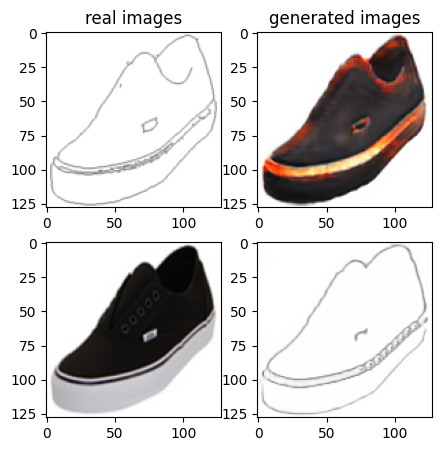

Train Epoch: 2 85% 	Total Loss: 1.291736 	Loss_G_AB: 0.309995	Loss_G_BA: 0.987905	Loss_cycle: 0.387312	Loss_D_A: 0.001754	Loss_D_B: 0.253720
1 92009 T:  2.4652562141418457
Train Epoch: 2 85% 	Total Loss: 1.237972 	Loss_G_AB: 0.276960	Loss_G_BA: 0.923666	Loss_cycle: 0.362668	Loss_D_A: 0.017877	Loss_D_B: 0.257114
1 92019 T:  0.7257735729217529
Train Epoch: 2 85% 	Total Loss: 1.347117 	Loss_G_AB: 0.356092	Loss_G_BA: 0.960525	Loss_cycle: 0.433250	Loss_D_A: 0.008020	Loss_D_B: 0.247538
1 92029 T:  0.6434662342071533
Train Epoch: 2 85% 	Total Loss: 1.328567 	Loss_G_AB: 0.298755	Loss_G_BA: 0.966465	Loss_cycle: 0.421907	Loss_D_A: 0.015006	Loss_D_B: 0.259045
1 92039 T:  0.6331202983856201
Train Epoch: 2 85% 	Total Loss: 1.199130 	Loss_G_AB: 0.290580	Loss_G_BA: 0.872058	Loss_cycle: 0.326067	Loss_D_A: 0.040760	Loss_D_B: 0.250984
1 92049 T:  0.6610562801361084
Train Epoch: 2 85% 	Total Loss: 1.204846 	Loss_G_AB: 0.301875	Loss_G_BA: 0.930826	Loss_cycle: 0.322060	Loss_D_A: 0.035212	Loss_D_B: 0.231224

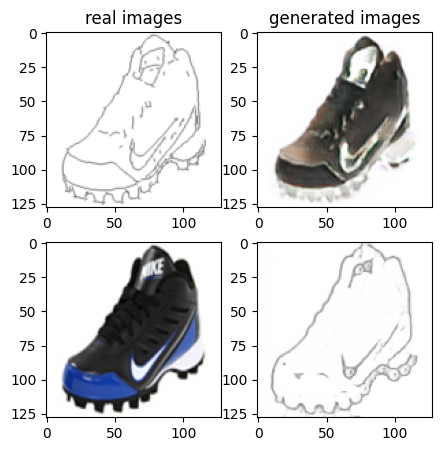

Train Epoch: 2 87% 	Total Loss: 1.365303 	Loss_G_AB: 0.286003	Loss_G_BA: 1.011811	Loss_cycle: 0.468088	Loss_D_A: 0.003339	Loss_D_B: 0.244969
1 93009 T:  1.6202807426452637
Train Epoch: 2 87% 	Total Loss: 1.324892 	Loss_G_AB: 0.253145	Loss_G_BA: 0.999572	Loss_cycle: 0.417139	Loss_D_A: 0.003188	Loss_D_B: 0.278206
1 93019 T:  0.7020294666290283
Train Epoch: 2 87% 	Total Loss: 1.226082 	Loss_G_AB: 0.274340	Loss_G_BA: 0.989384	Loss_cycle: 0.357033	Loss_D_A: 0.002610	Loss_D_B: 0.234577
1 93029 T:  0.7421433925628662
Train Epoch: 2 87% 	Total Loss: 1.249607 	Loss_G_AB: 0.310012	Loss_G_BA: 1.003091	Loss_cycle: 0.333116	Loss_D_A: 0.003943	Loss_D_B: 0.255996
1 93039 T:  0.6601366996765137
Train Epoch: 2 87% 	Total Loss: 1.243277 	Loss_G_AB: 0.281811	Loss_G_BA: 0.989777	Loss_cycle: 0.354830	Loss_D_A: 0.005341	Loss_D_B: 0.247311
1 93049 T:  0.6580672264099121
Train Epoch: 2 87% 	Total Loss: 1.230939 	Loss_G_AB: 0.298212	Loss_G_BA: 0.972516	Loss_cycle: 0.360573	Loss_D_A: 0.005925	Loss_D_B: 0.229077

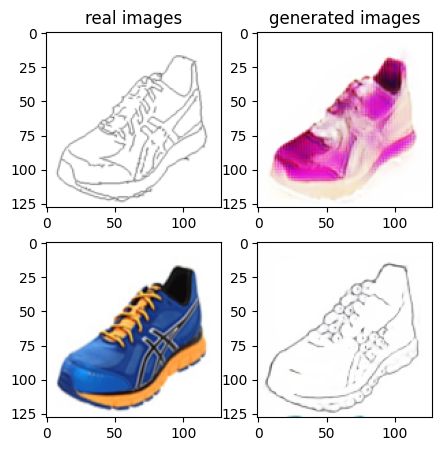

Train Epoch: 2 89% 	Total Loss: 1.331955 	Loss_G_AB: 0.345970	Loss_G_BA: 0.995576	Loss_cycle: 0.425232	Loss_D_A: 0.001571	Loss_D_B: 0.234378
1 94009 T:  2.1321957111358643
Train Epoch: 2 89% 	Total Loss: 1.348397 	Loss_G_AB: 0.314213	Loss_G_BA: 0.985851	Loss_cycle: 0.432776	Loss_D_A: 0.001683	Loss_D_B: 0.263907
1 94019 T:  0.8986649513244629
Train Epoch: 2 89% 	Total Loss: 1.348059 	Loss_G_AB: 0.336497	Loss_G_BA: 0.994205	Loss_cycle: 0.427430	Loss_D_A: 0.002746	Loss_D_B: 0.252531
1 94029 T:  0.8538818359375
Train Epoch: 2 89% 	Total Loss: 1.187763 	Loss_G_AB: 0.302941	Loss_G_BA: 1.003344	Loss_cycle: 0.289273	Loss_D_A: 0.001568	Loss_D_B: 0.243779
1 94039 T:  0.9517996311187744
Train Epoch: 2 89% 	Total Loss: 1.226288 	Loss_G_AB: 0.282001	Loss_G_BA: 0.958080	Loss_cycle: 0.346395	Loss_D_A: 0.003082	Loss_D_B: 0.256770
1 94049 T:  0.9240322113037109
Train Epoch: 2 89% 	Total Loss: 1.275741 	Loss_G_AB: 0.275822	Loss_G_BA: 1.046519	Loss_cycle: 0.347975	Loss_D_A: 0.001999	Loss_D_B: 0.264597
1 

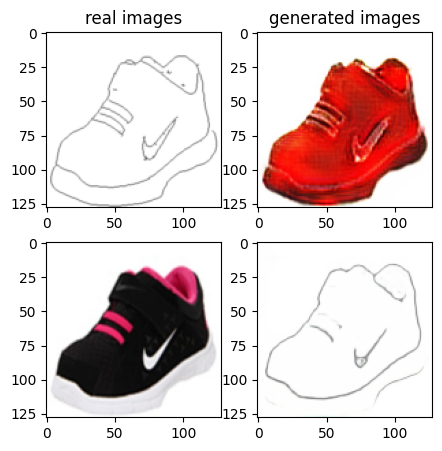

Train Epoch: 2 91% 	Total Loss: 1.248890 	Loss_G_AB: 0.342809	Loss_G_BA: 0.930994	Loss_cycle: 0.363264	Loss_D_A: 0.012312	Loss_D_B: 0.236413
1 95009 T:  2.1743648052215576
Train Epoch: 2 91% 	Total Loss: 1.243998 	Loss_G_AB: 0.287623	Loss_G_BA: 0.954448	Loss_cycle: 0.342111	Loss_D_A: 0.032111	Loss_D_B: 0.248741
1 95019 T:  0.6625270843505859
Train Epoch: 2 91% 	Total Loss: 1.295837 	Loss_G_AB: 0.299222	Loss_G_BA: 0.945237	Loss_cycle: 0.385223	Loss_D_A: 0.054451	Loss_D_B: 0.233934
1 95029 T:  0.664804220199585
Train Epoch: 2 91% 	Total Loss: 1.247375 	Loss_G_AB: 0.317038	Loss_G_BA: 0.836751	Loss_cycle: 0.408477	Loss_D_A: 0.041549	Loss_D_B: 0.220454
1 95039 T:  0.6355671882629395
Train Epoch: 2 91% 	Total Loss: 1.454174 	Loss_G_AB: 0.312431	Loss_G_BA: 0.988302	Loss_cycle: 0.552225	Loss_D_A: 0.045748	Loss_D_B: 0.205835
1 95049 T:  0.6490626335144043
Train Epoch: 2 91% 	Total Loss: 1.196296 	Loss_G_AB: 0.345329	Loss_G_BA: 0.900094	Loss_cycle: 0.345208	Loss_D_A: 0.021149	Loss_D_B: 0.207227


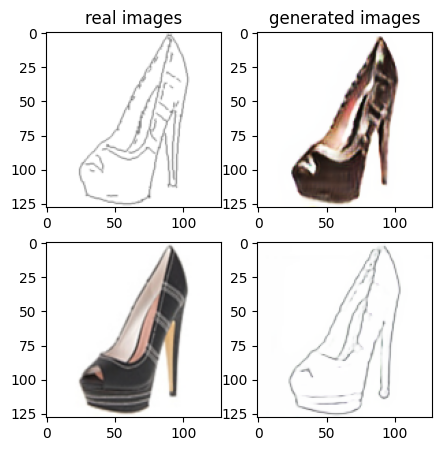

Train Epoch: 2 93% 	Total Loss: 1.256012 	Loss_G_AB: 0.342948	Loss_G_BA: 0.995472	Loss_cycle: 0.339292	Loss_D_A: 0.001540	Loss_D_B: 0.245969
1 96009 T:  1.6727230548858643
Train Epoch: 2 93% 	Total Loss: 1.257443 	Loss_G_AB: 0.346470	Loss_G_BA: 0.984630	Loss_cycle: 0.397275	Loss_D_A: 0.002390	Loss_D_B: 0.192228
1 96019 T:  0.7027015686035156
Train Epoch: 2 93% 	Total Loss: 1.259638 	Loss_G_AB: 0.414434	Loss_G_BA: 0.990940	Loss_cycle: 0.384254	Loss_D_A: 0.001787	Loss_D_B: 0.170910
1 96029 T:  0.6925861835479736
Train Epoch: 2 93% 	Total Loss: 1.337302 	Loss_G_AB: 0.233246	Loss_G_BA: 0.981889	Loss_cycle: 0.448225	Loss_D_A: 0.002227	Loss_D_B: 0.279282
1 96039 T:  0.6757290363311768
Train Epoch: 2 93% 	Total Loss: 1.327135 	Loss_G_AB: 0.404808	Loss_G_BA: 1.006749	Loss_cycle: 0.451850	Loss_D_A: 0.002087	Loss_D_B: 0.167420
1 96049 T:  0.8761184215545654
Train Epoch: 2 93% 	Total Loss: 1.314084 	Loss_G_AB: 0.368874	Loss_G_BA: 0.999430	Loss_cycle: 0.337362	Loss_D_A: 0.003258	Loss_D_B: 0.289313

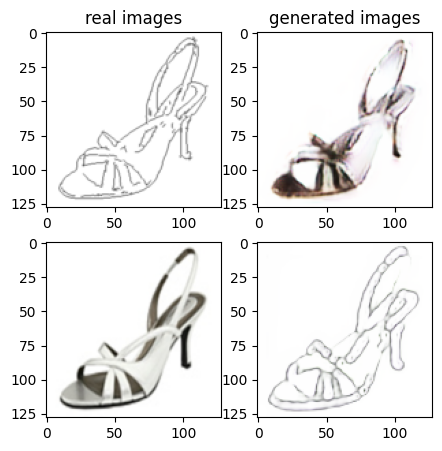

Train Epoch: 2 95% 	Total Loss: 1.196654 	Loss_G_AB: 0.299718	Loss_G_BA: 0.999515	Loss_cycle: 0.314109	Loss_D_A: 0.001783	Loss_D_B: 0.231146
1 97009 T:  1.883298397064209
Train Epoch: 2 95% 	Total Loss: 1.161213 	Loss_G_AB: 0.312579	Loss_G_BA: 0.981432	Loss_cycle: 0.289648	Loss_D_A: 0.001591	Loss_D_B: 0.222970
1 97019 T:  0.7164549827575684
Train Epoch: 2 95% 	Total Loss: 1.286615 	Loss_G_AB: 0.306221	Loss_G_BA: 1.010388	Loss_cycle: 0.398369	Loss_D_A: 0.002300	Loss_D_B: 0.227642
1 97029 T:  0.7258999347686768
Train Epoch: 2 95% 	Total Loss: 1.221987 	Loss_G_AB: 0.385681	Loss_G_BA: 0.977710	Loss_cycle: 0.312093	Loss_D_A: 0.002797	Loss_D_B: 0.225402
1 97039 T:  0.7028970718383789
Train Epoch: 2 95% 	Total Loss: 1.263071 	Loss_G_AB: 0.289380	Loss_G_BA: 1.009520	Loss_cycle: 0.364817	Loss_D_A: 0.002106	Loss_D_B: 0.246698
1 97049 T:  0.701836109161377
Train Epoch: 2 95% 	Total Loss: 1.260441 	Loss_G_AB: 0.315829	Loss_G_BA: 1.014366	Loss_cycle: 0.367300	Loss_D_A: 0.002314	Loss_D_B: 0.225730
1

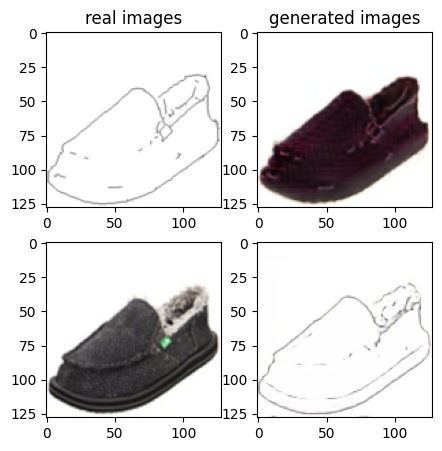

Train Epoch: 2 97% 	Total Loss: 1.284001 	Loss_G_AB: 0.276486	Loss_G_BA: 0.961626	Loss_cycle: 0.416015	Loss_D_A: 0.007316	Loss_D_B: 0.241613
1 98009 T:  1.7060656547546387
Train Epoch: 2 97% 	Total Loss: 1.364646 	Loss_G_AB: 0.511535	Loss_G_BA: 0.975465	Loss_cycle: 0.418425	Loss_D_A: 0.006671	Loss_D_B: 0.196051
1 98019 T:  0.8030717372894287
Train Epoch: 2 97% 	Total Loss: 1.358825 	Loss_G_AB: 0.320837	Loss_G_BA: 0.883653	Loss_cycle: 0.435525	Loss_D_A: 0.015708	Loss_D_B: 0.305347
1 98029 T:  0.964045524597168
Train Epoch: 2 97% 	Total Loss: 1.370957 	Loss_G_AB: 0.344961	Loss_G_BA: 1.052965	Loss_cycle: 0.396593	Loss_D_A: 0.014645	Loss_D_B: 0.260756
1 98039 T:  0.9199934005737305
Train Epoch: 2 97% 	Total Loss: 1.345664 	Loss_G_AB: 0.443233	Loss_G_BA: 1.038837	Loss_cycle: 0.419746	Loss_D_A: 0.004240	Loss_D_B: 0.180643
1 98049 T:  0.9803078174591064
Train Epoch: 2 97% 	Total Loss: 1.312371 	Loss_G_AB: 0.304893	Loss_G_BA: 1.012675	Loss_cycle: 0.393421	Loss_D_A: 0.001896	Loss_D_B: 0.258270


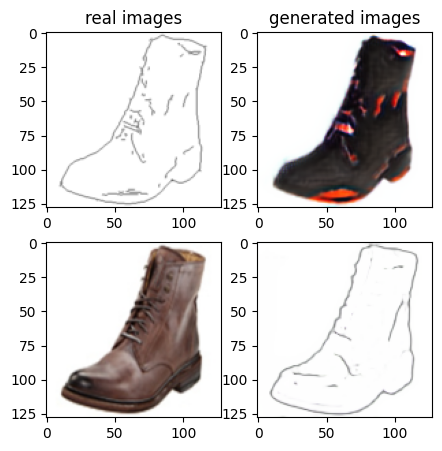

Train Epoch: 2 99% 	Total Loss: 1.197015 	Loss_G_AB: 0.263754	Loss_G_BA: 0.942939	Loss_cycle: 0.328438	Loss_D_A: 0.012376	Loss_D_B: 0.252854
1 99009 T:  1.6141510009765625
Train Epoch: 2 99% 	Total Loss: 1.223465 	Loss_G_AB: 0.291598	Loss_G_BA: 1.019475	Loss_cycle: 0.310691	Loss_D_A: 0.014647	Loss_D_B: 0.242590
1 99019 T:  0.7185249328613281
Train Epoch: 2 99% 	Total Loss: 1.338469 	Loss_G_AB: 0.258918	Loss_G_BA: 0.823360	Loss_cycle: 0.458001	Loss_D_A: 0.074843	Loss_D_B: 0.264486
1 99029 T:  0.7028589248657227
Train Epoch: 2 99% 	Total Loss: 1.359010 	Loss_G_AB: 0.307954	Loss_G_BA: 0.975228	Loss_cycle: 0.429274	Loss_D_A: 0.039882	Loss_D_B: 0.248263
1 99039 T:  0.672745943069458
Train Epoch: 2 99% 	Total Loss: 1.242955 	Loss_G_AB: 0.320331	Loss_G_BA: 0.951011	Loss_cycle: 0.376896	Loss_D_A: 0.019562	Loss_D_B: 0.210827
1 99049 T:  0.7036609649658203
Train Epoch: 2 99% 	Total Loss: 1.270984 	Loss_G_AB: 0.313832	Loss_G_BA: 0.888815	Loss_cycle: 0.398098	Loss_D_A: 0.036391	Loss_D_B: 0.235171


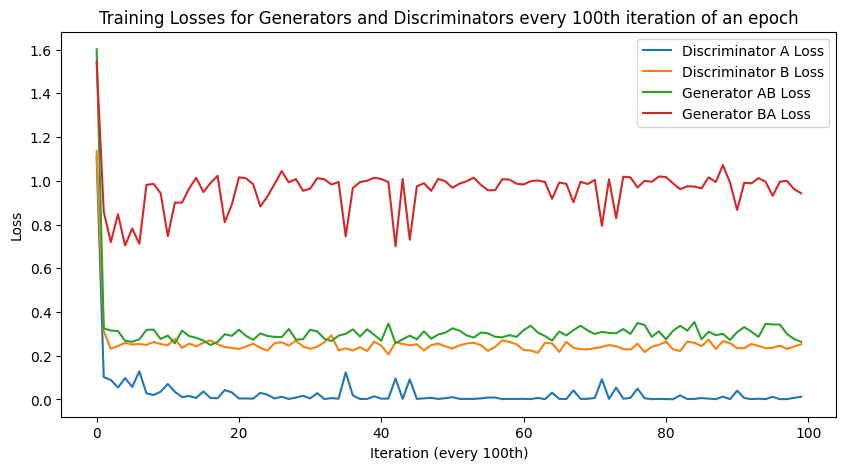

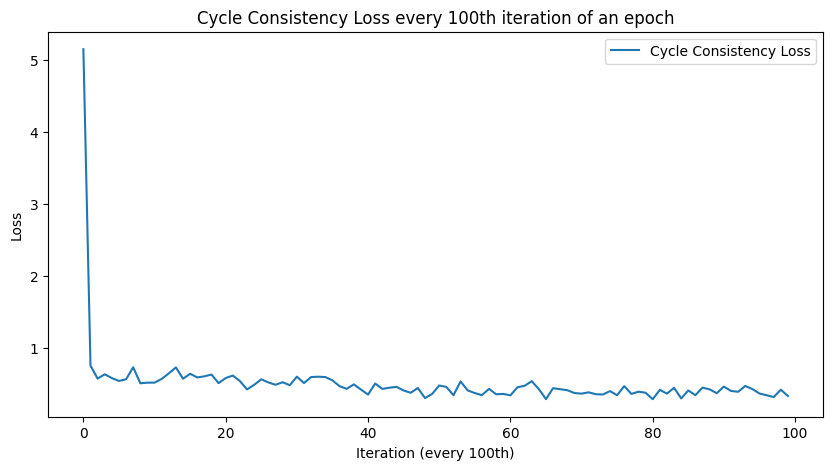

CPU times: user 1h 48min 47s, sys: 1min 11s, total: 1h 49min 59s
Wall time: 1h 56min 7s


In [9]:
%%time
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
#from datasets import *
from datasets import *

from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
#train_img_dir = './edges2shoes/train/'

train_img_dir = '/content/train/'

img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
#lr_rate = 0.0002      # Adam optimizer learning rate
lr_rate_G = 0.0002
lr_rate_D = 0.0001
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000      # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator

#models file have the architecture for generator and discriminator. we initialize them here
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)



# Define optimizer
#optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
#optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
#optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate_G, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate_D, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate_D, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

# loss_D_A = []
# loss_D_B = []
# loss_GAN_AB = []
# loss_GAN_BA = []
# loss_cycle = []
# total_loss = []

# we will store losses everytime we are reporting
# this way we get 9965 losses. We can show losses at the end every 100 iterations or so leading to 100 points in plot
loss_D_A_history = []
loss_D_B_history = []
loss_GAN_AB_history = []
loss_GAN_BA_history = []
loss_cycle_history = []
total_loss_history = []
# Training
counter = 0
total_steps = len(train_loader)*num_epochs; step = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()


        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B, D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()





        # add all losses
        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq,
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq,
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq,
                    running_loss_D_B/report_feq))

            #now store losses in list for plot
            loss_D_A_history.append(running_loss_D_A/report_feq,)
            loss_D_B_history.append(running_loss_D_B/report_feq,)
            loss_GAN_AB_history.append(running_loss_GAN_AB/report_feq,)
            loss_GAN_BA_history.append(running_loss_GAN_BA/report_feq,)
            loss_cycle_history.append(running_loss_cycle/report_feq,)
            total_loss_history.append(running_total_loss/report_feq,)

            #now reset once saved
            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))

            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        if step % save_feq == save_feq-1:
          """
            if not os.path.exists('models'): os.mkdir('models')
            torch.save(G_AB, '/content/models/G_AB.pt')
            torch.save(G_BA, '/content/models/G_BA.pt')
            # feel free to save checkpoint if you need retrain the model...
          """
          #we will do checkpointing
          checkpoint_filename = f'checkpoint_step_{step}.pt'
          checkpoint_path = os.path.join('/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/cyclegan_losses2/', checkpoint_filename)

          checkpoint = {
              #store losses list
              "loss_D_A": loss_D_A_history,
              "loss_D_B": loss_D_B_history,
              "loss_GAN_AB": loss_GAN_AB_history,
              "loss_GAN_BA": loss_GAN_BA_history,
              "loss_cycle": loss_cycle_history,
              "loss_total": total_loss_history,
              #store generators and discriminators since they are getting updated in backprop
              "G_AB": G_AB.state_dict(),
              "G_BA": G_BA.state_dict(),
              "D_A": D_A.state_dict(),
              "D_B": D_B.state_dict(),
                        }
          torch.save(checkpoint, checkpoint_path)
          #counter+=1
          #if(counter==6):
            #5 models saved (5000iterations done) -> break and see ouur 5 losses history
            #break




        #increment step initialized before training begins
        step += 1
    #break from outer loop
    #if(counter==6):
      #break

#now plot losses appended every 100th iterations -> 100 plots
plt.figure(figsize=(10, 5))
plt.plot(loss_D_A_history[::100], label='Discriminator A Loss')
plt.plot(loss_D_B_history[::100], label='Discriminator B Loss')
plt.plot(loss_GAN_AB_history[::100], label='Generator AB Loss')
plt.plot(loss_GAN_BA_history[::100], label='Generator BA Loss')
plt.title('Training Losses for Generators and Discriminators every 100th iteration of an epoch')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(loss_cycle_history[::100], label='Cycle Consistency Loss')
plt.title('Cycle Consistency Loss')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.title('Cycle Consistency Loss every 100th iteration of an epoch')
plt.legend()
plt.show()


### Model ran for full 2 epochs when trained with two different learning rates

In [10]:
#load model
#ckt = torch.load('/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/cyclegan_losses/checkpoint_step_90999.pt',map_location=torch.device('cpu'))
ckt = torch.load('/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/cyclegan_losses2/checkpoint_step_98999.pt',map_location=torch.device('cpu'))


#loading losses for plotting
loss_D_A_history = ckt['loss_D_A']
loss_D_B_history = ckt['loss_D_B']
loss_GAN_AB_history = ckt['loss_GAN_AB']
loss_GAN_BA_history = ckt['loss_GAN_BA']
loss_cycle_history = ckt['loss_cycle']
total_loss_history = ckt['loss_total']
loss_D_A_history = ckt['loss_D_A']

#loading generator & discriminator object
img_shape = (3, 128, 128)
input_shape = img_shape
n_residual_blocks = 6

G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)
G_AB.load_state_dict(ckt['G_AB'])
G_BA.load_state_dict(ckt['G_BA'])
D_A.load_state_dict(ckt['D_A'])
D_B.load_state_dict(ckt['D_B'])


<All keys matched successfully>

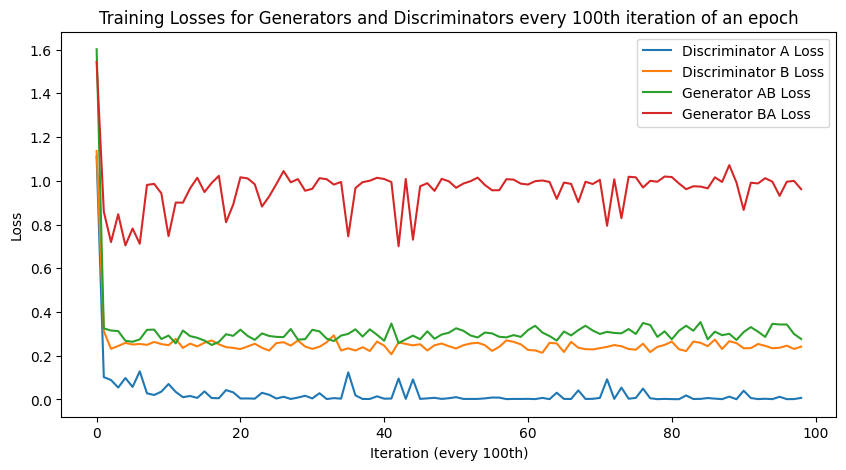

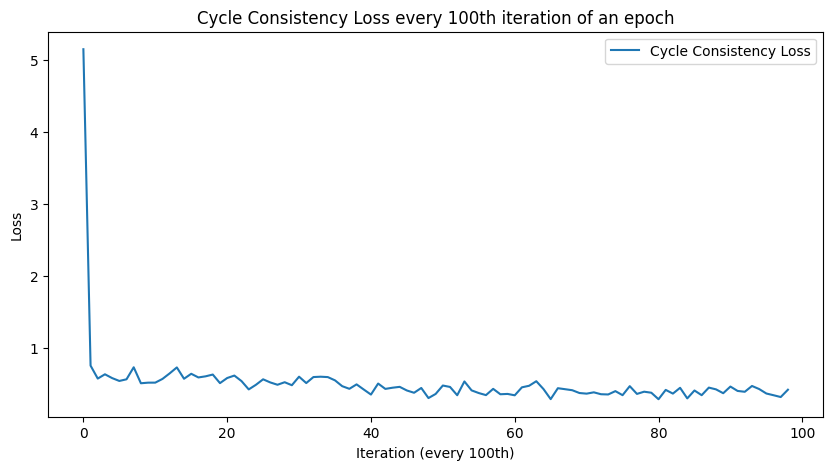

In [11]:
plt.figure(figsize=(10, 5))
plt.plot(loss_D_A_history[::100], label='Discriminator A Loss')
plt.plot(loss_D_B_history[::100], label='Discriminator B Loss')
plt.plot(loss_GAN_AB_history[::100], label='Generator AB Loss')
plt.plot(loss_GAN_BA_history[::100], label='Generator BA Loss')
plt.title('Training Losses for Generators and Discriminators every 100th iteration of an epoch')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(loss_cycle_history[::100], label='Cycle Consistency Loss')
plt.title('Cycle Consistency Loss')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.title('Cycle Consistency Loss every 100th iteration of an epoch')
plt.legend()
plt.show()

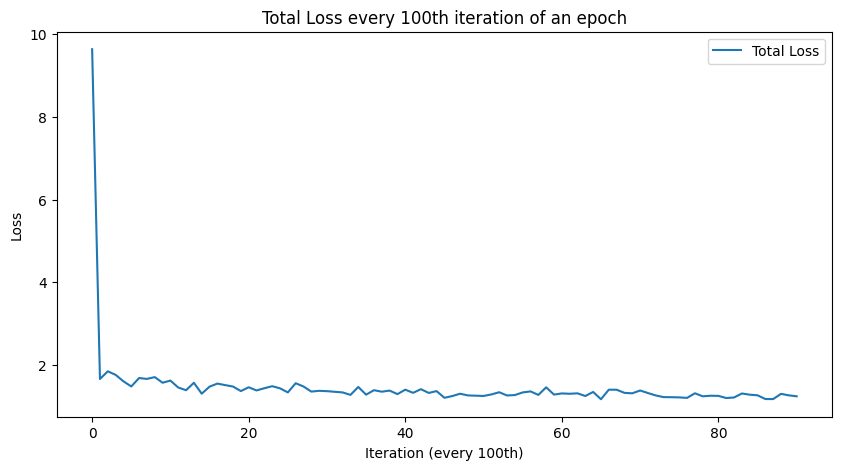

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(total_loss_history[::100], label='Total Loss')
plt.title('Total Loss')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.title('Total Loss every 100th iteration of an epoch')
plt.legend()
plt.show()

# CycleGAN testing (TODO)

In [12]:
from torch.utils.data import DataLoader, TensorDataset
test_batch_size = 1
#test_img_dir = './edges2shoes/val/'
test_img_dir = '/content/val/'

test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#already loaded above
#G_AB = torch.load('/content/models/G_AB.pt')
#G_BA = torch.load('/content/models/G_BA.pt')
cuda = torch.cuda.is_available()

if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)

In [14]:
# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

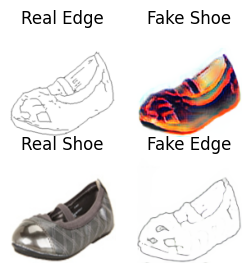

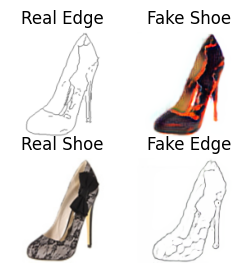

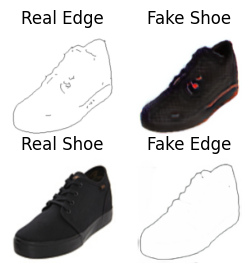

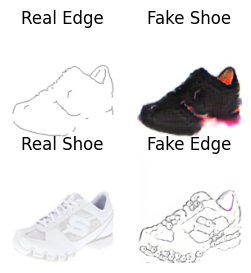

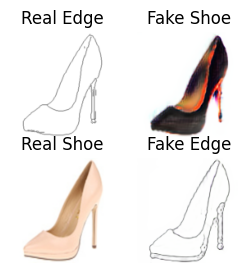

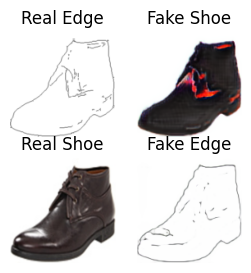

In [17]:
G_AB.eval()
G_BA.eval()
################################
# Please visualize real_edge, fake_shoe, real_shoe, fake_edge in 2-by-2 grids:
for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)


    fake_A = G_BA(real_B)  #torch.Size([1, 3, 128, 128])
    fake_A = denorm(fake_A.detach())
    #fake_A = fake_A.numpy().astype(np.uint8).transpose(0,2,3,1)
    fake_A = fake_A.cpu().numpy().astype(np.uint8).transpose(0,2,3,1)

    fake_B = G_AB(real_A)  #torch.Size([1, 3, 128, 128])
    fake_B = denorm(fake_B.detach())
    #print(fake_B[0])
    #fake_B = fake_B.numpy().astype(np.uint8).transpose(0,2,3,1)
    fake_B = fake_B.cpu().numpy().astype(np.uint8).transpose(0,2,3,1)

    real_A = denorm(real_A.detach())
    #real_A = real_A.numpy().astype(np.uint8).transpose(0,2,3,1)
    real_A = real_A.cpu().numpy().astype(np.uint8).transpose(0,2,3,1)

    real_B = denorm(real_B.detach())
    #real_B = real_B.numpy().astype(np.uint8).transpose(0,2,3,1)
    real_B = real_B.cpu().numpy().astype(np.uint8).transpose(0,2,3,1)
    #print(fake_A.shape)

    fig,axes = plt.subplots(2,2, figsize = (3,3))
    axes[0, 0].imshow(real_A[0])
    axes[0, 0].set_title("Real Edge")
    axes[0, 0].axis('off')

    axes[0, 1].imshow(fake_B[0])
    axes[0, 1].set_title("Fake Shoe")
    axes[0, 1].axis('off')

    axes[1, 0].imshow(real_B[0])
    axes[1, 0].set_title("Real Shoe")
    axes[1, 0].axis('off')

    axes[1, 1].imshow(fake_A[0])
    axes[1, 1].set_title("Fake Edge")
    axes[1, 1].axis('off')

    if(idx == 5):
      break



################################



# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [18]:
! mkdir real_A_1 real_A_2 gen_A
! mkdir real_B_1 real_B_2 gen_B

In [19]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
#test_img_dir = './edges2shoes/val/'
test_img_dir = '/content/val/'


test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load learnt Generator G_AB and G_BA
#G_AB = torch.load('/content/models/G_AB.pt').to(device)
#G_BA = torch.load('/content/models/G_BA.pt').to(device)
G_AB.load_state_dict(ckt['G_AB'])
G_BA.load_state_dict(ckt['G_BA'])

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)

    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))

        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('./real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('./real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)

    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))



## Compute FID score

In [20]:
! pip install pytorch-fid

In [21]:
! pip install scipy==1.11.1
# to avoid ValueError: Imaginary component

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.3/36.3 MB 16.4 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.3
    Uninstalling scipy-1.11.3:
      Successfully uninstalled scipy-1.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.


In [22]:
print('computing FID score between real_edge_1 and real_edge_2')
#! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2' --gpu 0
! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2'


print('computing FID score between real_edge_1 and gen_edge')
#! python -m pytorch_fid '/content/real_A_1' '/content/gen_A' --gpu 0
! python -m pytorch_fid '/content/real_A_1' '/content/gen_A'


print('computing FID score between real_shoe_1 and real_shoe_2')
#! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2' --gpu 0
! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2'


print('computing FID score between real_shoe_1 and gen_shoe')
#! python -m pytorch_fid '/content/real_B_1' '/content/gen_B' --gpu 0
! python -m pytorch_fid '/content/real_B_1' '/content/gen_B'

computing FID score between real_edge_1 and real_edge_2
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:00<00:00, 265MB/s]
100% 2/2 [00:02<00:00,  1.29s/it]
100% 2/2 [00:00<00:00,  2.67it/s]
FID:  49.445948773750985
computing FID score between real_edge_1 and gen_edge
100% 2/2 [00:00<00:00,  3.92it/s]
100% 2/2 [00:00<00:00,  6.92it/s]
FID:  72.18188015626862
computing FID score between real_shoe_1 and real_shoe_2
100% 2/2 [00:00<00:00,  3.72it/s]
100% 2/2 [00:00<00:00,  6.59it/s]
FID:  59.58885942844975
computing FID score between real_shoe_1 and gen_shoe
100% 2/2 [00:00<00:00,  3.68it/s]
100% 2/2 [00:00<00:00,  6.10it/s]
FID:  161.0324641672321


## Compute IS score

#### upload inception.py

In [24]:
from inception_score import inception_score

import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
print(inception_score(real_A_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
#print(inception_score(real_A_dataset_1, cuda=False, batch_size=64, resize=True, splits=1))

print('IS score for gen_edge data set:')
print(inception_score(gen_dataset_A, cuda=True, batch_size=64, resize=True, splits=1))
#print(inception_score(gen_dataset_A, cuda=False, batch_size=64, resize=True, splits=1))



print('IS score for real_shoe_1:')
print(inception_score(real_B_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
#print(inception_score(real_B_dataset_1, cuda=False, batch_size=64, resize=True, splits=1))

print('IS score for gen_shoe data set:')
print(inception_score(gen_dataset_B, cuda=True, batch_size=64, resize=True, splits=1))
#print(inception_score(gen_dataset_B, cuda=False, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:
(1.0031845324999558, 0.0)
IS score for gen_edge data set:
(1.0043012541355028, 0.0)
IS score for real_shoe_1:
(3.450902136659301, 0.0)
IS score for gen_shoe data set:
(3.437892180669382, 0.0)
